# Baseline survey cadence evolution: v5.3

In [1]:
# import necessary and useful packages
import os
import numpy as np
import matplotlib.pyplot as plt
import colorcet
import cycler
import pandas as pd
import healpy as hp
import rubin_sim.maf as maf

This notebook explores summary metric comparison across different simulations, primarily in the comparison of these metrics across the evolution of the baseline survey strategy. 

Jump to comparison of metrics targeting: 
* [SCOC overview](#SCOC)
* [Science Requirements Document](#SRD)
* [DESC WFD coverage](#DESCWFD)
* [Transient and Variable Stars](#TVS)
* [Solar System Objects](#SSO)
* [Active Galactic Nuclei](#AGN)
* [Galaxies](#Galaxies)
* [Strong Lensing](#StrongLensing)
* [Stars](#Stars)
* [Milky Way and Local Volume](#MWLV)

## Get background information about summary statistics

Read the information about the metric sets in this version of the sims outputs. The metric_sets defines groups of summary statistics that have been identified as likely relevant for comparing simulations for particular science purposes. 

In [2]:
metrics = maf.get_metric_subsets('metric_subsets.json')
msets = list(metrics.groupby('metric subset').first().index)

In [3]:
#summaries_old = summaries.copy()

In [4]:
summaries = maf.get_metric_summaries(summary_source='summary.h5')
print(f"This summary h5 file contains information on {len(summaries.index)} simulations.")

mapper = {}
for b in 'ugrizy':
    mapper.update(dict([(c, c.replace(f'band {b}', f'{b}')) for c in summaries.columns if f'band {b}' in c]))

checked = {}
for k,v in mapper.items():
    if k in summaries.columns and v in summaries.columns:
        checked[k] = v

for i, row in summaries.iterrows():
    for k, v in checked.items():
        if np.isnan(row[k]):
            row[k] = row[v]
        if np.isnan(row[v]):
            row[v] = row[k]

print(summaries.index)

This summary h5 file contains information on 51 simulations.
Index(['baseline_v2.0_10yrs', 'baseline_v2.1_10yrs', 'baseline_v2.2_10yrs',
       'baseline_v3.0_10yrs', 'baseline_v3.2_10yrs', 'baseline_v3.3_10yrs',
       'baseline_v3.4_10yrs', 'baseline_v3.5_10yrs', 'baseline_v3.6_10yrs',
       'baseline_v4.0_10yrs', 'baseline_v4.1_10yrs', 'baseline_v4.2_10yrs',
       'baseline_v4.3.5_10yrs', 'baseline_v5.0.1_10yrs',
       'baseline_v5.1.2_10yrs', 'baseline_v5.3.0_10yrs',
       'baseline_v5.3.0_11yrs', 'baseline_v5.3.1_10yrs',
       'comp_survey_v5.2.0_10yrs', 'comp_survey_v5.3.0_10yrs',
       'ddf_sd_v5.3.0_10yrs', 'desi_3040_v5.3.0_10yrs',
       'desi_3040_v5.3.1_10yrs', 'desi_yearly_v5.3.1_10yrs',
       'eng_time_v5.3.2_10yrs', 'fast_down_v5.3.0_10yrs',
       'fast_up_v5.3.0_10yrs', 'faster_templates_v5.3.0_10yrs',
       'no_too_v5.3.0_10yrs', 'p14_baseline_v5.3.0_11yrs',
       'retro_baseline_v2.0_10yrs', 'roll_mash_v5.3.0_10yrs',
       'roll_u5_v5.3.0_10yrs', 'slow_down

In [5]:
# check metric_subsets.json matches current metrics
for mset in msets:
    summaries[metrics.loc[mset].metric]

In [7]:
m5_SRD_design = {'u': 23.90, 'g': 25.00, 'r': 24.70, 'i': 24.00, 'z': 23.30, 'y': 22.10}
m5_SRD_minimum = {'u': 23.40, 'g':24.60, 'r': 24.30, 'i': 23.60, 'z': 22.90, 'y': 21.70}

# Weather variations on baseline strategy
weather_runs = [r for r in summaries.index if 'weather' in r and 'poor' not in r]
offsets = [int(w.split('dso')[-1].split('v5')[0]) for w in weather_runs]
idx = np.argsort(offsets)
weather_runs = [weather_runs[i] for i in idx]
print("weather runs", len(weather_runs))

# Start date variations
start_dates = [r for r in summaries.index if 'start_date' in r]
offsets = [int(r.split('mjdp')[-1].split('_')[0]) for r in start_dates]
idx = np.argsort(offsets)
start_dates = [start_dates[i] for i in idx]
print("start_dates", len(start_dates))


# Baseline sims, and put them in order of evolution

baseline_dict = {'retro_baseline_v2.0_10yrs': 'v1.x', 
                 'baseline_v2.0_10yrs':'v2.0', 
                 'baseline_v2.1_10yrs':'v2.1',
                 'baseline_v2.2_10yrs':'v2.2',
                 'baseline_v3.0_10yrs':'v3.0',
                 'baseline_v3.2_10yrs':'v3.2',
                'baseline_v3.3_10yrs':'v3.3',
                'baseline_v3.4_10yrs': 'v3.4',
                'baseline_v3.5_10yrs': 'v3.5', 
                 'baseline_v3.6_10yrs': 'v3.6',
                 'baseline_v4.0_10yrs': 'v4.0',
                 'baseline_v4.3.5_10yrs': 'v4.3.5',
                 'baseline_v5.0.1_10yrs': 'baseline v5.0.1', 
                 'baseline_v5.1.2_10yrs': 'baseline v5.1.2',
                }

new_runs = {"comp_survey_v5.3.0_10yrs": "comp v5.3.0",
            #"fast_up_v5.3.0_10yrs": "fast +up v5.3.0",
            #"slow_up_v5.3.0_10yrs": "slow +up v5.3.0",
            #"fast_down_v5.3.0_10yrs": "fast -down v5.3.0",
            #"slow_down_v5.3.0_10yrs": "slow -down v5.3.0",
            "baseline_v5.3.1_10yrs": "baseline v5.3.1",
            "roll_mash_v5.3.0_10yrs": "roll y2 u7 v5.3.0",
            "roll_u5_v5.3.0_10yrs": "roll y2 u5 v5.3.0",
            "ddf_sd_v5.3.0_10yrs": "ddf long seq v5.3.0",
            "faster_templates_v5.3.0_10yrs": "20s fast templates v5.3.0",
            "desi_3040_v5.3.1_10yrs": "desi_3040 v5.3.1",
            "desi_yearly_v5.3.1_10yrs": "desi_yearly v5.3.1",
            "baseline_v5.3.0_11yrs": "baseline 11 yr v5.3.0",
            #"p14_baseline_v5.3.0_11yrs": "baseline 11yr (py3.14) v5.3.0",
            }

rdict = {}
for k in baseline_dict:
    rdict[k] = baseline_dict[k]
for k in new_runs:
    rdict[k] = new_runs[k]

runs = list(rdict.keys())
baseline = 'baseline_v5.3.0_10yrs'
# baseline used as the reference
baseline = 'baseline_v5.0.1_10yrs'

outdir = 'tmp_fig'
try:
    os.mkdir(outdir)
except:
    pass

for r in summaries.index:
    if r not in new_runs.keys() and 'v5.3' in r and "weather_cloudso" not in r:
        print(r)

weather runs 16
start_dates 0
baseline_v5.3.0_10yrs
desi_3040_v5.3.0_10yrs
eng_time_v5.3.2_10yrs
fast_down_v5.3.0_10yrs
fast_up_v5.3.0_10yrs
no_too_v5.3.0_10yrs
p14_baseline_v5.3.0_11yrs
slow_down_v5.3.0_10yrs
slow_up_v5.3.0_10yrs


We can derive approximate uncertainties for some of our relevant metrics by looking at their variation across the different 'weather' instances of the baseline strategy.
This isn't necessarily appropriate for all metrics, but it does give a useful indications.

In [8]:
dev = np.std(summaries.loc[weather_runs], axis=0)
hilo = np.abs(summaries.loc[weather_runs].max() - summaries.loc[weather_runs].min())

In [9]:
from matplotlib.colors import LinearSegmentedColormap, ListedColormap

filter_colors = {
        "u": "#1600EA",
        "g": "#31DE1F",
        "r": "#B52626",
        "i": "#370201",
        "z": "#BA52FF",
        "y": "#61A2B3",
    }

filter_rgb_map = {
    "u": (74 / 256, 125 / 256, 179 / 256),
    "g": (104 / 256, 173 / 256, 87 / 256),
    "r": (238 / 256, 134 / 256, 50 / 256),
    "i": (232 / 256, 135 / 256, 189 / 256),
    "z": (209 / 256, 53 / 256, 43 / 256),
    "y": (142 / 256, 82 / 256, 159 / 256),
}

filter_color_map = ListedColormap(list(filter_colors.values()))

## Major updates v5.3.0



Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying table None with no constraint for columns ['fieldDec', 'fieldRA', 'rotSkyPos', np.str_('observationStartMJD')].
Found 1844189 visits
Running:  ['nvisits']
Processing slices: 100%|███████████████| 49152/49152 [00:09<00:00, 5076.62it/s]
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Querying table None with constraint night < 366 for columns ['fieldDec', 'fieldRA', 'rotSkyPos', np.str_('observationStartMJD')]
Found 174377 visits
Running:  ['year1']
Processing slices: 100%|██████████████| 49152/49152 [00:02<00:00, 17449.23it/s]
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.


/Users/lynnej/lsst_repos/rubin_sim/rubin_sim/maf/utils/maf_utils.py:153: UserWarning: Optimal bin calculation tried to make 1832 bins, returning 200
  warnings.warn(


{'SkyMap': <Figure size 640x480 with 2 Axes>,
 'Histogram': <Figure size 640x480 with 1 Axes>}

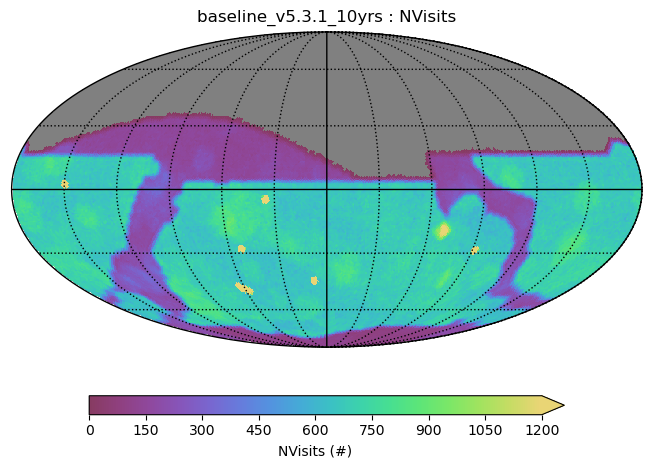

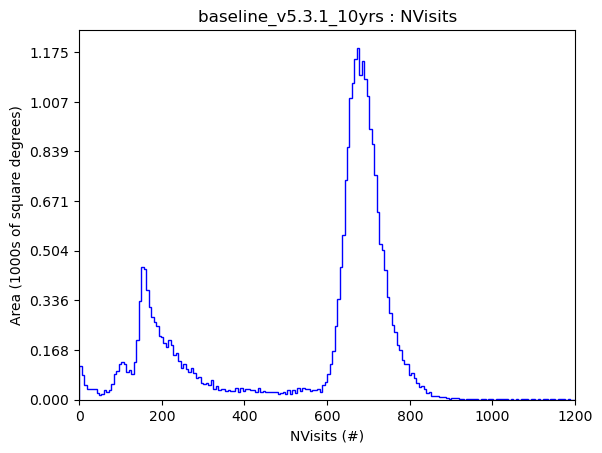

In [12]:
opsdb = 'baseline_v5.3.1_10yrs.db'
run_name = os.path.split(opsdb)[-1].replace('.db', '')

metric = maf.CountMetric('observationStartMJD', metric_name='NVisits')
slicer = maf.HealpixSlicer(nside=64)
constraint = None
plot_dict = {'color_min': 0, 'color_max': 1200, 'extend': 'max', 'x_min': 0, 'x_max': 1200}
plot_funcs = [maf.HealpixSkyMap(), maf.HealpixHistogram()]
bundle = maf.MetricBundle(metric, slicer, constraint, run_name=run_name, 
                          plot_dict=plot_dict, plot_funcs=plot_funcs)

metric = maf.CountMetric('observationStartMJD', metric_name='NVisits')
slicer = maf.HealpixSlicer(nside=64)
constraint = "night < 366"
plot_dict = {'color_min': 0, 'color_max': 120, 'extend': 'max', 'x_min': 0, 'x_max': 120}
plot_funcs = [maf.HealpixSkyMap(),]
bundle2 = maf.MetricBundle(metric, slicer, constraint, run_name=run_name, 
                          plot_dict=plot_dict, plot_funcs=plot_funcs)

try_read = False
if try_read:
    bundle.read(bundle.file_root + '.npz')
    bundle.set_plot_dict(plot_dict = {'color_min': 0, 'color_max': 1200, 'extend': 'max', 'x_min': 0, 'x_max': 1200})
    #bundle.set_plot_funcs(plot_funcs = [maf.HealpixSkyMap(),])
    bundle2.read(bundle2.file_root + '.npz')
    bundle2.set_plot_dict(plot_dict = {'color_min': 0, 'color_max': 120, 'extend': 'max', 'x_min': 0, 'x_max': 120, 'bins': 100})
    #bundle2.set_plot_funcs(plot_funcs = [maf.HealpixSkyMap(),])
else:
    g = maf.MetricBundleGroup({'nvisits': bundle, "year1": bundle2}, opsdb, verbose=True)
    g.run_all()

bundle.plot()

{'SkyMap': <Figure size 640x480 with 2 Axes>}

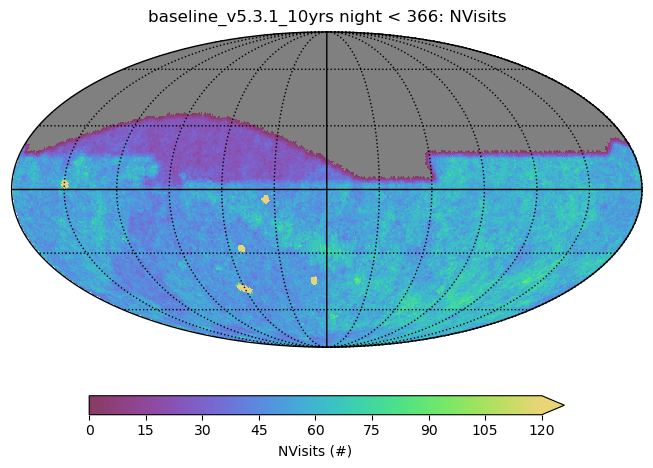

In [13]:
bundle2.plot()

In [14]:
fO = {}
for run_name in ['baseline_v5.3.1_11yrs', 'baseline_v5.3.1_10yrs',  'comp_survey_v5.3.0_10yrs', 'baseline_v5.1.2_10yrs', 'baseline_v5.0.1_10yrs']:
    db = run_name + '.db'
    fO[run_name] = maf.fOBatch(run_name=run_name)
    g = maf.MetricBundleGroup(fO[run_name], db)
    g.run_all()

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes


In [17]:
fO['baseline_v5.3.1_10yrs']['baseline_v5_3_1_10yrs_fO_All_visits_HEAL'].summary_values

{'fOArea': np.float64(290.3956012430637),
 'fOArea/benchmark': np.float64(0.016133088957947985),
 'fONv': array([('MedianNvis', 670.), ('MinNvis', 623.)],
       dtype=[('name', '<U20'), ('value', '<f8')]),
 'fONv/benchmark': array([('MedianNvis', 0.81212121), ('MinNvis', 0.75515152)],
       dtype=[('name', '<U20'), ('value', '<f8')]),
 'fOArea_750': np.float64(1507.3713867992556)}

Text(0, 0.5, 'Area (100s of square degrees) ')

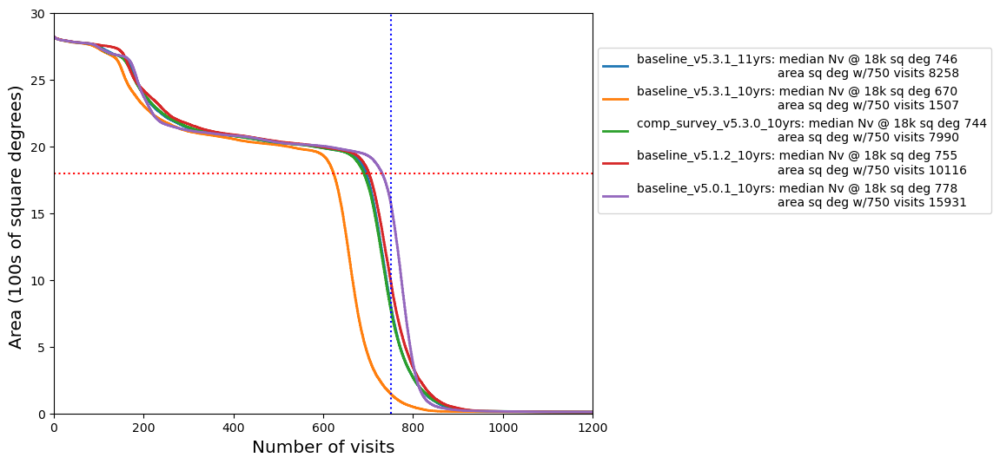

In [18]:
fig, ax = plt.subplots(figsize=(8, 6))
scale = hp.nside2pixarea(64, degrees=True) / 1000.0
for name in ['baseline_v5.3.1_11yrs', 'baseline_v5.3.1_10yrs',  'comp_survey_v5.3.0_10yrs', 'baseline_v5.1.2_10yrs', 'baseline_v5.0.1_10yrs']:
    bundle = fO[name][f"{name.replace('.', '_')}_fO_All_visits_HEAL"]
    cumulative_area = np.arange(1, bundle.metric_values.compressed().size + 1)[::-1] * scale
    ax.plot(
        np.sort(bundle.metric_values.compressed()),
        cumulative_area,
        linestyle="-",
        linewidth=2,
        zorder=0,
        #label=f"{name}:  fO {(bundle.summary_values['fONv'][0]['value'] / 825 * .9 / .83):.2f}",
        label=f"{name}: median Nv @ 18k sq deg {bundle.summary_values['fONv'][0]['value']:.0f}\n"\
              f"                                     area sq deg w/750 visits {bundle.summary_values['fOArea_750']:.0f}" ,
    )
ax.legend(loc=(1.01, 0.5))
ax.axvline(x=750, linestyle=':', color='b')
ax.axhline(y=18000 / 1000.0, linestyle=':', color='r')
ax.set_xlim(0, 1200)
ax.set_ylim(0, 30)
ax.set_xlabel("Number of visits", fontsize='x-large')
ax.set_ylabel("Area (100s of square degrees) ", fontsize='x-large')

In [19]:
rdict = {}
for k in baseline_dict:
    rdict[k] = baseline_dict[k]
for k in new_runs:
    rdict[k] = new_runs[k]
rdict

{'retro_baseline_v2.0_10yrs': 'v1.x',
 'baseline_v2.0_10yrs': 'v2.0',
 'baseline_v2.1_10yrs': 'v2.1',
 'baseline_v2.2_10yrs': 'v2.2',
 'baseline_v3.0_10yrs': 'v3.0',
 'baseline_v3.2_10yrs': 'v3.2',
 'baseline_v3.3_10yrs': 'v3.3',
 'baseline_v3.4_10yrs': 'v3.4',
 'baseline_v3.5_10yrs': 'v3.5',
 'baseline_v3.6_10yrs': 'v3.6',
 'baseline_v4.0_10yrs': 'v4.0',
 'baseline_v4.3.5_10yrs': 'v4.3.5',
 'baseline_v5.0.1_10yrs': 'baseline v5.0.1',
 'baseline_v5.1.2_10yrs': 'baseline v5.1.2',
 'comp_survey_v5.3.0_10yrs': 'comp v5.3.0',
 'baseline_v5.3.1_10yrs': 'baseline v5.3.1',
 'roll_mash_v5.3.0_10yrs': 'roll y2 u7 v5.3.0',
 'roll_u5_v5.3.0_10yrs': 'roll y2 u5 v5.3.0',
 'ddf_sd_v5.3.0_10yrs': 'ddf long seq v5.3.0',
 'faster_templates_v5.3.0_10yrs': '20s fast templates v5.3.0',
 'desi_3040_v5.3.1_10yrs': 'desi_3040 v5.3.1',
 'desi_yearly_v5.3.1_10yrs': 'desi_yearly v5.3.1',
 'baseline_v5.3.0_11yrs': 'baseline 11 yr v5.3.0'}

In [26]:
runs = list(rdict.keys())
runs = runs[-13:]
summaries.loc[runs, [c for c in summaries.columns if "Median Median" in c and "Healpix" in c and 'all bands' in c]].round(3)

metric,Median Median HA All sky all bands HealpixSlicer,Median Median HA WFD all bands HealpixSubsetSlicer,Median Median Inter-Night Gap All sky all bands HealpixSlicer,Median Median Inter-Night Gap WFD all bands HealpixSubsetSlicer,Median Median Season Length All sky all bands HealpixSlicer,Median Median Season Length WFD all bands HealpixSubsetSlicer,Median Median airmass All sky all bands HealpixSlicer,Median Median airmass WFD all bands HealpixSubsetSlicer,Median Median airmass Yr 1 all bands HealpixSlicer,Median Median fiveSigmaDepth All sky all bands HealpixSlicer,...,Median Median saturation_mag WFD all bands HealpixSubsetSlicer,Median Median seeingEff All sky all bands HealpixSlicer,Median Median seeingEff WFD all bands HealpixSubsetSlicer,Median Median seeingEff Yr 1 all bands HealpixSlicer,Median Median seeingGeom Yr 1 all bands HealpixSlicer,Median Median skyBrightness All sky all bands HealpixSlicer,Median Median skyBrightness WFD all bands HealpixSubsetSlicer,Median Median skyBrightness Yr 1 all bands HealpixSlicer,Median Median solarElong All sky all bands HealpixSlicer,Median Median solarElong WFD all bands HealpixSubsetSlicer
run,,,,,,,,,,,,,,,,,,,,,
baseline_v4.0_10yrs,0.666,0.829,3.150,3.005,167.628,175.150,1.173,1.160,1.169,23.353,...,14.120,1.058,1.039,0.977,0.855,19.807,19.752,19.757,131.716,131.188
baseline_v4.3.5_10yrs,0.714,1.056,3.468,3.012,172.714,180.682,1.184,1.174,1.176,23.339,...,14.094,1.068,1.048,0.982,0.859,19.806,19.754,19.713,130.282,130.303
baseline_v5.0.1_10yrs,0.702,1.114,3.011,2.976,177.231,185.679,1.194,1.182,1.178,23.332,...,14.802,1.077,1.057,0.991,0.866,19.759,19.714,19.661,129.639,130.053
baseline_v5.1.2_10yrs,0.514,0.969,3.010,2.975,163.790,171.805,1.214,1.199,1.162,23.338,...,14.820,1.083,1.068,0.987,0.864,19.764,19.703,19.755,133.569,133.534
comp_survey_v5.3.0_10yrs,0.186,0.258,3.013,2.979,170.697,177.751,1.159,1.129,1.129,23.379,...,14.873,1.056,1.038,0.984,0.861,19.796,19.725,20.109,128.666,128.890
baseline_v5.3.1_10yrs,0.149,0.140,3.047,2.998,164.717,175.635,1.159,1.127,1.126,23.390,...,14.890,1.050,1.032,0.985,0.862,19.796,19.723,20.162,127.872,127.587
roll_mash_v5.3.0_10yrs,0.175,0.169,3.041,2.997,163.733,174.665,1.158,1.127,1.126,23.386,...,14.883,1.054,1.035,0.984,0.861,19.805,19.732,20.166,128.217,127.882
roll_u5_v5.3.0_10yrs,0.181,0.179,3.050,3.000,163.745,174.705,1.158,1.128,1.126,23.384,...,14.887,1.054,1.035,0.984,0.861,19.800,19.724,20.166,128.127,127.599
ddf_sd_v5.3.0_10yrs,0.136,0.120,3.057,3.001,164.211,175.712,1.161,1.129,1.128,23.385,...,14.884,1.052,1.035,0.981,0.858,19.798,19.722,20.158,128.162,127.514


metric,Median CoaddM5 WFD u band HealpixSubsetSlicer,Median CoaddM5 WFD g band HealpixSubsetSlicer,Median CoaddM5 WFD r band HealpixSubsetSlicer,Median CoaddM5 WFD i band HealpixSubsetSlicer,Median CoaddM5 WFD z band HealpixSubsetSlicer,Median CoaddM5 WFD y band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD u band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD g band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD r band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD i band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD z band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD y band HealpixSubsetSlicer,Median NVisits WFD u band HealpixSubsetSlicer,Median NVisits WFD g band HealpixSubsetSlicer,Median NVisits WFD r band HealpixSubsetSlicer,Median NVisits WFD i band HealpixSubsetSlicer,Median NVisits WFD z band HealpixSubsetSlicer,Median NVisits WFD y band HealpixSubsetSlicer
run,,,,,,,,,,,,,,,,,,
baseline_v4.0_10yrs,25.60,26.83,26.94,26.43,25.76,24.79,23.38,24.45,24.05,23.53,22.94,22.01,54.0,66.0,173.0,175.0,157.0,154.0
baseline_v4.3.5_10yrs,25.59,26.80,26.90,26.40,25.75,24.77,23.37,24.43,24.02,23.51,22.94,22.00,54.0,65.0,172.0,173.0,156.0,151.0
baseline_v5.0.1_10yrs,25.57,26.84,26.94,26.43,25.78,24.81,23.35,24.43,24.04,23.52,22.95,22.00,55.0,68.0,178.0,179.0,161.0,157.0
baseline_v5.1.2_10yrs,25.55,26.89,26.92,26.40,25.74,24.77,23.35,24.47,24.04,23.49,22.94,22.00,52.0,71.0,173.0,177.0,151.0,148.0
comp_survey_v5.3.0_10yrs,25.64,27.00,26.95,26.44,25.76,24.80,23.44,24.59,24.05,23.53,22.98,22.05,52.0,70.0,171.0,174.0,150.0,145.0
baseline_v5.3.1_10yrs,25.58,26.96,26.89,26.40,25.73,24.76,23.45,24.61,24.05,23.56,22.98,22.05,46.0,62.0,154.0,156.0,135.0,132.0
roll_mash_v5.3.0_10yrs,25.58,26.95,26.89,26.40,25.72,24.75,23.45,24.60,24.05,23.56,22.98,22.05,46.0,61.0,154.0,155.0,136.0,132.0
roll_u5_v5.3.0_10yrs,25.58,26.95,26.89,26.40,25.72,24.75,23.44,24.61,24.05,23.56,22.98,22.05,46.0,62.0,154.0,156.0,136.0,131.0
ddf_sd_v5.3.0_10yrs,25.57,26.97,26.88,26.39,25.71,24.74,23.44,24.62,24.04,23.55,22.98,22.05,46.0,61.0,153.0,154.0,135.0,130.0


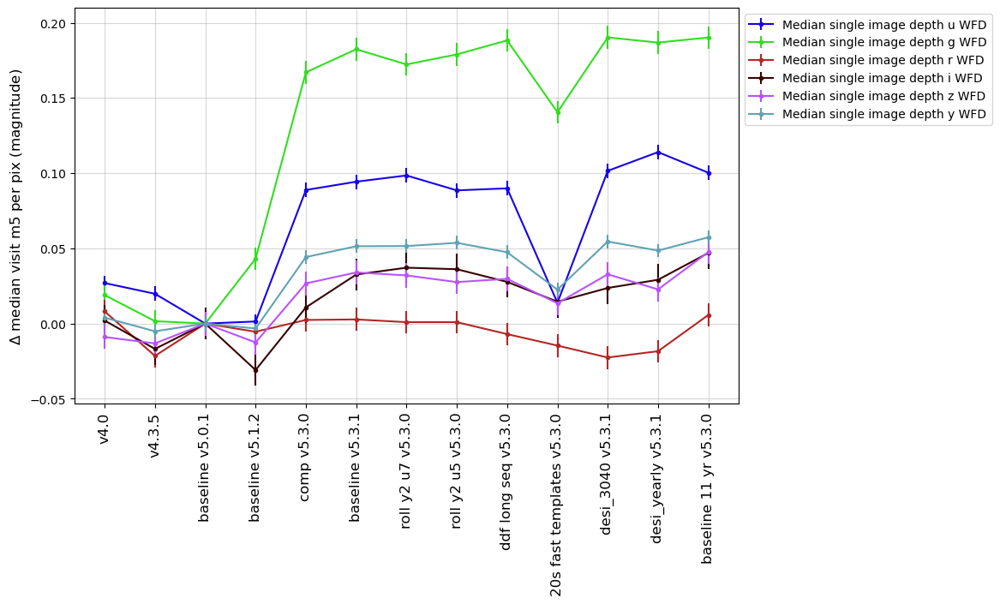

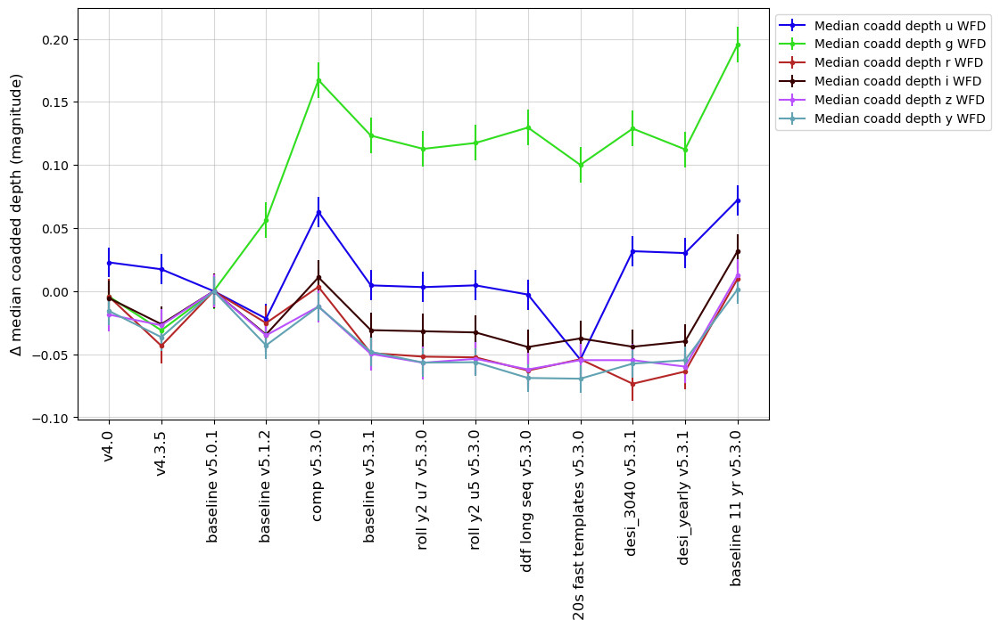

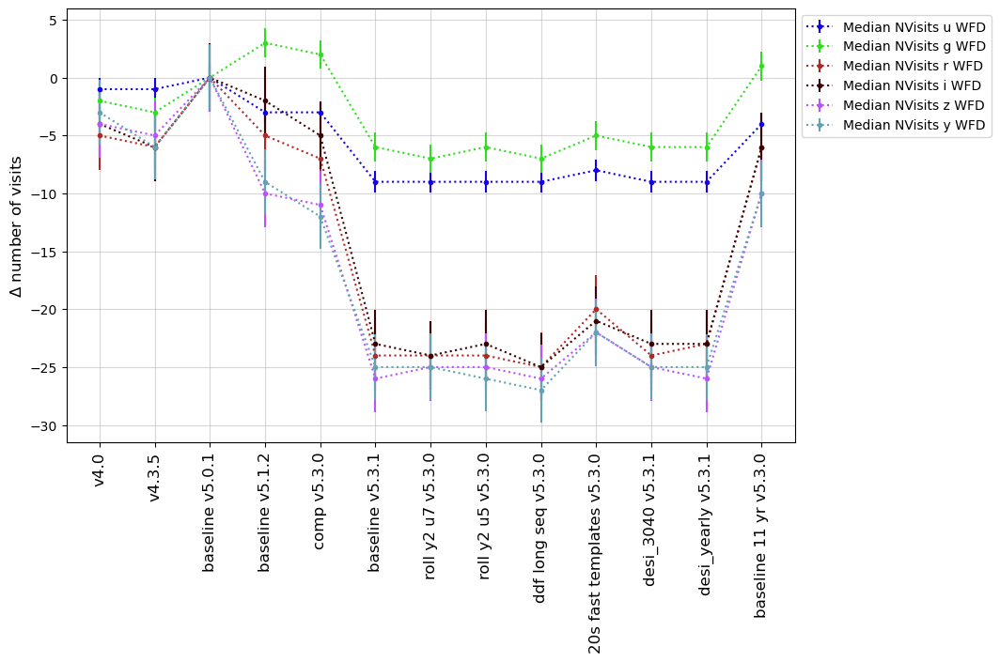

In [27]:
# Check in on the depths and number of visits in each bandpass
k = 'WFD Depths'

msub = metrics.loc[k].query('metric.str.contains("Mean Median")')
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']] - summaries.loc[baseline, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub,
                                 cmap=filter_color_map,
                                 sep_plots=False)
ax.set_ylabel(r"$\Delta$ median visit m5 per pix (magnitude)", fontsize='large')
y1, y2 = plt.ylim()
fig.savefig(os.path.join(outdir, 'visit_m5_per_pix' + '.png'), format='png')


msub = metrics.loc[k].query('metric.str.contains("Coadd")')
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']] - summaries.loc[baseline, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub,
                                 cmap=filter_color_map,
                                 sep_plots=False)
ax.set_ylabel(r"$\Delta$ median coadded depth (magnitude)", fontsize='large')
y1, y2 = plt.ylim()
fig.savefig(os.path.join(outdir, 'coadd_m5_per_pix' + '.png'), format='png')

msub = metrics.loc[k].query('metric.str.contains("NVisits")')
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']] - summaries.loc[baseline, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub,
                                 cmap=filter_color_map,
                                 sep_plots=False)
ax.set_ylabel(r"$\Delta$ number of visits", fontsize='large')
y1, y2 = plt.ylim()
fig.savefig(os.path.join(outdir, 'nvisit_per_pix'+ '.png'), format='png')

summaries.loc[runs, metrics.loc[k]['metric']].round(2)

In [28]:
cols = [m for m in summaries if "Teff All sky all bands" in m and "UniSlicer" in m and "Normalized" not in m]
cols

d = summaries.loc[runs, cols]/summaries.loc[baseline, cols]
d = d.rename(columns={'Identity Total Teff All sky all bands UniSlicer': "Teff Total"})
d.round(2)

metric,Teff Total
run,
baseline_v4.0_10yrs,0.98
baseline_v4.3.5_10yrs,0.94
baseline_v5.0.1_10yrs,1.00
baseline_v5.1.2_10yrs,0.96
comp_survey_v5.3.0_10yrs,0.63
baseline_v5.3.1_10yrs,0.59
roll_mash_v5.3.0_10yrs,0.58
roll_u5_v5.3.0_10yrs,0.58
ddf_sd_v5.3.0_10yrs,0.58


And finally, let's have a look at those depths compared to SRD design and minimum goals, to evaluate how these changes are redistributing depth (or, in a sense, time) among bandpasses.

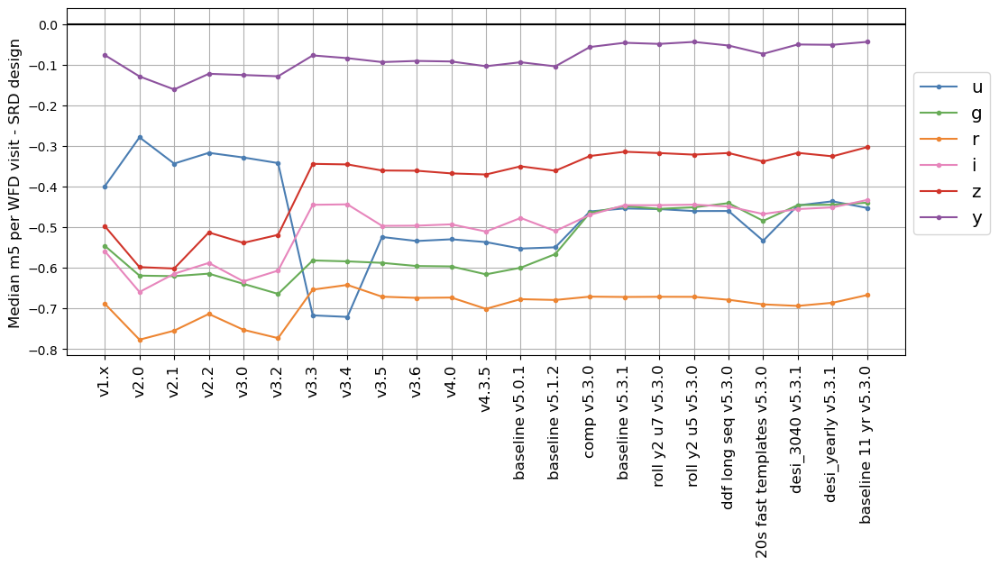

In [29]:
cols = [f'Identity Median fiveSigmaDepth WFD {f} band UniSlicer' for f in 'ugrizy']
newcols = [f'Median m5 WFD {f} band per image' for f in 'ugrizy']
visitdepth_cols = cols

mset = maf.create_metric_subset('VisitDepths', metrics=cols, short_name=newcols, invert=False, mag=True) 

fig, ax = plt.subplots(figsize=(12, 5)) 

for f, col in zip(['u', 'g', 'r', 'i', 'z', 'y'], cols):
    ax.plot(list(rdict.values()), summaries.loc[rdict.keys(), col] - m5_SRD_design[f], 
                color=filter_rgb_map[f], marker='.', linestyle='-', label=f)
    #ax.axhline(m5_SRD_design[f], color=filter_colors[f], linestyle=':', linewidth=3)

ax.axhline(0, color='k', linestyle='-')
ax.set_ylabel(f"Median m5 per WFD visit - SRD design", fontsize='large')
plt.legend(loc=(1.01, 0.35), fontsize='x-large')
ax.tick_params(axis='x', labelrotation = 90, labelsize='large')
ax.grid()
fig.savefig(os.path.join(outdir, 'm5_per_visit'+ '.png'), format='png')

In [30]:
## WFD coadd vs. exgal coadd depths 

k = 'WFD Depths'

msub = metrics.loc[k].query('metric.str.contains("Coadd")')
q1 = summaries.loc[runs, msub['metric']]
names = {}
for m in msub['metric']:
    names[m] = m.split(" band")[0][-1:]
q1.rename(columns=names, inplace=True)

mm = [f"Median Exgal_CoaddM5 WFD {f} band HealpixSubsetSlicer" for f in 'ugrizy']
q2 = summaries.loc[runs, mm]
names = {}
for m in metrics:
    names[m] = m.split(" band")[0][-1:]
q2.rename(columns=names, inplace=True)


summaries.loc[runs, mm].round(2)

metric,Median Exgal_CoaddM5 WFD u band HealpixSubsetSlicer,Median Exgal_CoaddM5 WFD g band HealpixSubsetSlicer,Median Exgal_CoaddM5 WFD r band HealpixSubsetSlicer,Median Exgal_CoaddM5 WFD i band HealpixSubsetSlicer,Median Exgal_CoaddM5 WFD z band HealpixSubsetSlicer,Median Exgal_CoaddM5 WFD y band HealpixSubsetSlicer
run,,,,,,
baseline_v4.0_10yrs,25.32,26.57,26.76,26.29,25.64,24.71
baseline_v4.3.5_10yrs,25.32,26.55,26.72,26.27,25.64,24.69
baseline_v5.0.1_10yrs,25.31,26.59,26.77,26.30,25.66,24.73
baseline_v5.1.2_10yrs,25.29,26.65,26.75,26.27,25.63,24.69
comp_survey_v5.3.0_10yrs,25.36,26.74,26.76,26.31,25.64,24.71
baseline_v5.3.1_10yrs,25.30,26.69,26.70,26.26,25.61,24.68
roll_mash_v5.3.0_10yrs,25.30,26.68,26.70,26.26,25.60,24.67
roll_u5_v5.3.0_10yrs,25.30,26.69,26.70,26.26,25.60,24.68
ddf_sd_v5.3.0_10yrs,25.30,26.70,26.68,26.25,25.60,24.66


## Evaluate metrics

Let's evaluate some metric results across these baseline surveys, starting with a very high level overview. 

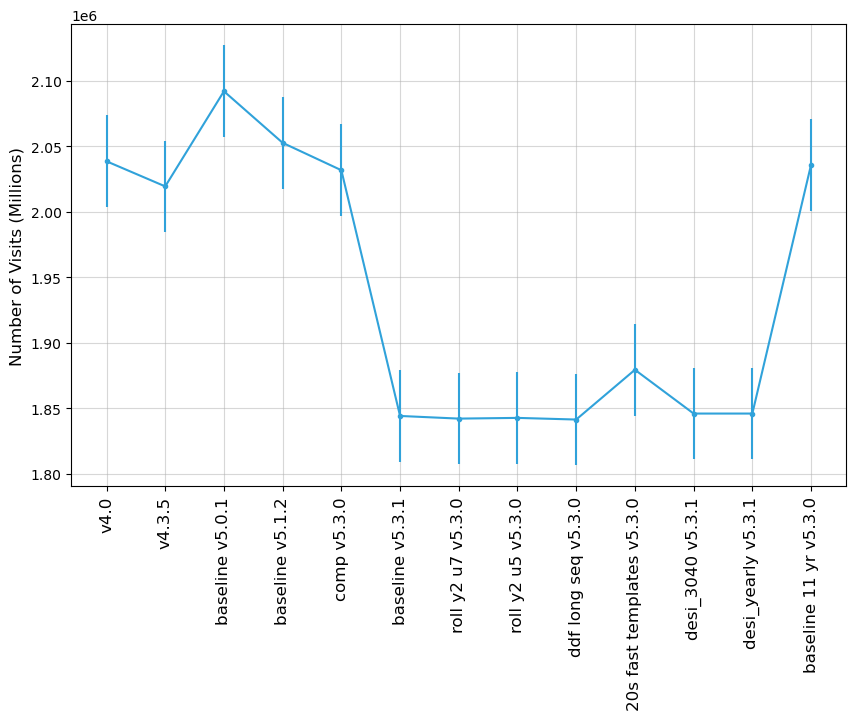

In [31]:
# How did the overall number of visits change for each simulation baseline?  Note some simulations include more shorter visits, and this will be reflected in these numbers.

cols = [m for m in summaries if "Nvisits" in m and "UniSlicer" in m and 'All' in m]
cols

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, cols],
                                 dev[cols],
                                 run_label_map=rdict)
ax.set_ylabel(f"Number of Visits (Millions)", fontsize='large')
leg = ax.get_legend()
leg.remove()
fig.savefig(os.path.join(outdir, 'total_nvisits'+ '.png'), format='png')

#summaries.loc[runs, cols] / summaries.loc['comp_survey_v5.3.0_10yrs', cols]

### SCOC subsets
<a id='SCOC'></a>
A high level overview in a mesh grid, to compare many metrics quickly but without details. 

In [50]:
runs = list(rdict.keys())
runs = runs[-13:]
# runs = [
#  'baseline_v3.0_10yrs',
#  'baseline_v3.6_10yrs',
#  'baseline_v4.0_10yrs',
#  'baseline_v5.0.1_10yrs',
#  'baseline_v5.1.2_10yrs',
#  'comp_survey_v5.3.0_10yrs',
#  'baseline_v5.3.0_10yrs',
#  'faster_templates_v5.3.0_10yrs',]

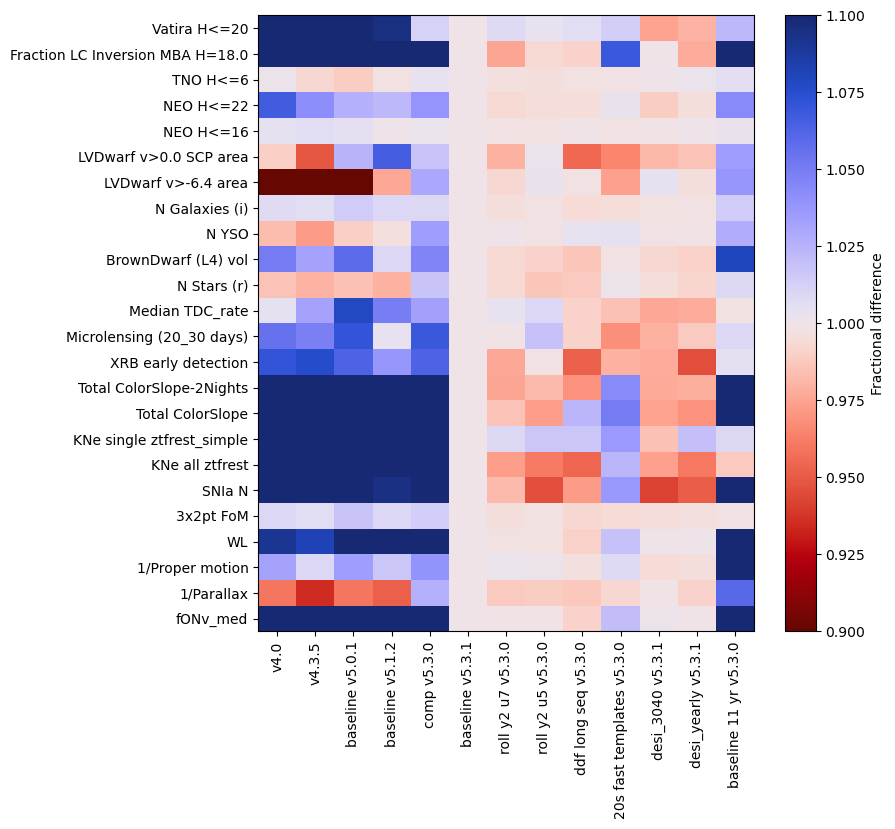

In [51]:
# What about the SCOC high-level overview? 

msub = metrics.loc['SCOC']
baseline = 'baseline_v5.3.1_10yrs'


fig, ax = maf.plot_run_metric_mesh(summaries.loc[runs, msub['metric']], 
                     baseline_run=baseline,
                     metric_subset=msub,
                        metric_label_map=msub['short_name'],
                        run_label_map=rdict,
                        color_range=0.2,
                      )
fig.set_figwidth(8)
fig.set_figheight(8)
fig.savefig(os.path.join(outdir, 'scoc_grid'+ '.png'), format='png')

['baseline_v4.0_10yrs', 'baseline_v5.1.2_10yrs', 'baseline_v5.3.1_10yrs', 'baseline_v5.3.0_11yrs']


metric,SNIa N,KNe all ztfrest,KNe single ztfrest_simple,Total ColorSlope,Total ColorSlope-2Nights,XRB early detection,Microlensing (20_30 days),Median TDC_rate,NEO H<=16,NEO H<=22,TNO H<=6,Fraction LC Inversion MBA H=18.0,Vatira H<=20
run,,,,,,,,,,,,,
baseline_v4.0_10yrs,1.176502,1.231602,1.216917,1.240839,1.428856,1.071199,1.055764,1.004014,1.003992,1.067070,1.000828,1.557778,1.103472
baseline_v5.1.2_10yrs,1.095133,1.245516,1.200546,1.266107,1.391491,1.038009,1.003756,1.049318,1.000420,1.023045,0.997477,1.573333,1.095709
baseline_v5.3.1_10yrs,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
baseline_v5.3.0_11yrs,1.160166,0.988250,1.008868,1.115950,1.126236,1.005353,1.010113,0.997579,1.002522,1.043485,1.006216,1.515556,1.022710


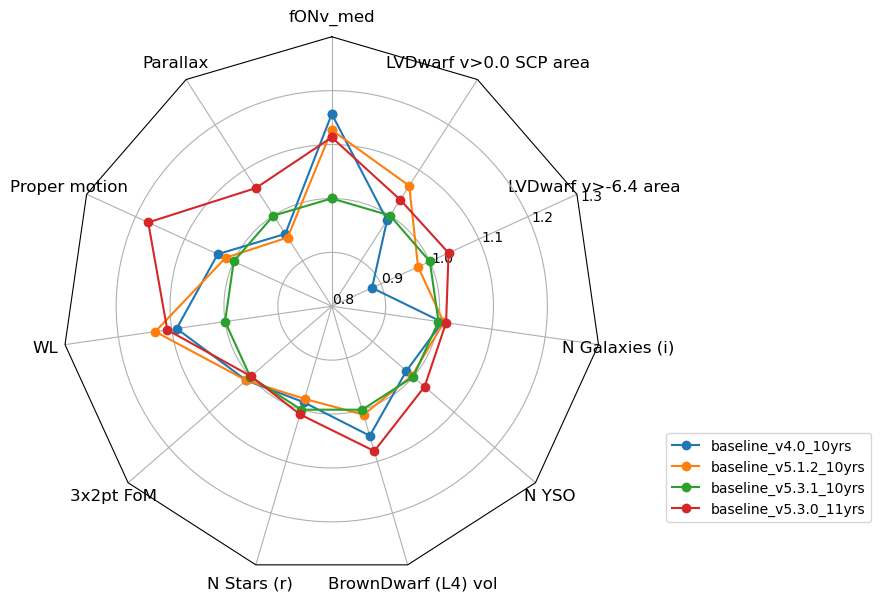

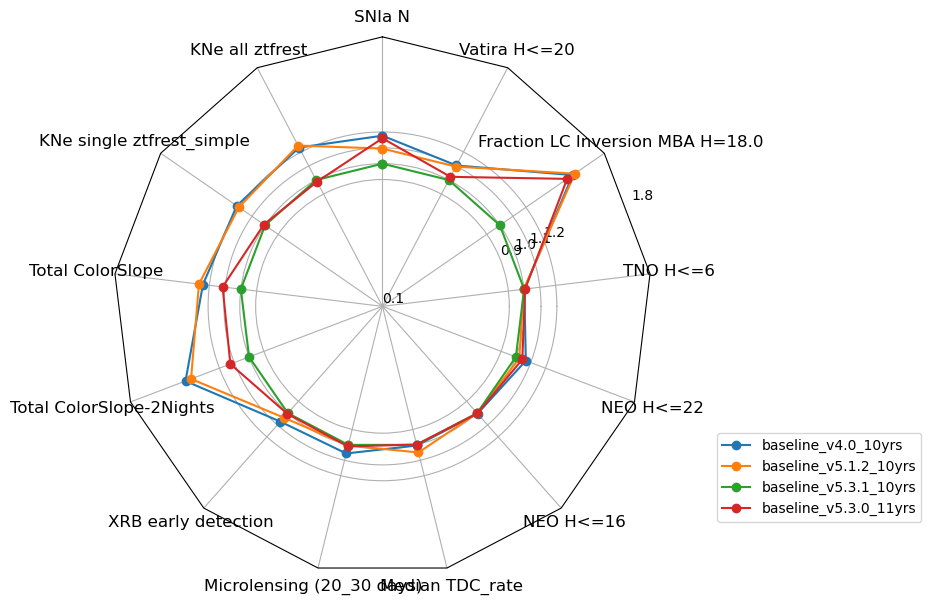

In [52]:
# And some classic 'radar' plots, but only use a subset of the baseline runs
rr = ['baseline_v4.0_10yrs',  'baseline_v5.1.2_10yrs', 'baseline_v5.3.1_10yrs', 'baseline_v5.3.0_11yrs']
rbaseline = 'baseline_v5.3.1_10yrs'
print(rr)

mset = msub

statics = np.array([0, 1, 2, 3, 4, 13, 14, 15, 16, 17, 18])
variable = [i for i in np.arange(0, len(mset)) if i not in statics]

mset_stat = mset.iloc[statics]
mset_var = mset.iloc[variable]

normed = maf.normalize_metric_summaries(rbaseline,
                                        summaries.loc[rr, mset_stat['metric']],
                                        mset)
normed.columns = normed.columns.map(mset['short_name'])
normed

fig, ax = maf.radar(normed, rgrids=[0.80, 0.9, 1.0, 1.1, 1.2, 1.3], figsize=(8, 8), bbox_to_anchor=[1.5, 0.1])
ax.tick_params(axis='x', labelsize='large')
ax.tick_params(axis='y', labelsize='medium')
fig.set_figwidth(8)
fig.set_figheight(7)


normed = maf.normalize_metric_summaries(rbaseline,
                                        summaries.loc[rr, mset_var['metric']],
                                        mset)
normed.columns = normed.columns.map(mset['short_name'])
normed

fig, ax = maf.radar(normed, rgrids=[0.10, 0.9, 1.0, 1.1, 1.2, 1.8], figsize=(8, 8), bbox_to_anchor=[1.5, 0.1])
ax.tick_params(axis='x', labelsize='large')
ax.tick_params(axis='y', labelsize='medium')
fig.set_figwidth(8)
fig.set_figheight(7)
normed.loc[rr]

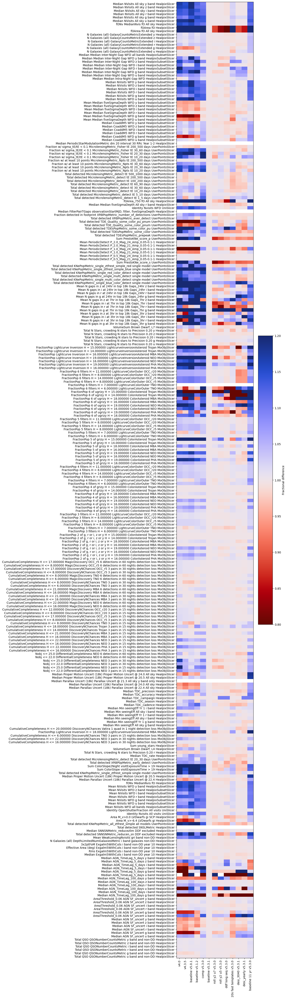

In [53]:
# Plot all the metrics, resulting in a very big and messy plot. Look at overall trends, or for things to investigate further.
non_dd = [m for m in msets if ('DD' not in m)]
msub = metrics.loc[non_dd].reset_index(drop=True).drop('style', axis=1).drop('short_name', axis=1)
msub = msub.drop_duplicates().set_index('metric', drop=False)

fig, ax = maf.plot_run_metric_mesh(summaries.loc[runs, msub['metric']], 
                     baseline_run=baseline,
                     metric_subset=msub,
                        #metric_label_map=msub['short_name'],
                        run_label_map=rdict,
                                  color_range=0.4)
#fig.set_figwidth(24)
fig.set_figheight(60)
fig.savefig(os.path.join(outdir, 'all_grid'+ '.png'), format='png')

Now we look at the metrics results for subsets of metrics, looking in more depth (which allows us to include error bars which come from the standard deviation of the metric results in the weather runs.

### SRD
<a id="SRD"></a>
Metrics coming from the Science Requirements Document, the [SRD](ls.st/srd). 

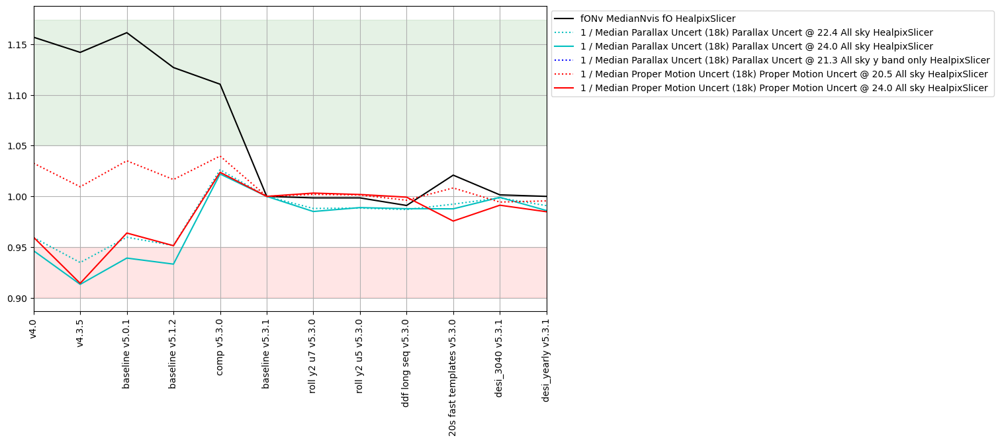

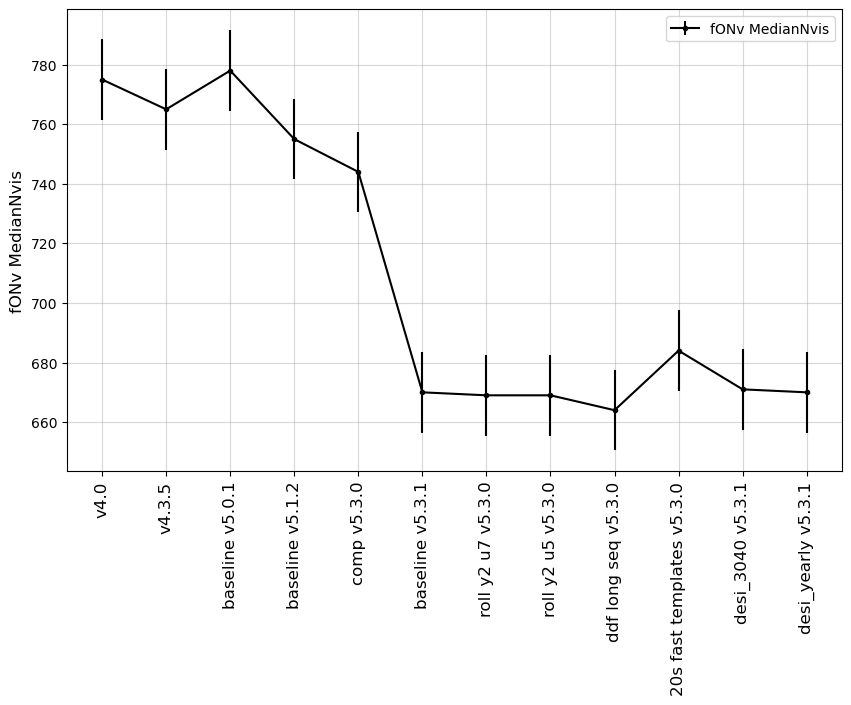

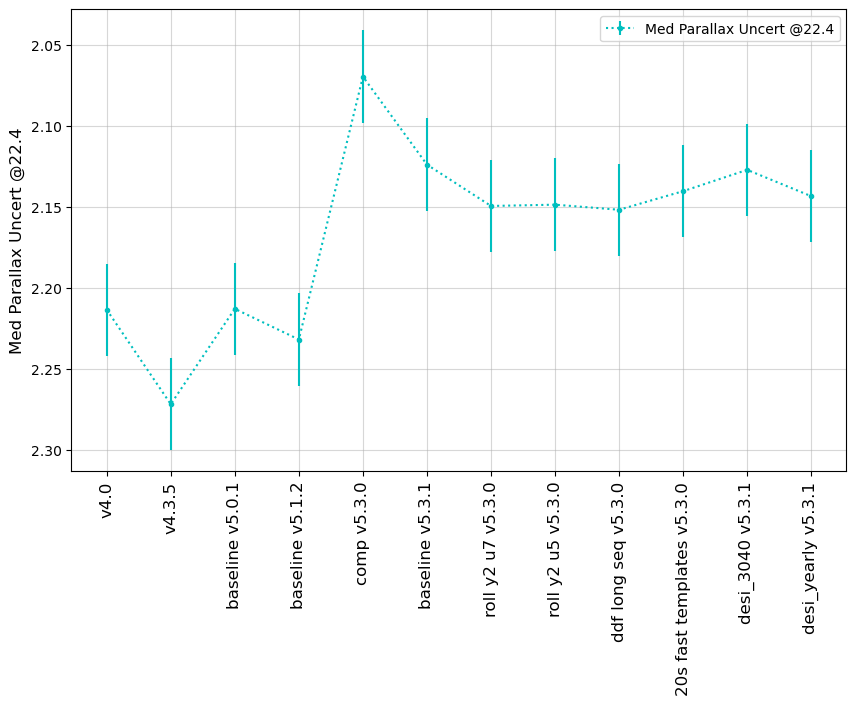

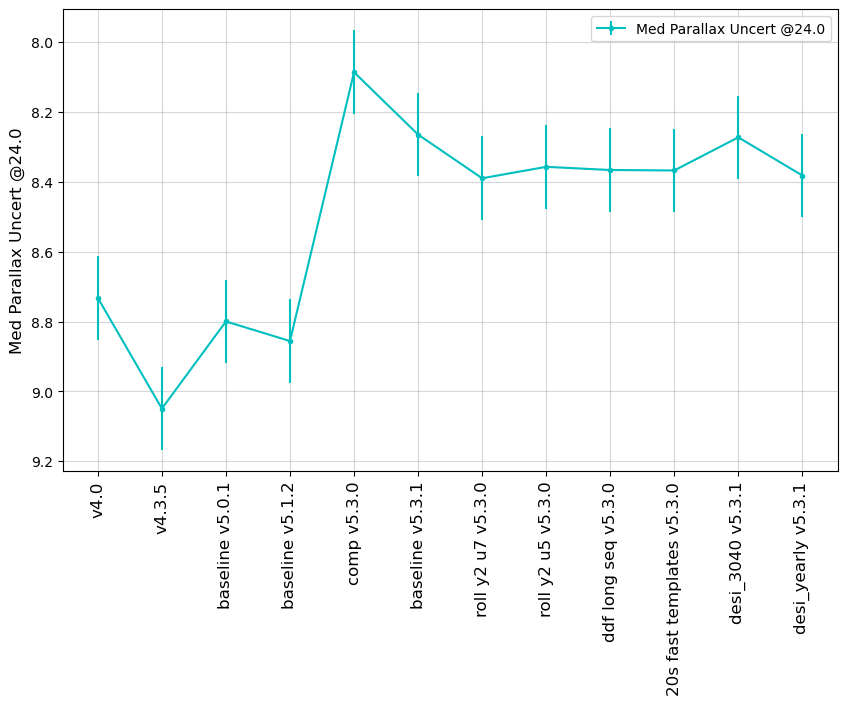

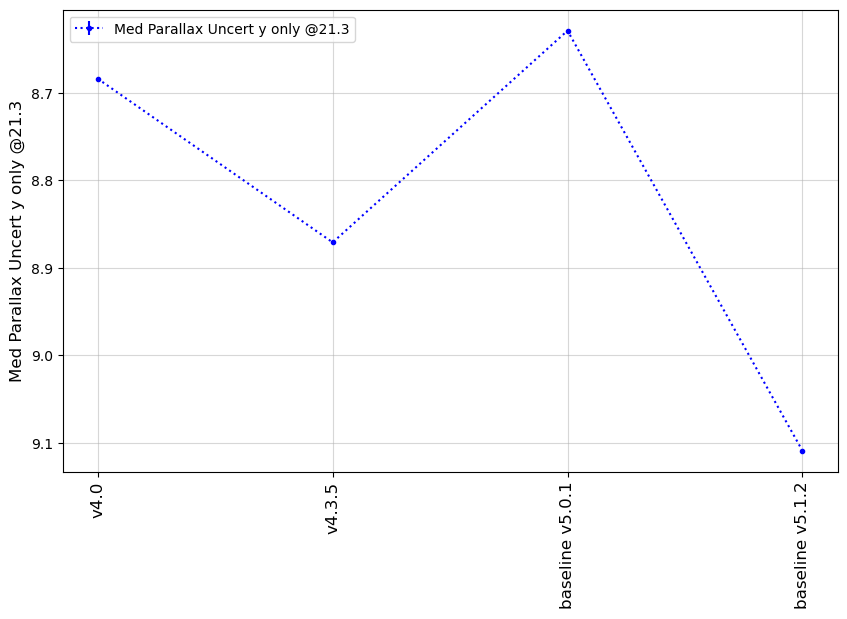

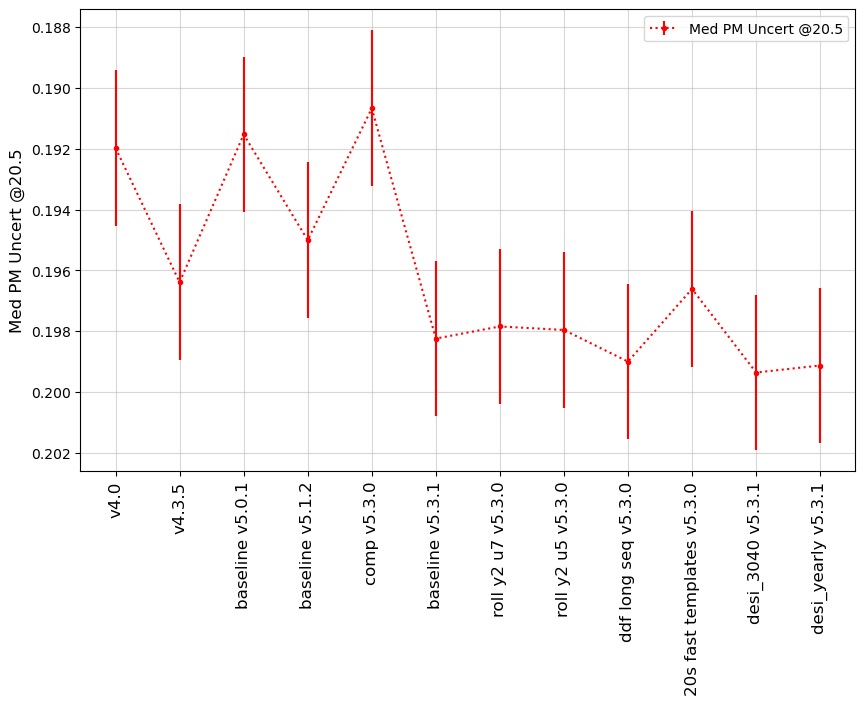

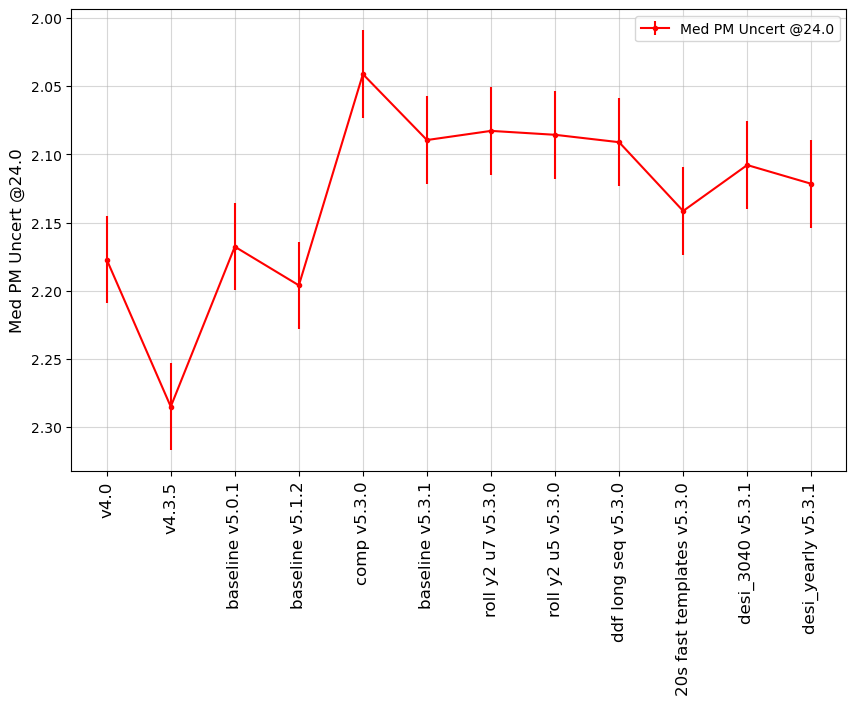

In [70]:
runs = list(rdict.keys())
runs = runs[-13:-1]


msub = metrics.loc['SRD']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub,)

### DESC WFD
<a id="DESC WFD"></a>
Metrics related to DESC WFD goals. These include both static science and transient science.

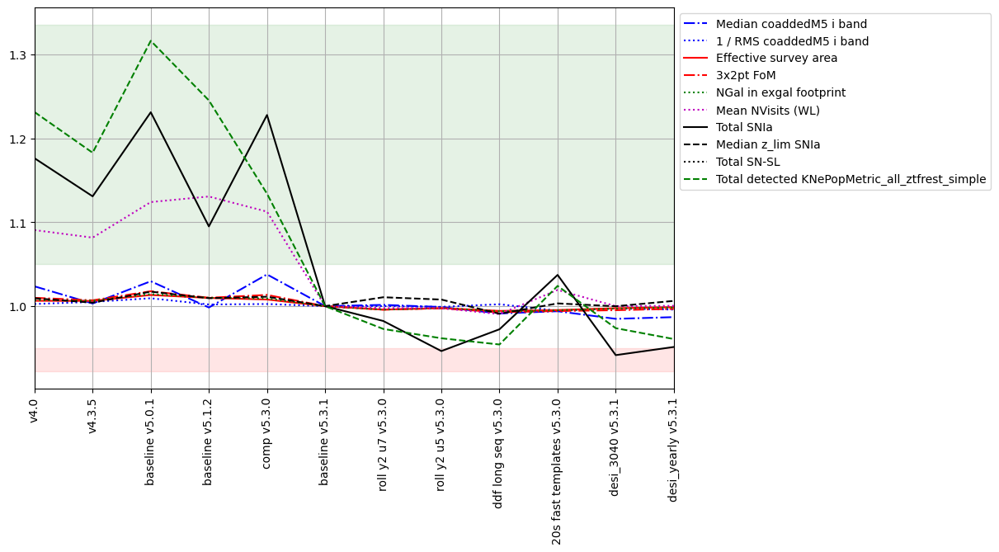

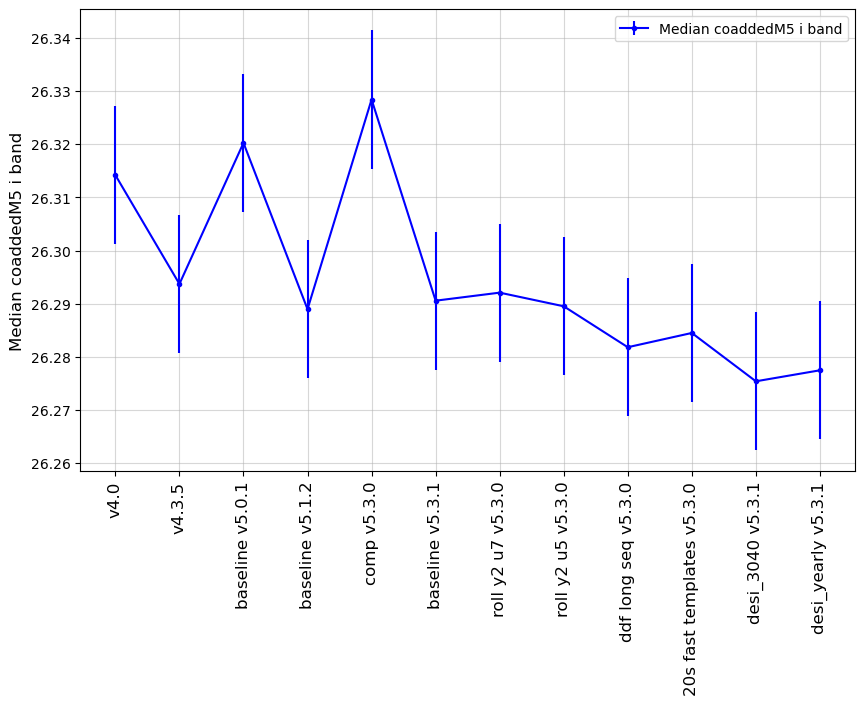

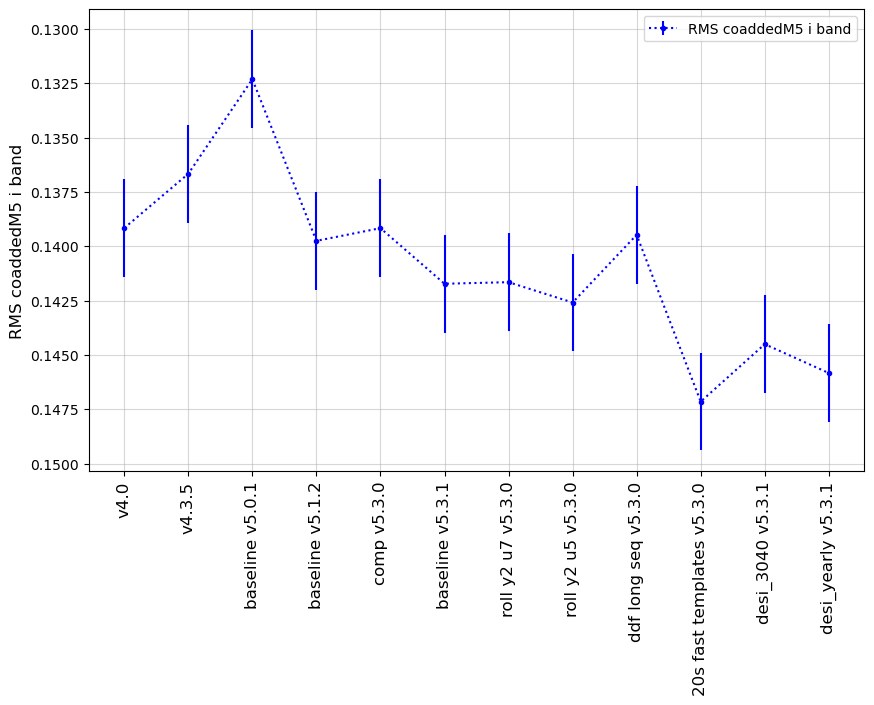

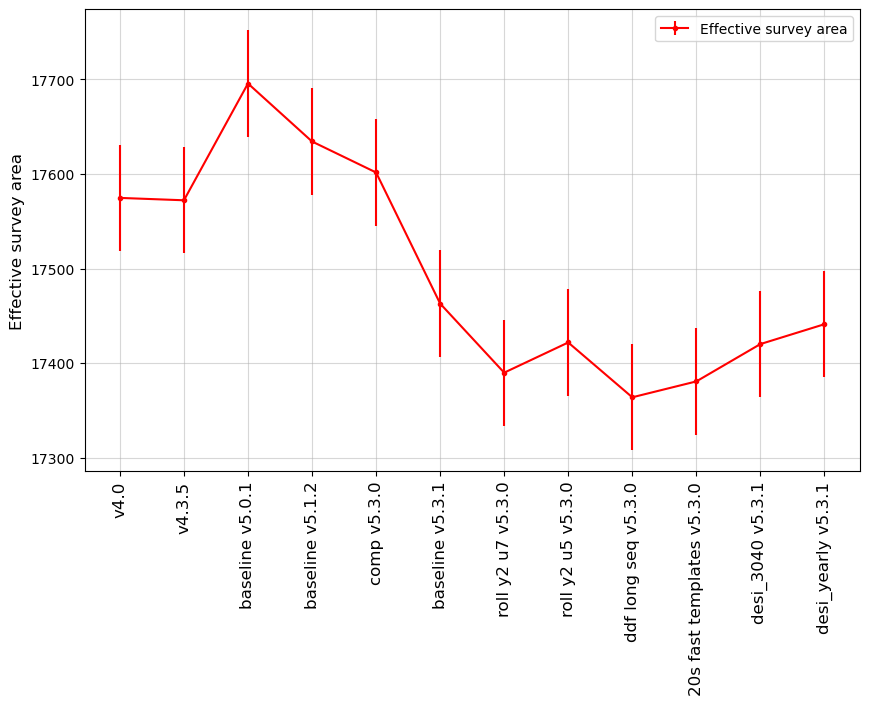

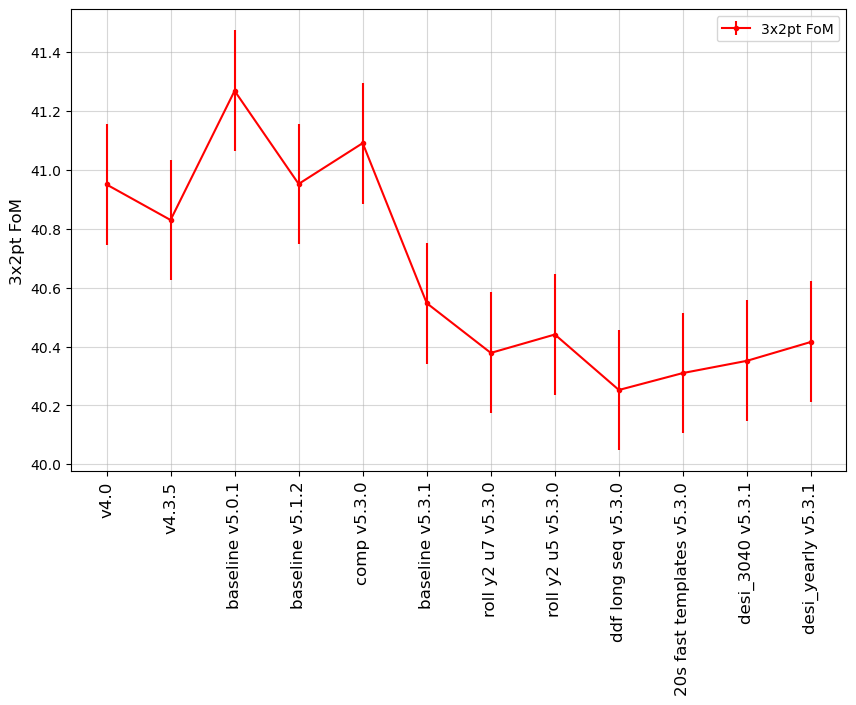

...

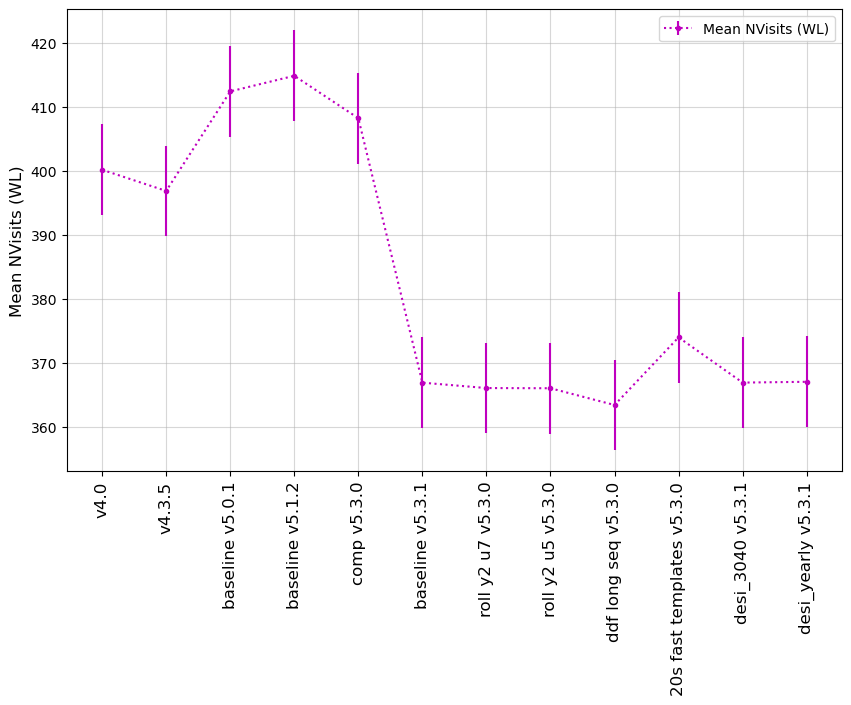

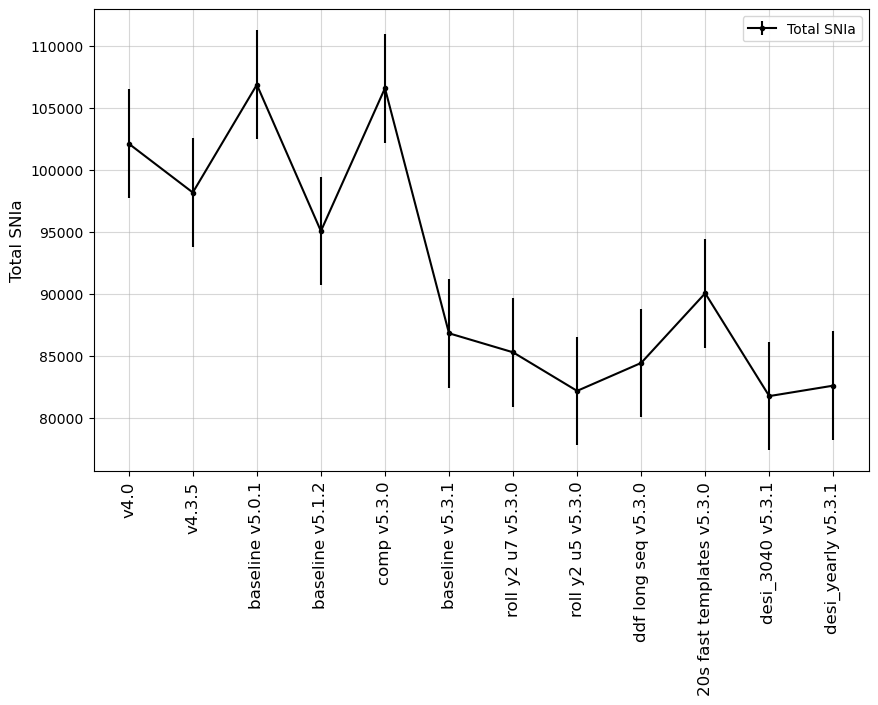

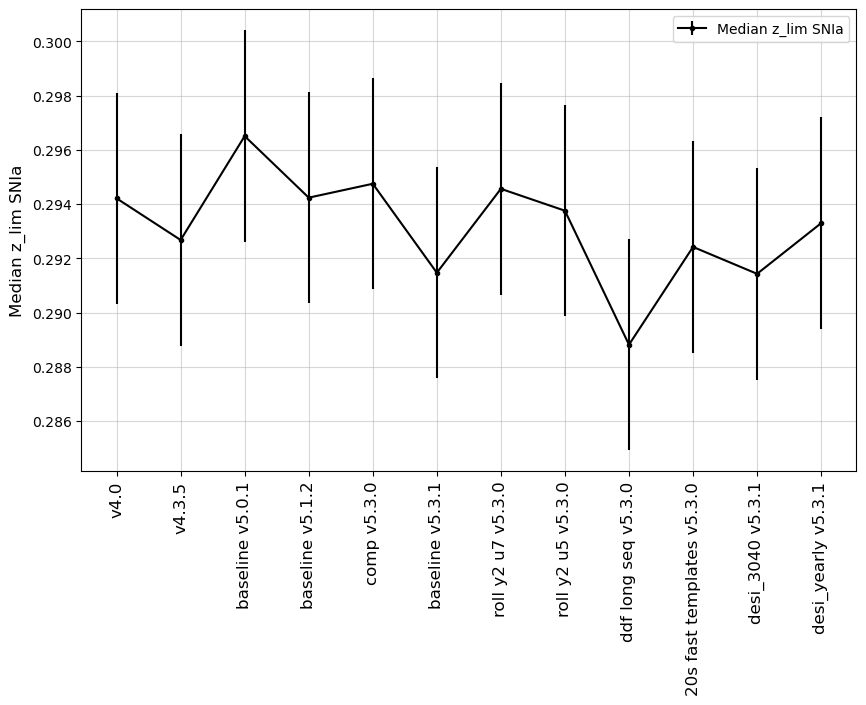

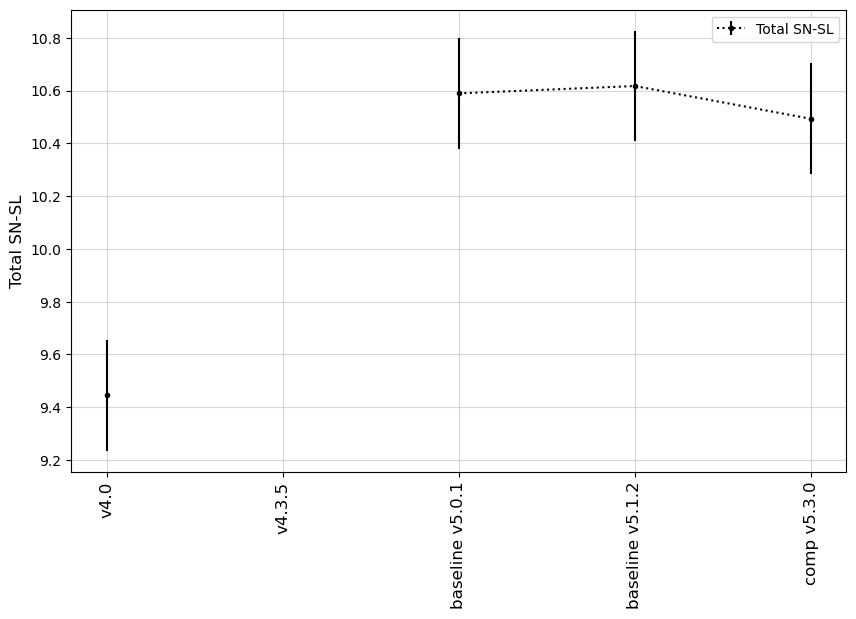

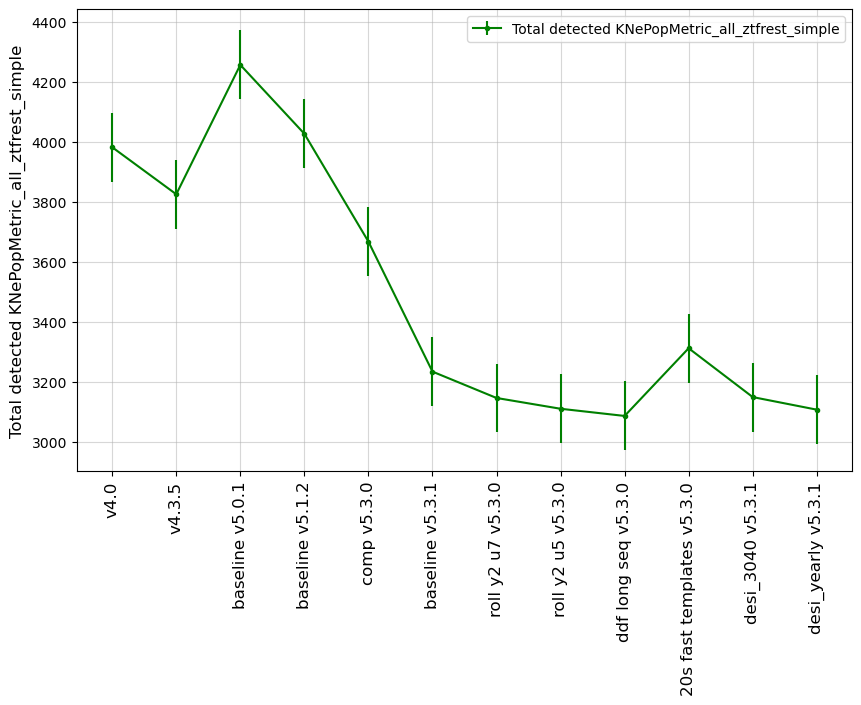

In [71]:
msub = metrics.loc['DESC WFD']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub)

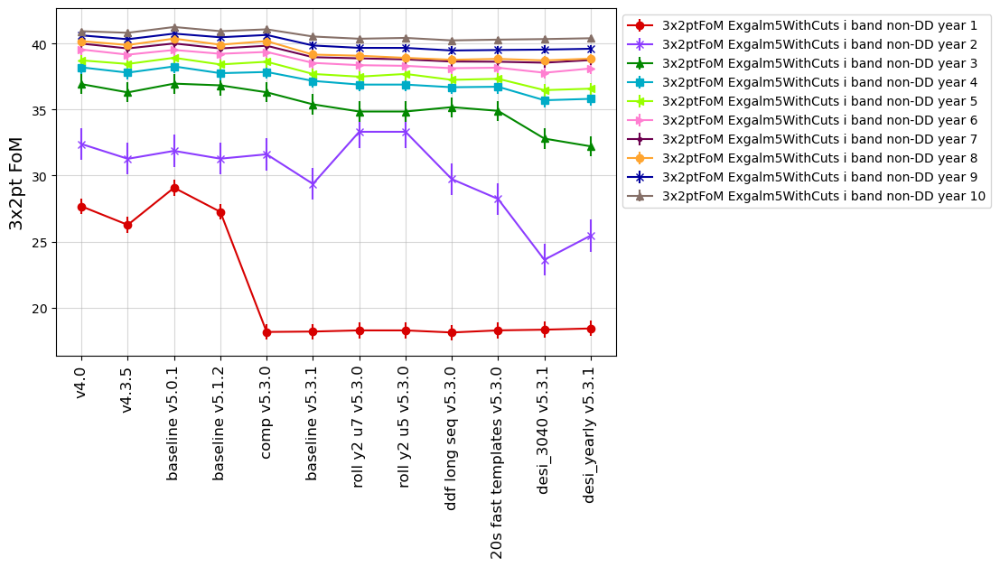

In [72]:
# Compare 3x2pt FOM metrics at individual years, between different simulations.
m1 = []
for yr in range(1, 11):
    m1 += [f'3x2ptFoM Exgalm5WithCuts i band non-DD year {yr} HealpixSlicer']

mset = maf.create_metric_subset('3x2pt', 
                                metrics=m1, 
                                short_name=[m.replace(' HealpixSlicer', '') for m in m1],
                               )
msub = mset.loc['3x2pt']

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 cmap=colorcet.glasbey_bw,
                                 metric_subset=msub,
                                 markers=['o', 'x', '^', 's', '<', '>', '.', ],
                                 sep_plots=False)                                 
ax.set_ylabel("3x2pt FoM", fontsize='x-large')
fig.set_figwidth(8)
fig.set_figheight(5)

### Transient and Variable Stars
<a id="TVS"></a>
Metrics related to Transient and Variable Stars collaboration goals. 

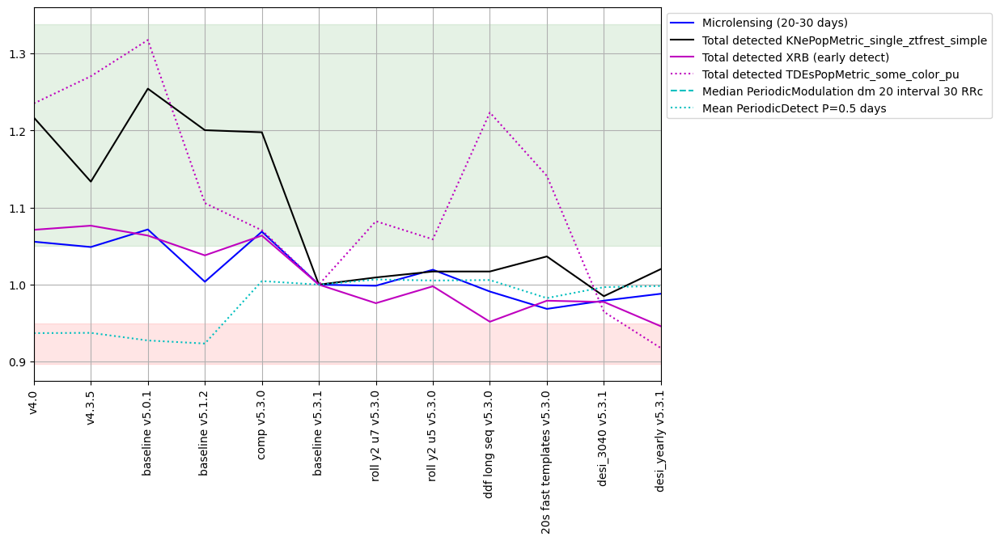

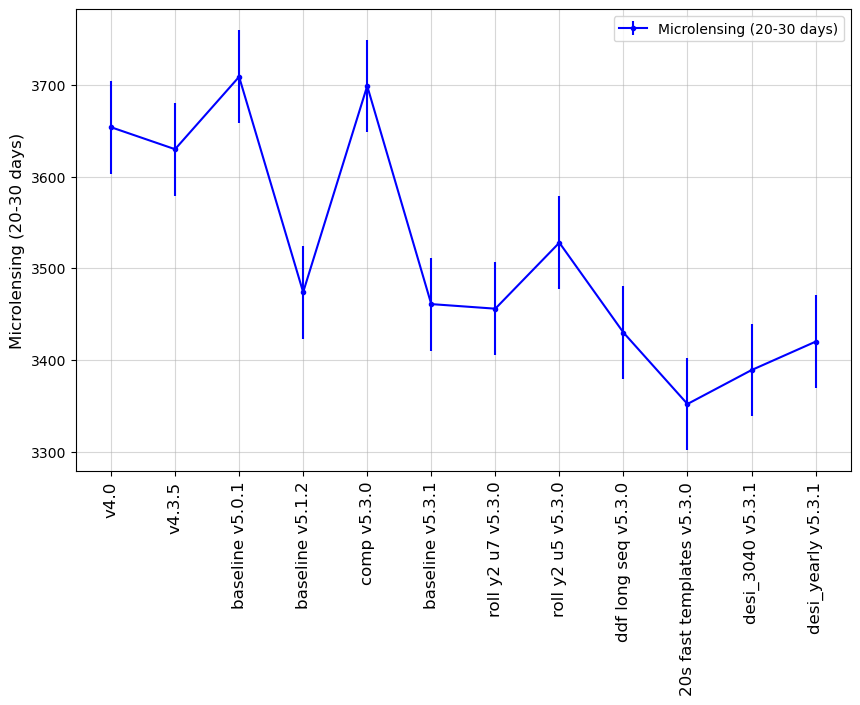

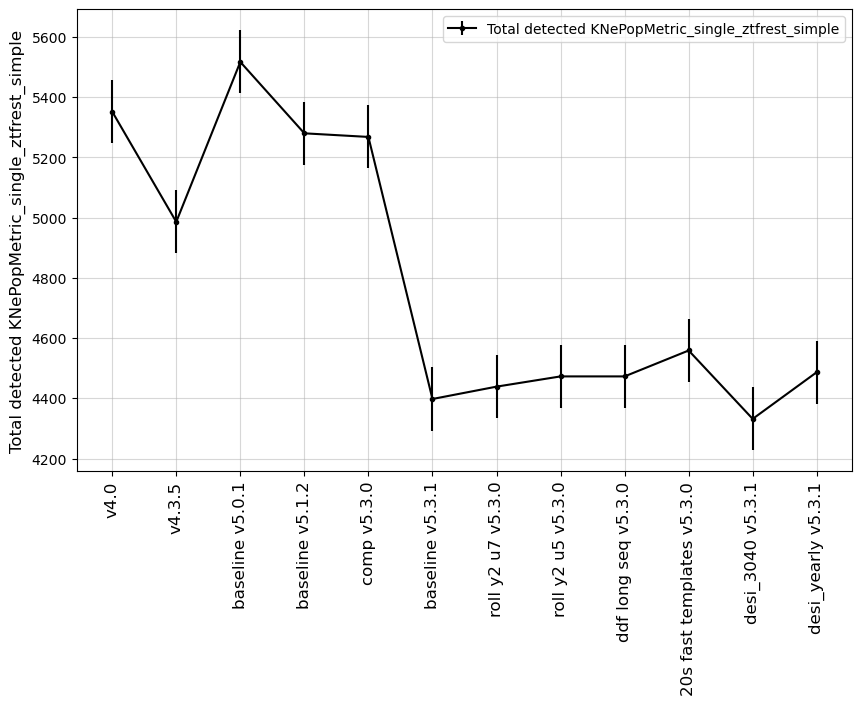

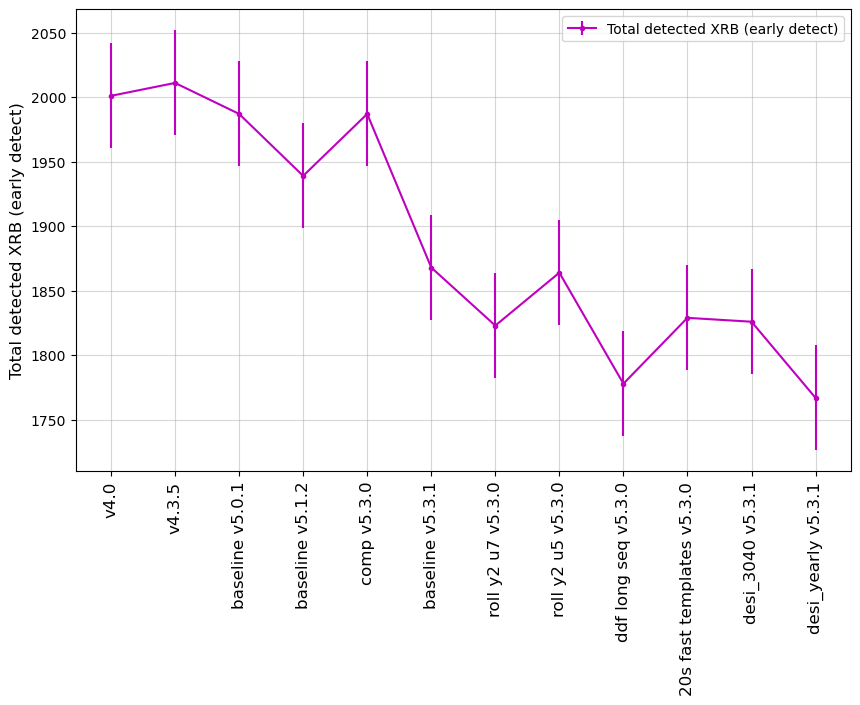

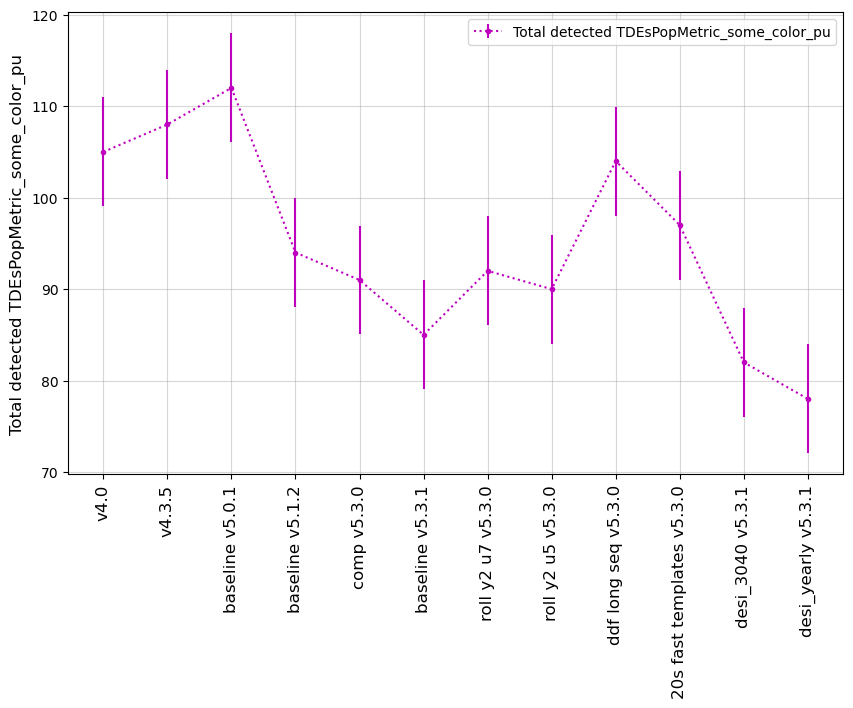

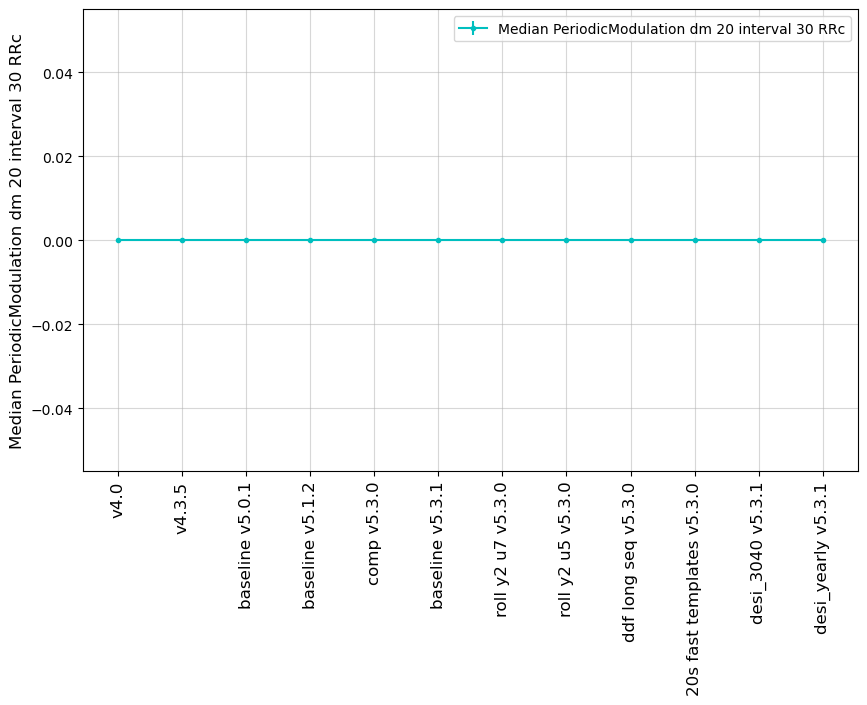

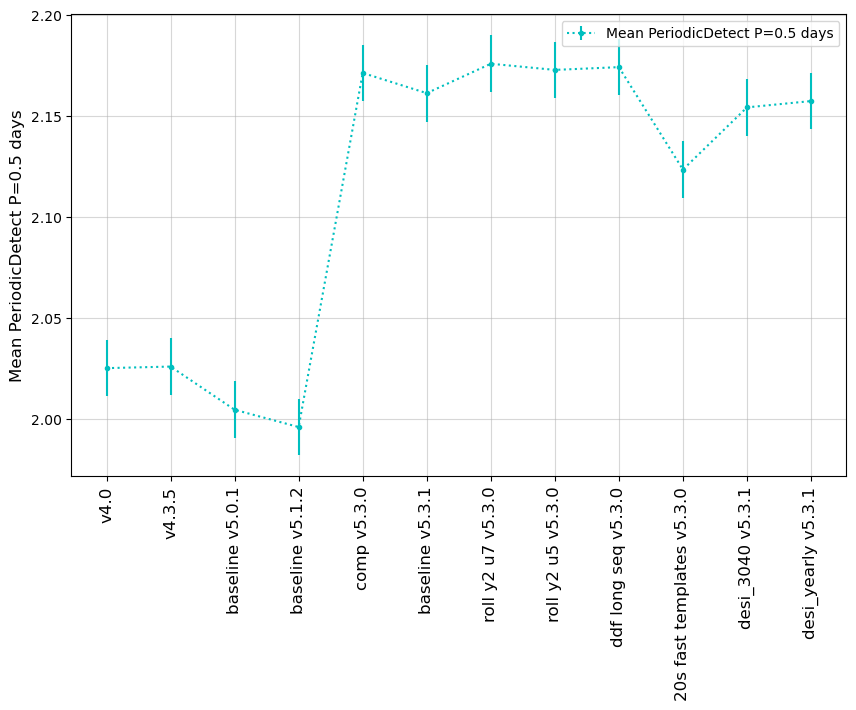

In [73]:
msub = metrics.loc['TVS short']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub)

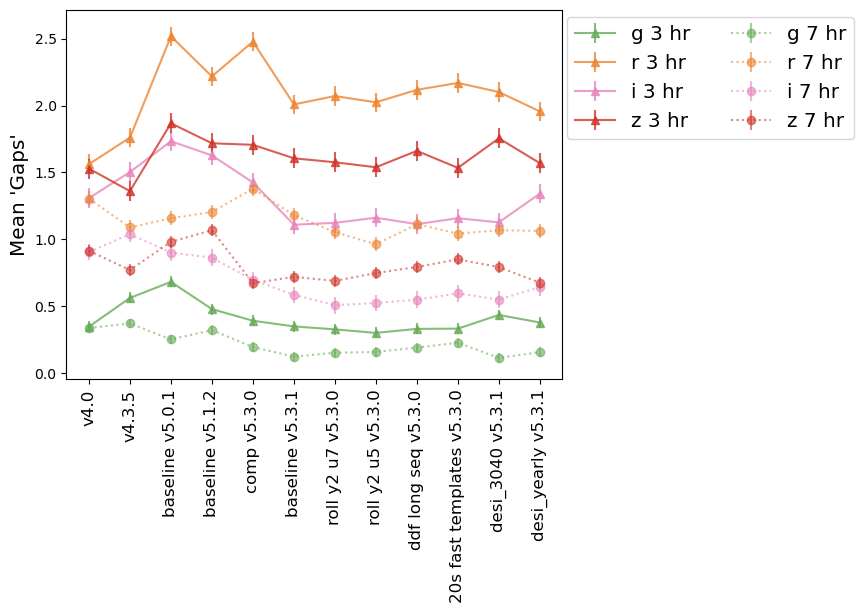

In [74]:
# Time Gaps metric 

fig, ax = plt.subplots()
mset = metrics.loc['TVS Gaps'][0:8]

run_names = [rdict[r] for r in runs]


markers = ['o', 's', '*', '<', '^', 'v', '*', '>', '.', 'X']
j = 0
for i, mm in mset.iterrows():
    m = mm['metric']
    ff = mm['short_name'].split('in ')[-1].split(' at')[0]
    #marker= markers[j]
    marker = 'o'
    if '3' in m:
        marker = '^'
        linestyle='-'
        alpha=0.8
        label=f"{ff} 3 hr"
    if '7' in m:
        marker = 'o'
        linestyle=':'
        alpha=0.6
        label =f"{ff} 7 hr"
    j += 1
    ax.errorbar(run_names, summaries.loc[runs, m], yerr=dev[m], 
                color=filter_rgb_map[ff], alpha=alpha, marker=marker, linestyle=linestyle, label=label)
plt.legend(loc=(1.01, 0.65), fontsize='x-large', ncols=2)
ax.set_ylabel("Mean 'Gaps'", fontsize='x-large')
ax.tick_params(axis='x', labelrotation = 90, labelsize='large')
fig.savefig(os.path.join(outdir, 'tgaps' + '.png'), format='png')

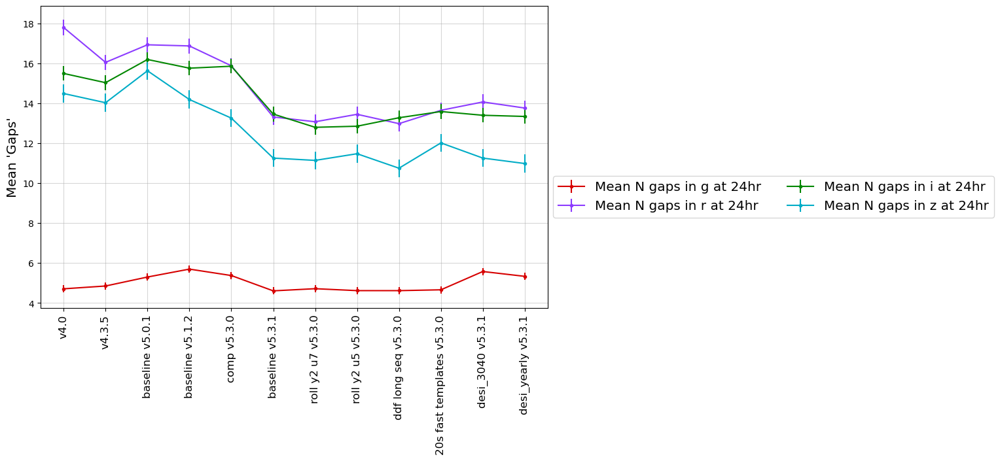

In [75]:
msub = metrics.loc['TVS Gaps'][8:12]

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 cmap=colorcet.glasbey_dark,
                                 metric_subset=msub, sep_plots=False)
plt.legend(loc=(1.01, 0.3), fontsize='x-large', ncols=2)
ax.set_ylabel("Mean 'Gaps'", fontsize='x-large')
ax.tick_params(axis='x', labelrotation = 90, labelsize='large')

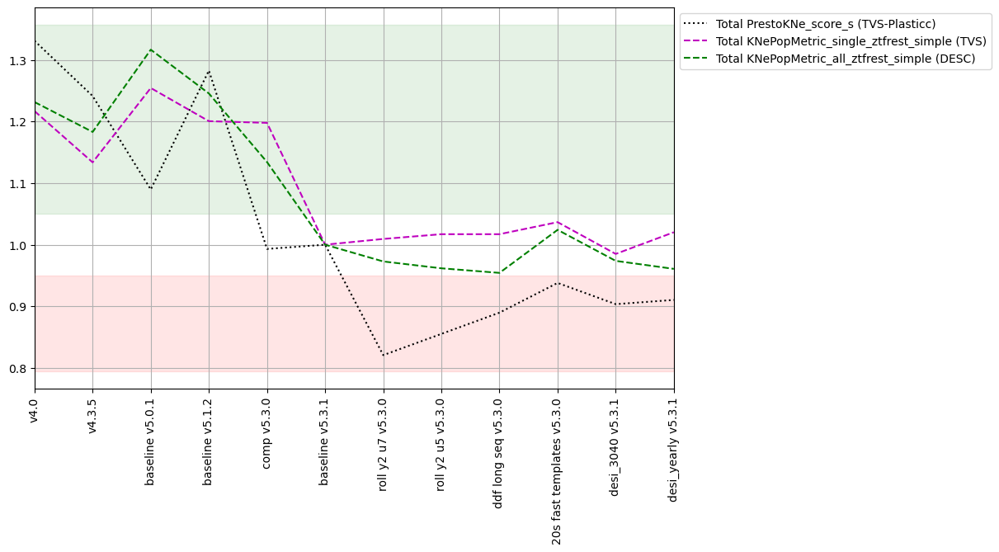

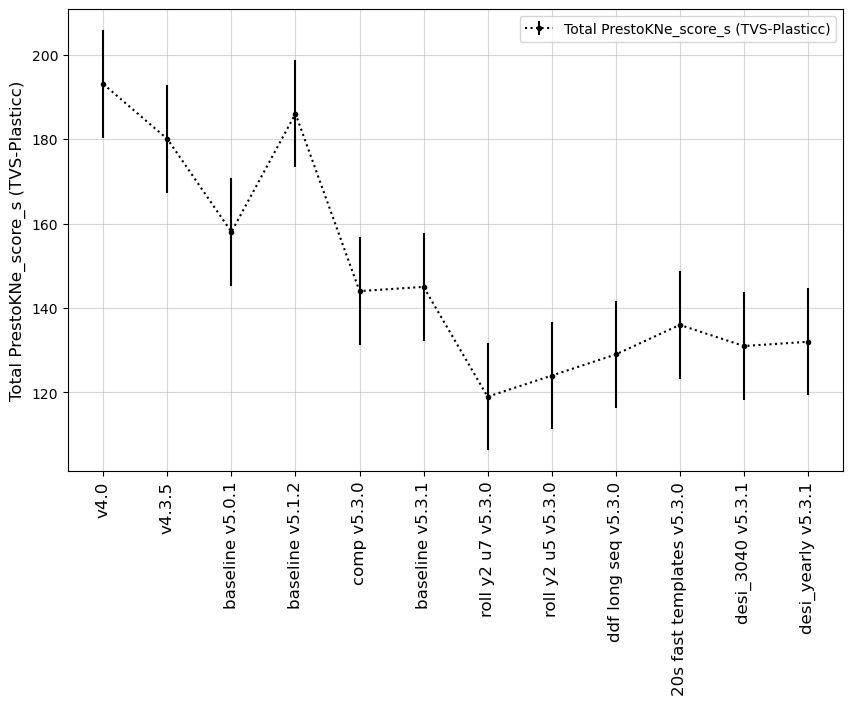

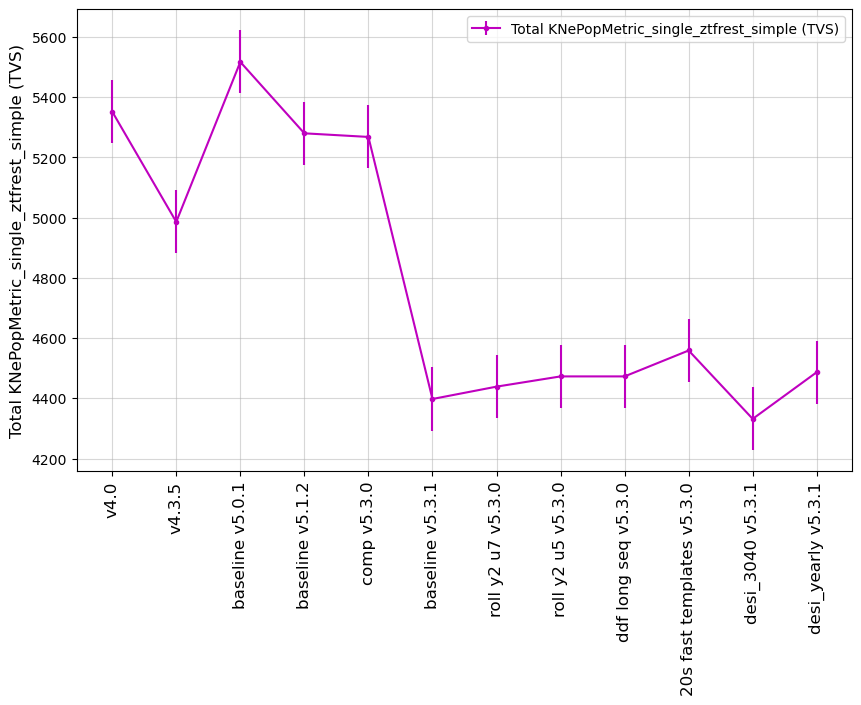

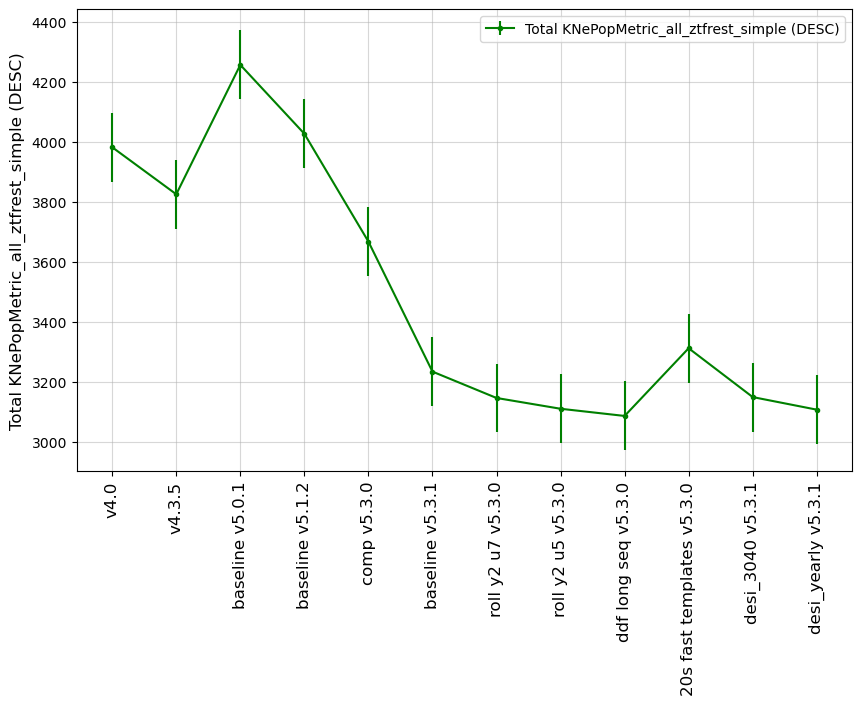

In [76]:
msub = metrics.loc['TVS KNe short']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline,
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub)

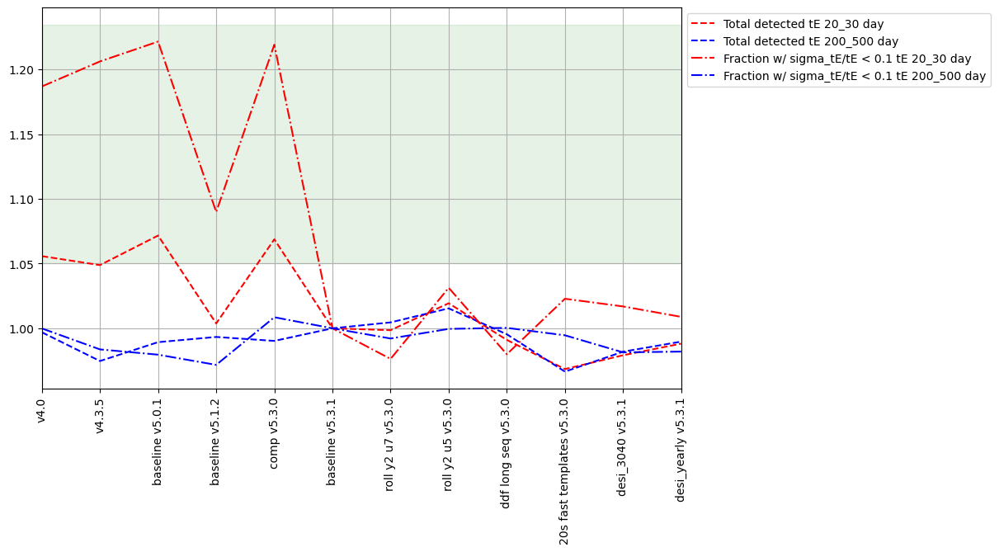

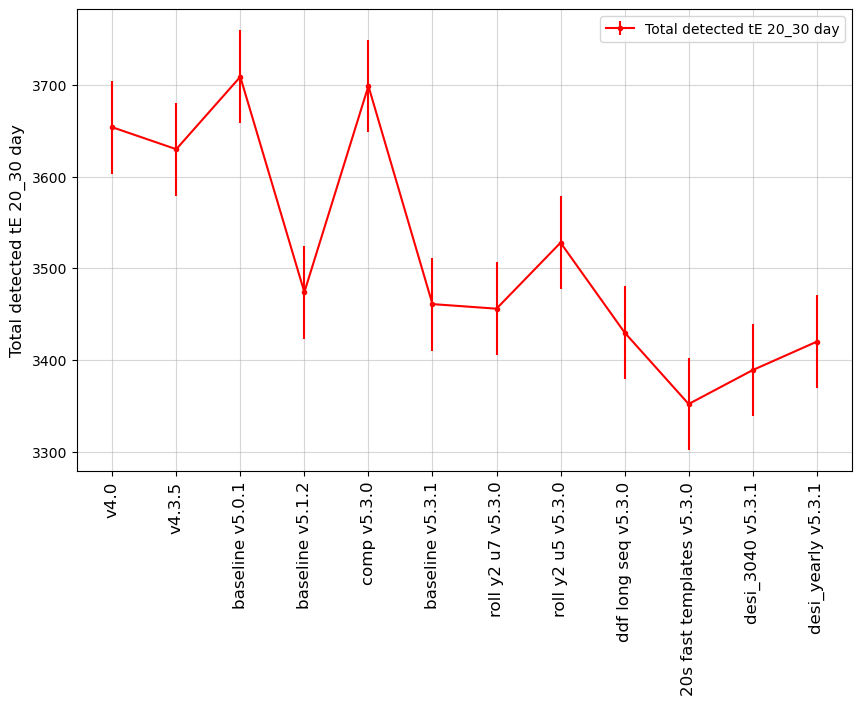

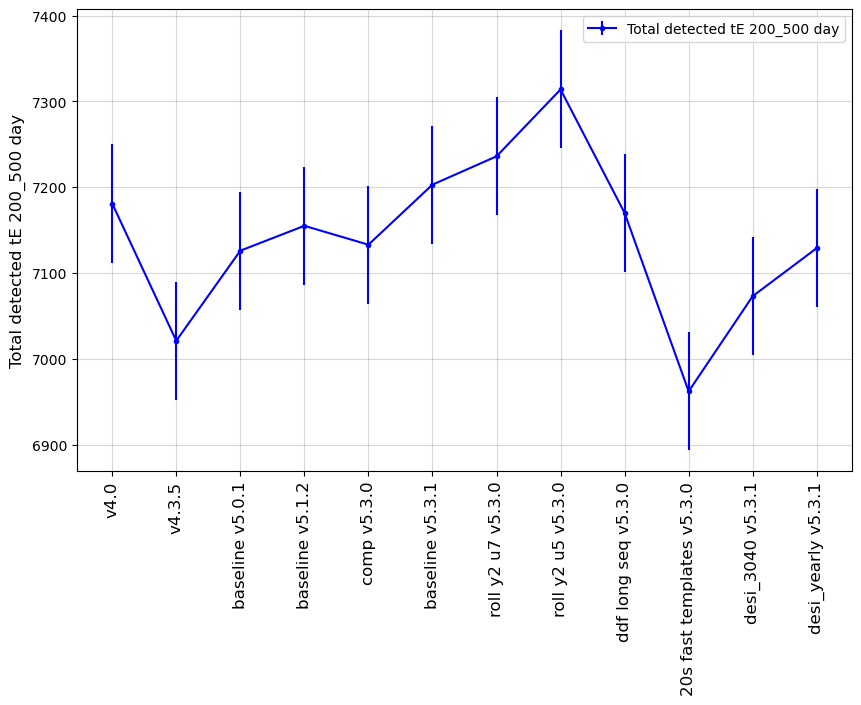

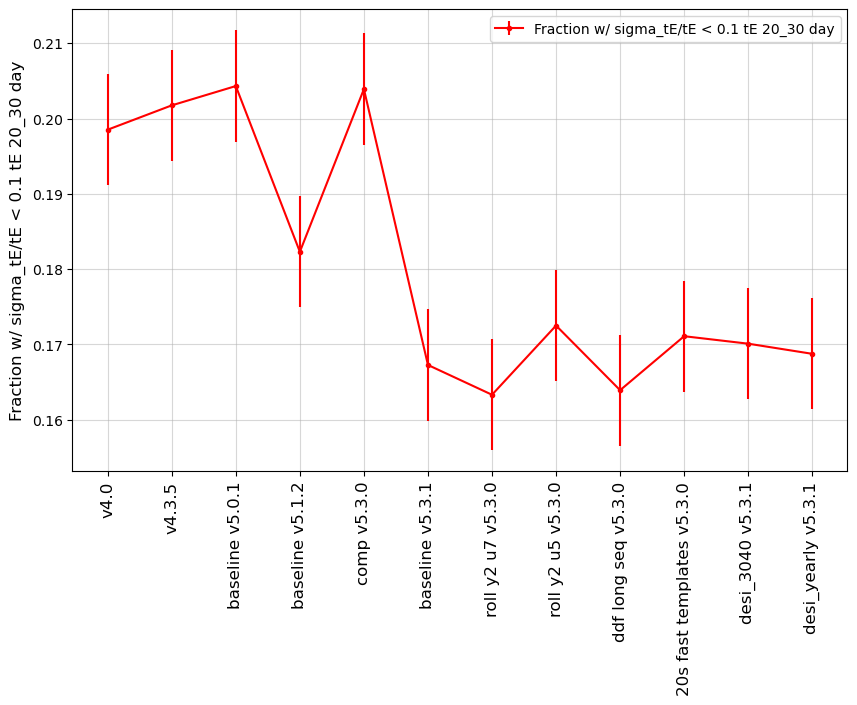

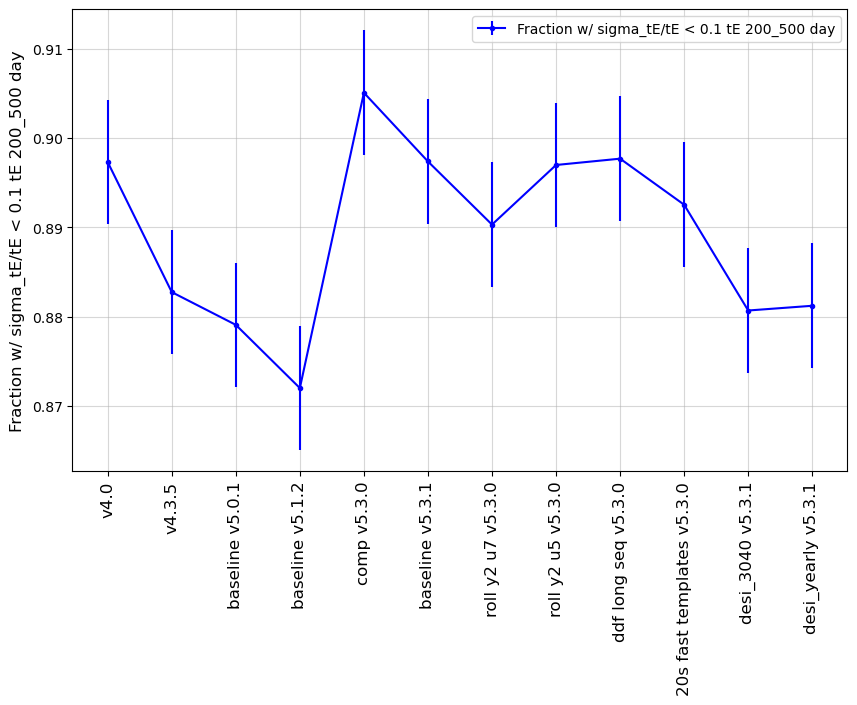

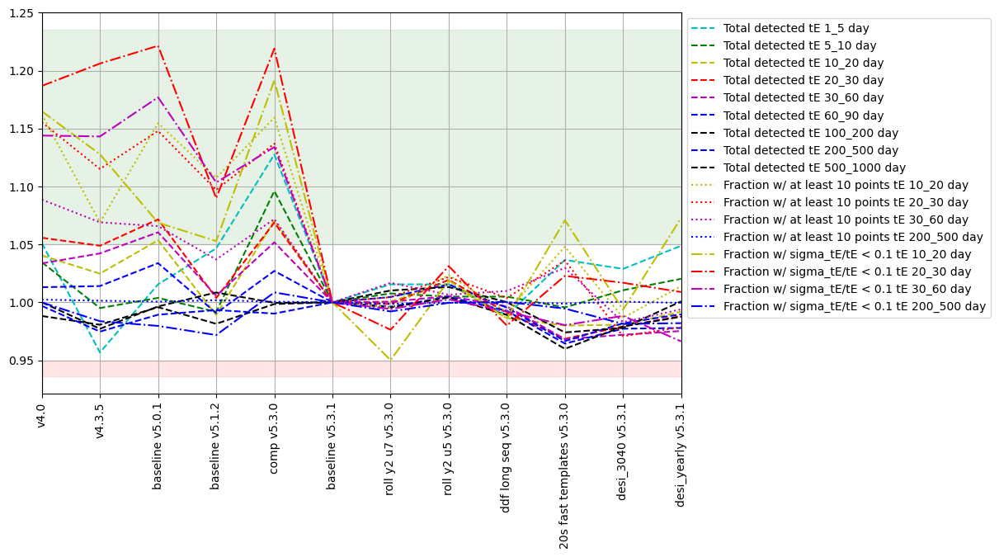

In [77]:
msub = metrics.loc['TVS microlensing short']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=True)

msub = metrics.loc['TVS microlensing all']
fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

/Users/lynnej/lsst_repos/rubin_sim/rubin_sim/maf/run_comparison/summary_plots.py:348: UserWarning: There are infinite values in the plot of Median FilterPairTGaps.
  warnings.warn(f"There are infinite values in the plot of {idx}.")


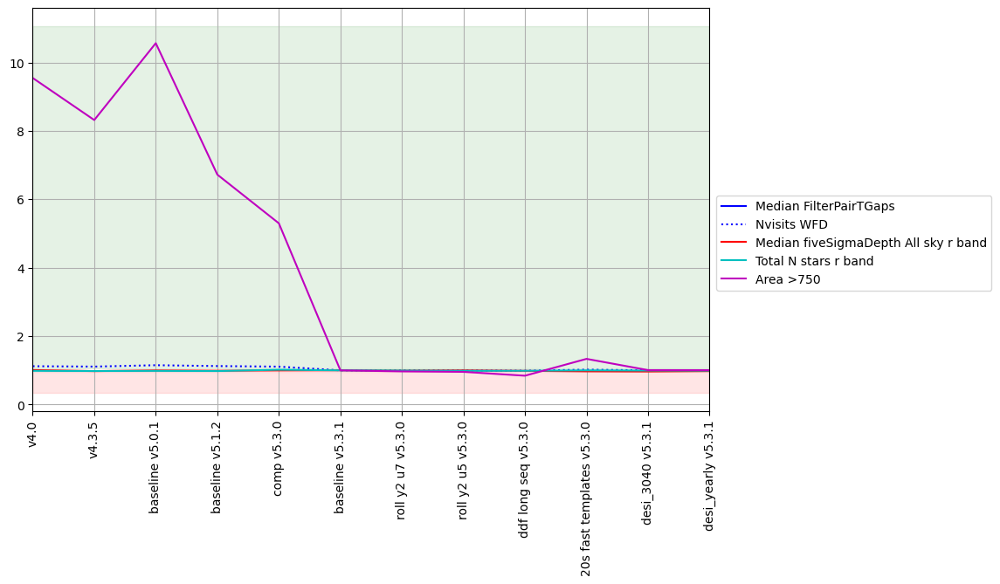

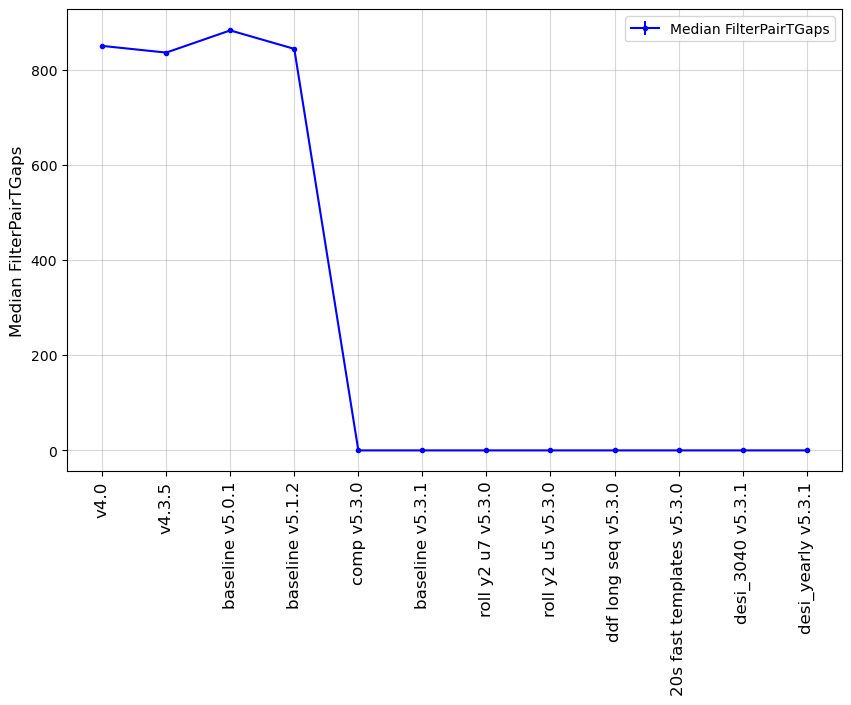

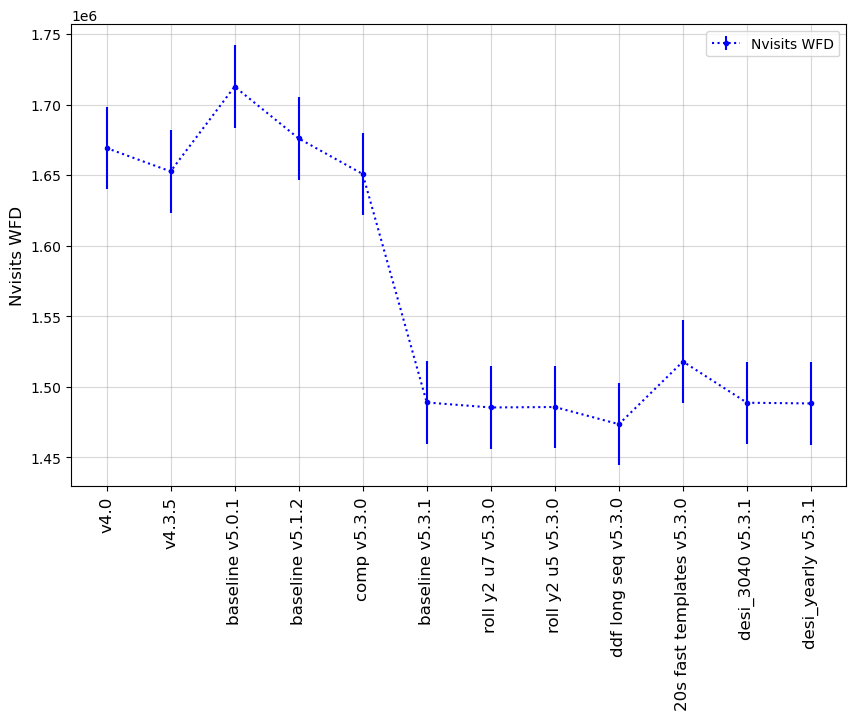

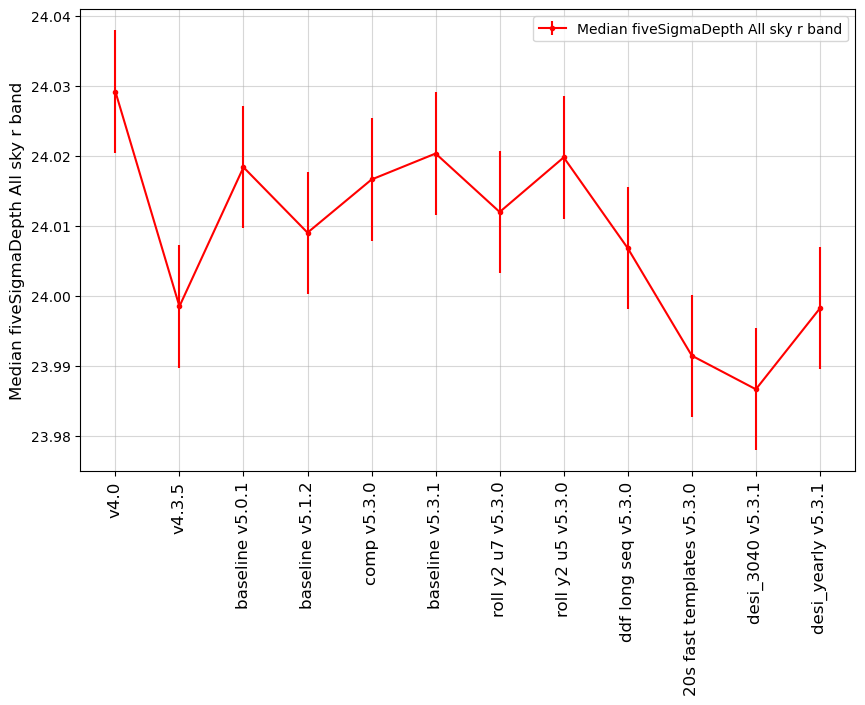

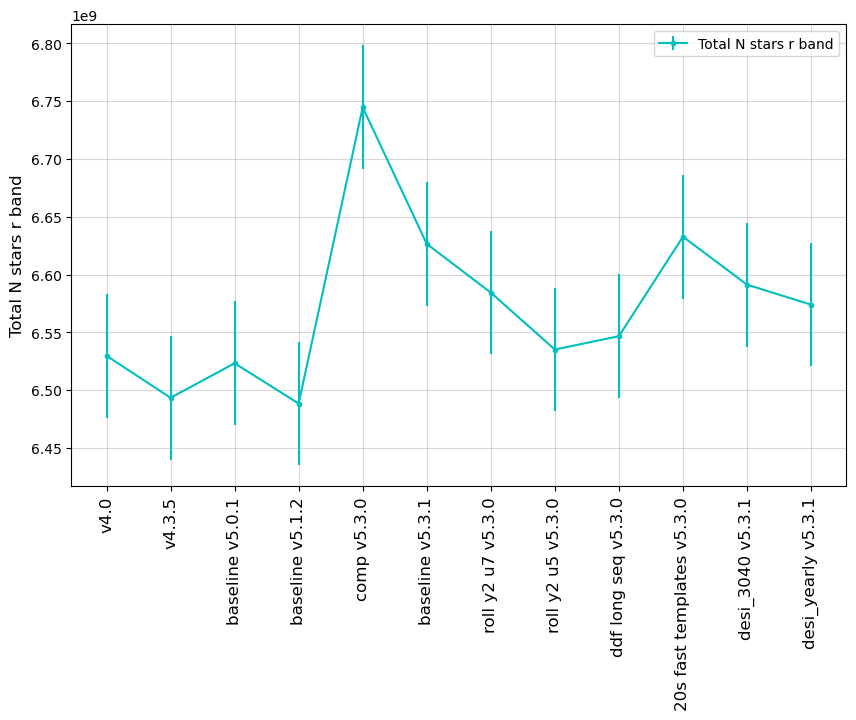

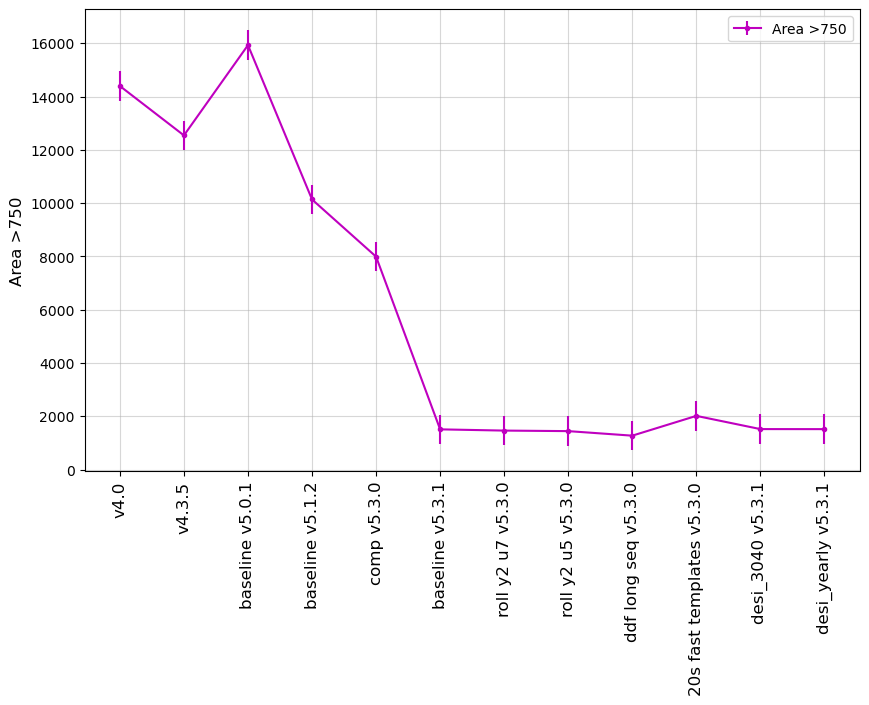

In [78]:
msub = metrics.loc['TVS anomalies']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')
ax.legend(loc=(1.01, 0.3))
              
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub)

### Solar System Objects
<a id="SSO"></a>
Metrics related to Solar System Science Collaboration goals. 

In [79]:
class TTotalNumberSSO(maf.BaseMoMetric):
    """Calculate the total number of objects of a given population
    expected at a given H value or larger.

    Operations on differential completeness values
    (or equivalent; fractions of the population is ok if
    still a differential metric result, not cumulative).

    Parameters
    ----------
    h_mark : `float`, optional
        The H value at which to calculate the expected total number of objects.
    dndh_func : function, optional
        The dN/dH distribution used calculate the expected population size.

    Returns
    -------
    nObj : `float`
        The predicted number of objects in the population.
    """

    def __init__(self, h_mark=22, dndh_func=maf.neo_dndh_granvik, dndh_args=None, **kwargs):
        self.h_mark = h_mark
        self.dndh_func = dndh_func
        self.dndh_args = dndh_args
        metric_name = "Nobj <= %.1f" % (h_mark)
        super().__init__(metric_name=metric_name, **kwargs)

    def run(self, metric_vals, h_vals):
        totals = maf.sum_over_h(metric_vals, h_vals, self.dndh_func, **self.dndh_args)
        n_obj = np.interp(self.h_mark, h_vals, totals)
        return n_obj

/Users/lynnej/lsst_repos/rubin_sim/rubin_sim/maf/metrics/base_metric.py:32: UserWarning: Redefining metric __main__.TTotalNumberSSO! (there are >1 metrics with the same name)
  warnings.warn("Redefining metric %s! (there are >1 metrics with the same name)" % (metricname))


In [80]:
# mm = [c for c in summaries if 'Trojan' in c and 'DifferentialCompleteness' in c and 'DiscoveryNChances' in c 
#            and '3 pairs in 15 nights detection loss' in c]
# hvals = [float(m.split("= ")[1].split(" DiscoveryNChances")[0]) for m in mm]
# hrange = np.sort(np.array(hvals))

# # NTr5 = 794 × 10^0.44(H−12)
# # NTNO = 71,400 × 10^0.63(H−9.1),
# # NNEA = 960 × 10^0.35(H−18)
# kwargs = {'no': 794, 'ho': 12, 'h_index': 0.44}
# total_num = TTotalNumberSSO(h_mark=25, dndh_func=maf.power_law_dndh, dndh_args=kwargs)
# for r in runs:
#     _ = plt.plot(hrange, summaries.loc[r, mm].values)
#     nobj = total_num.run(summaries.loc[r, mm].values, hrange)
#     print(r, nobj)
# mask  = np.where(hrange > 6.2)
# #50 percent H value
# np.interp(0.5, 1-summaries.loc[r, mm].values[mask], hrange[mask])

/Users/lynnej/lsst_repos/rubin_sim/rubin_sim/maf/run_comparison/summary_plots.py:348: UserWarning: There are infinite values in the plot of Fraction with 6 filters TNO H=7.0.
  warnings.warn(f"There are infinite values in the plot of {idx}.")


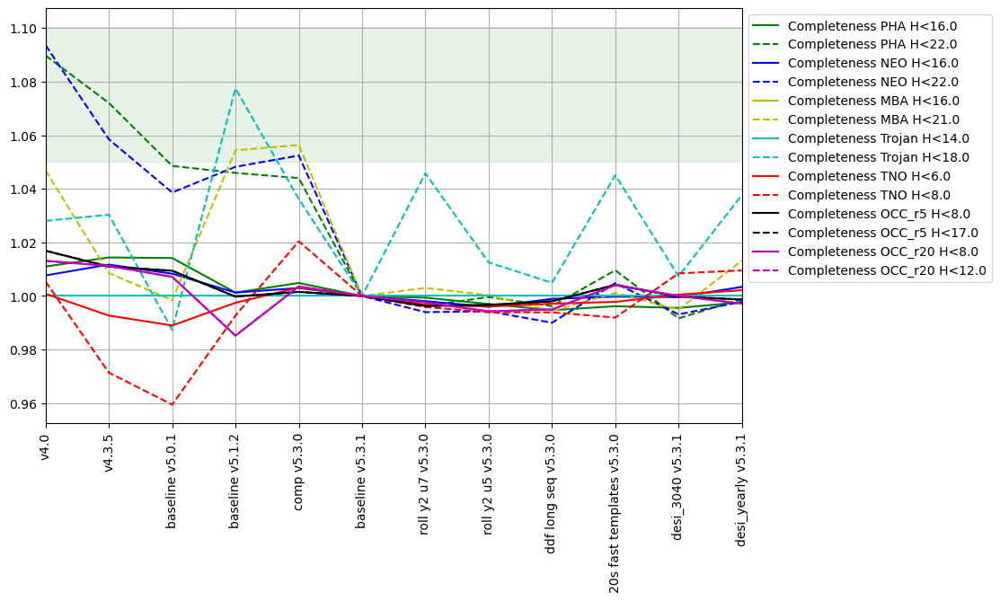

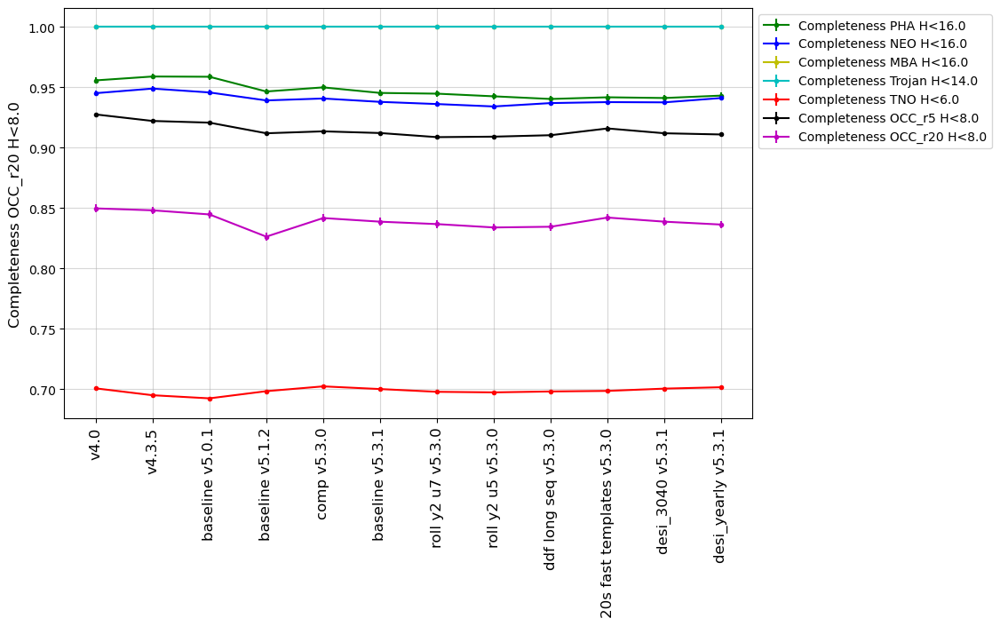

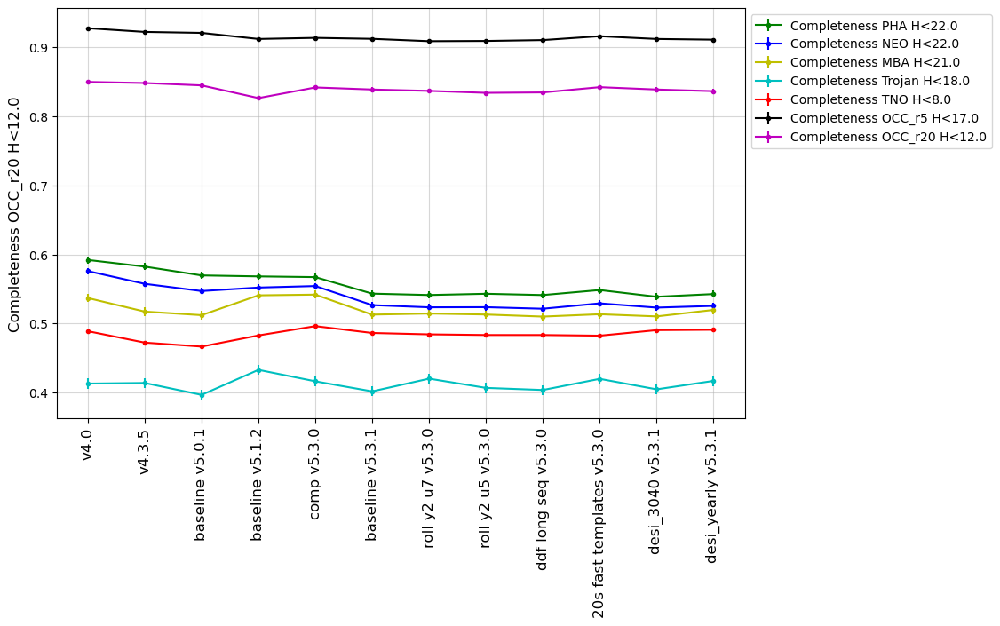

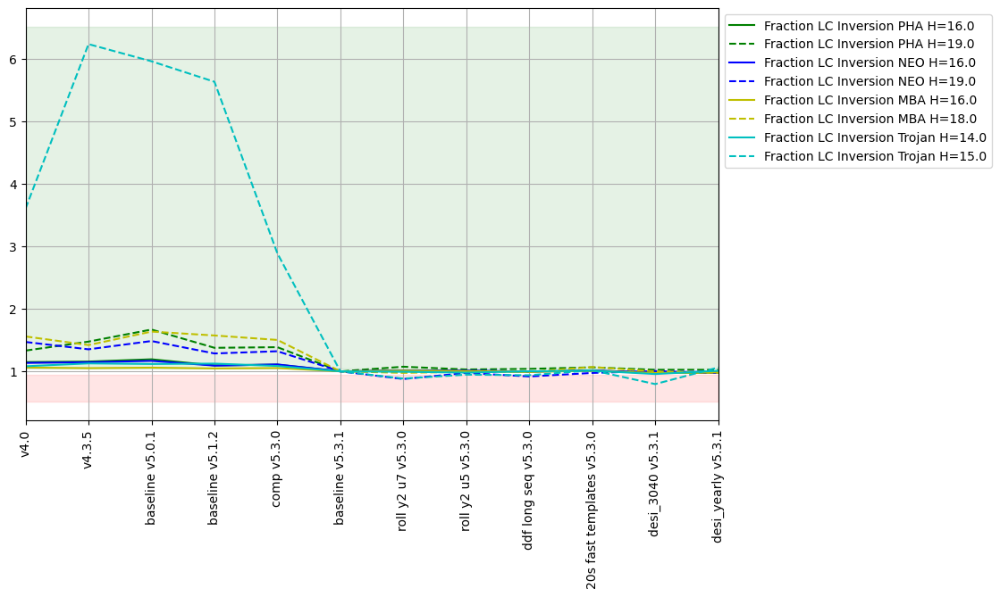

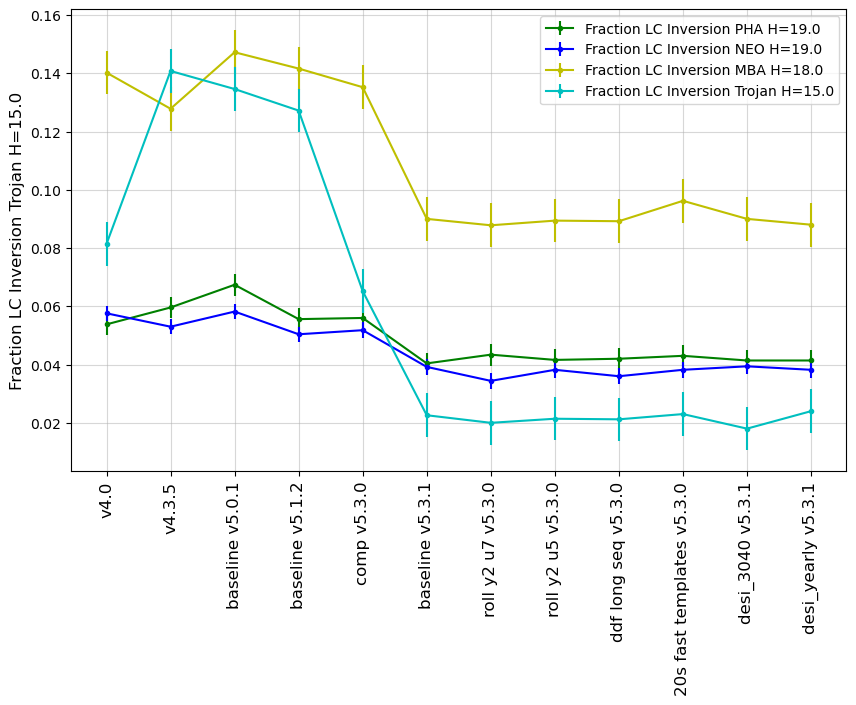

...

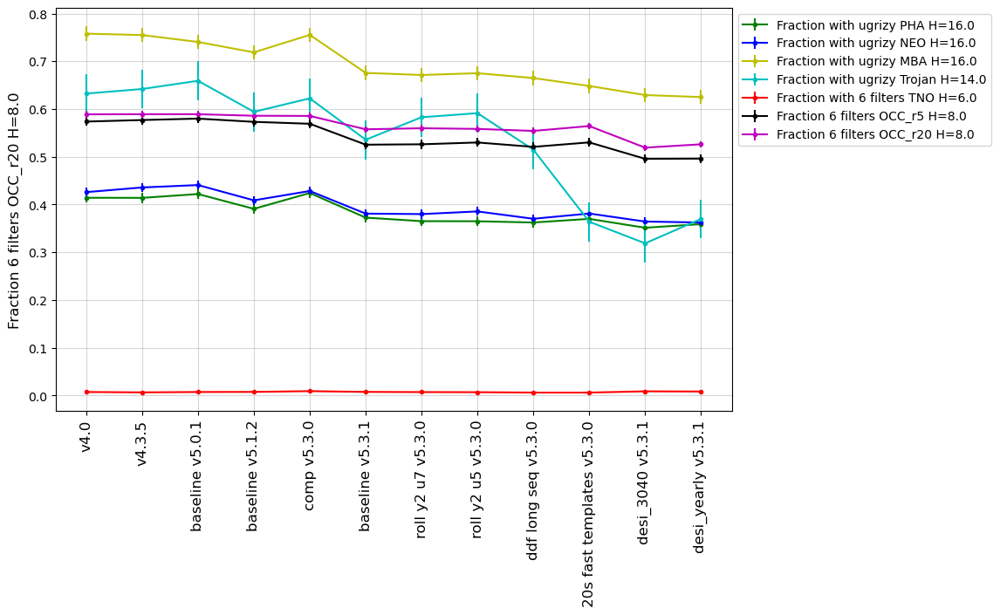

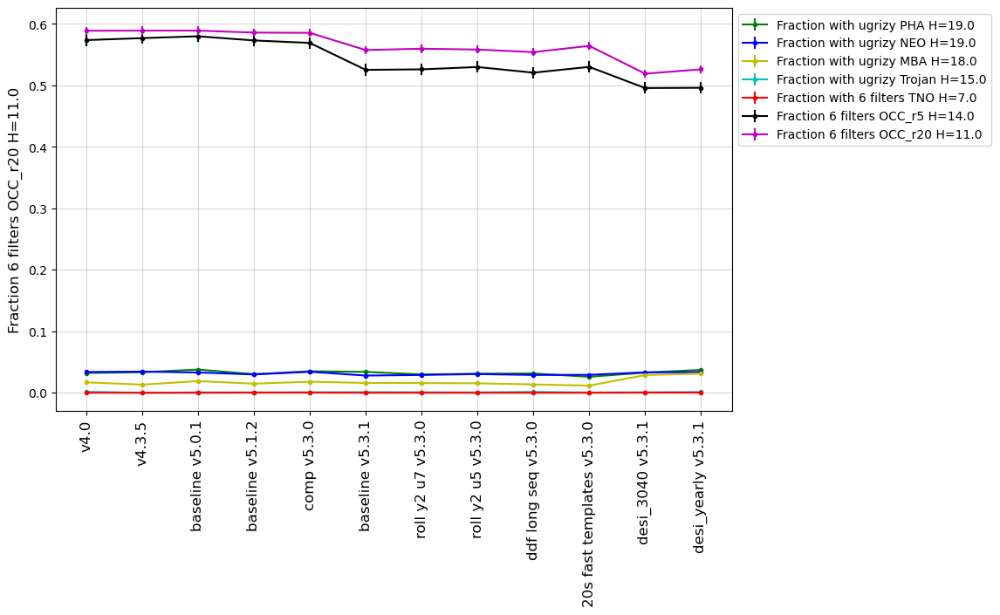

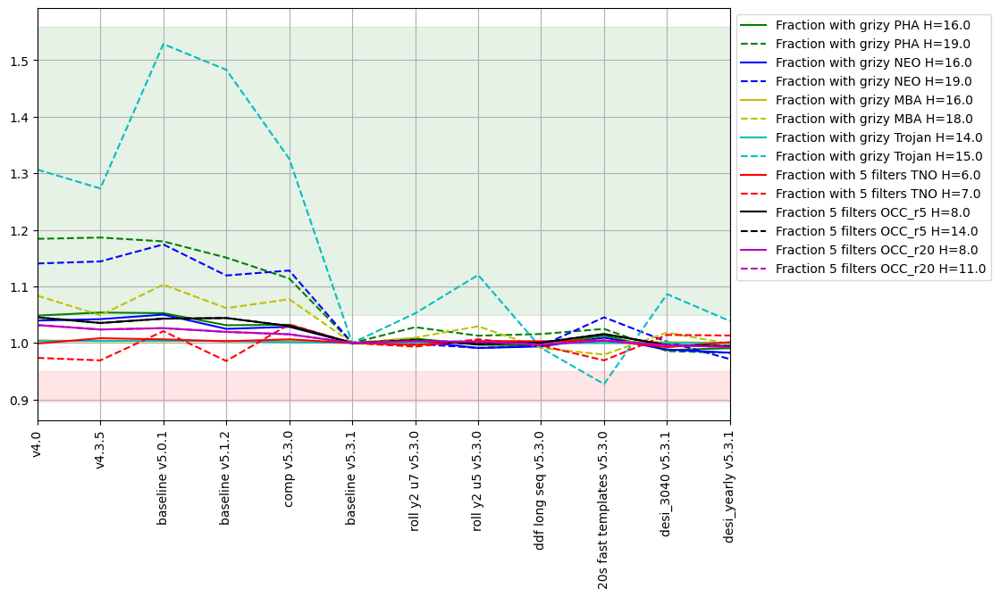

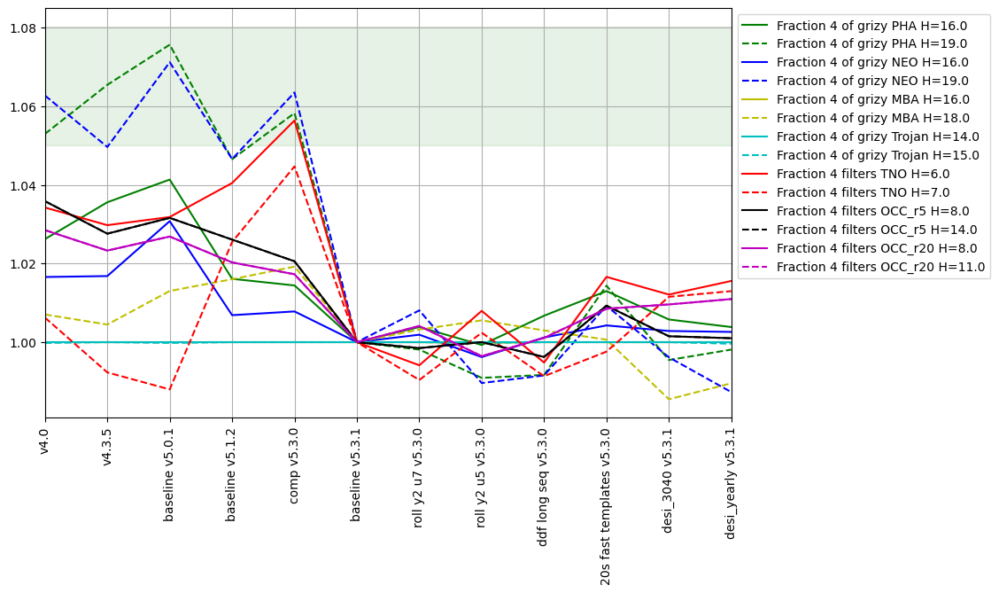

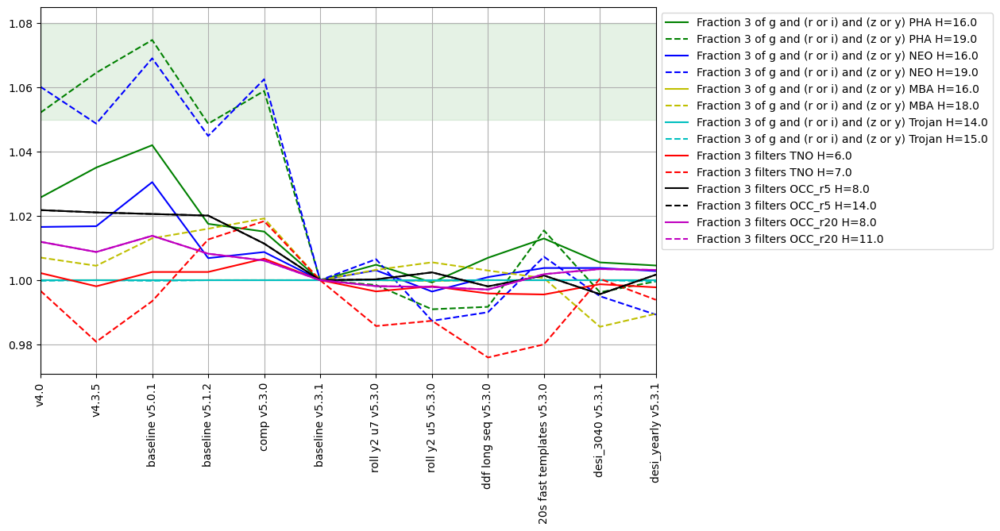

In [81]:
msub = metrics.loc['SSO discovery']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

msub = metrics.loc['SSO discovery'][::2]

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=False)
fig.savefig(os.path.join(outdir, 'completeness_bright' + '.png'), format='png')

msub = metrics.loc['SSO discovery'][1::2]
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=False)
fig.savefig(os.path.join(outdir, 'completeness_faint' + '.png'), format='png')


msub = metrics.loc['SSO lightcurve inversion']
fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')


msub = metrics.loc['SSO lightcurve inversion'][1::2]
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=False)
fig.savefig(os.path.join(outdir, 'lightcurves_faint' + '.png'), format='png')


msub = metrics.loc['SSO fraction 6 bands']
fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

msub = metrics.loc['SSO fraction 6 bands'][::2]
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=False)
fig.savefig(os.path.join(outdir, 'colors6_bright' + '.png'), format='png')

msub = metrics.loc['SSO fraction 6 bands'][1::2]
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=False)
fig.savefig(os.path.join(outdir, 'colors6_faint' + '.png'), format='png')

msub = metrics.loc['SSO fraction 5 bands']
fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

msub = metrics.loc['SSO fraction 4 bands']
fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

msub = metrics.loc['SSO fraction 3 bands']
fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

### AGN
<a id="AGN"></a>
Metrics contributed by the Active Galactic Nuclei science collaboration.

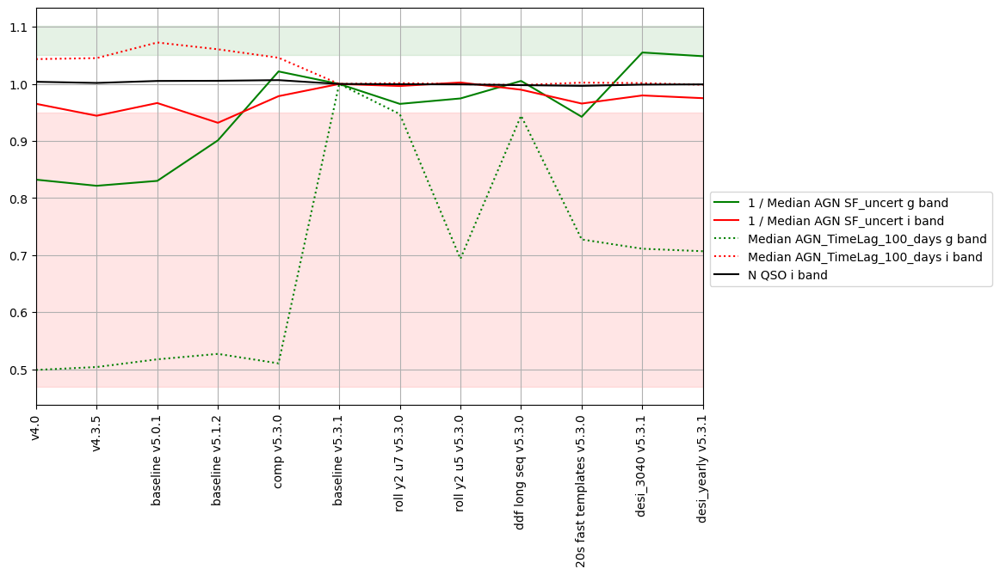

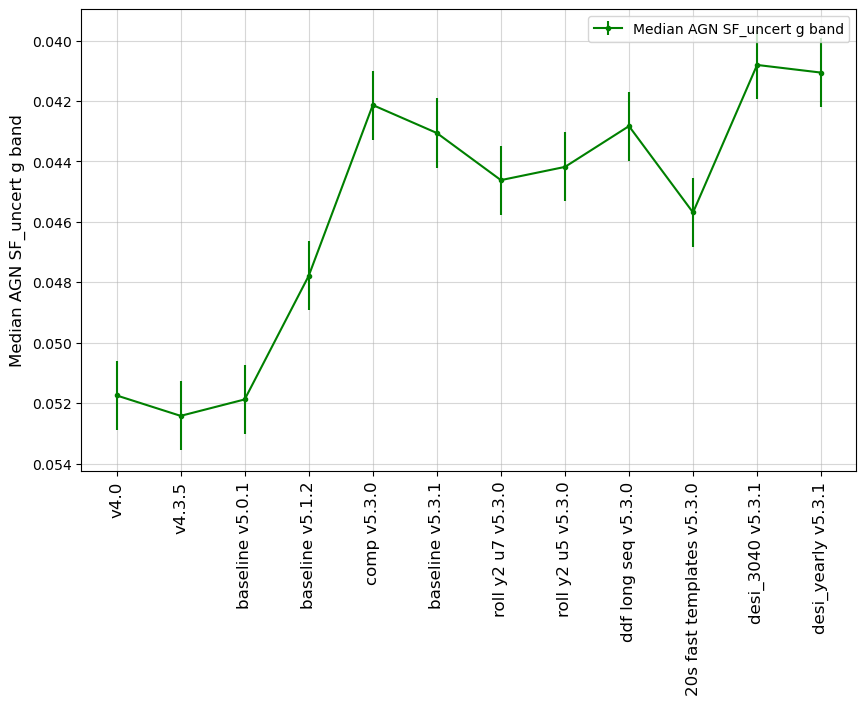

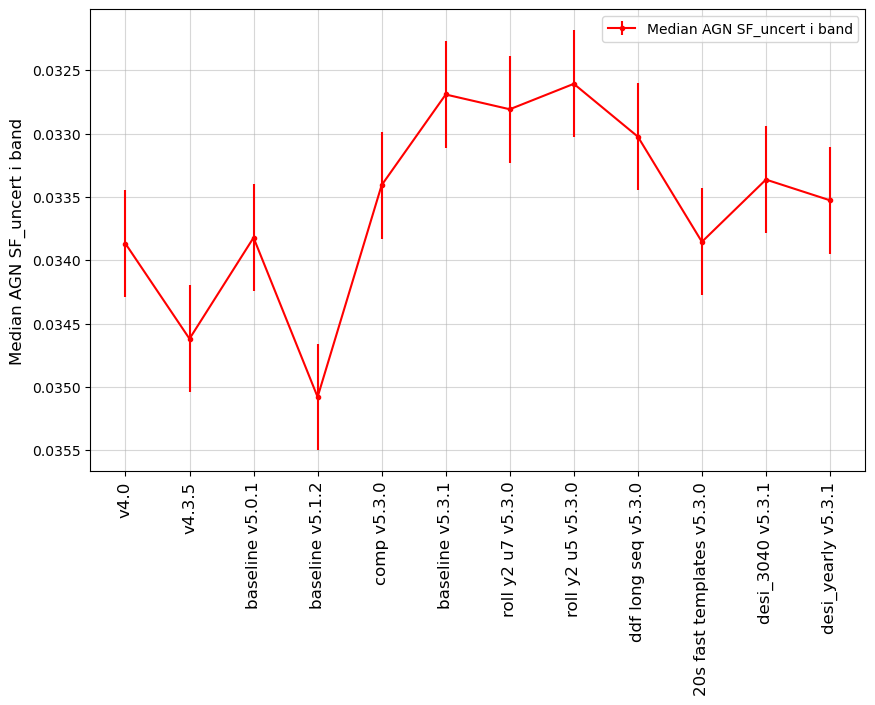

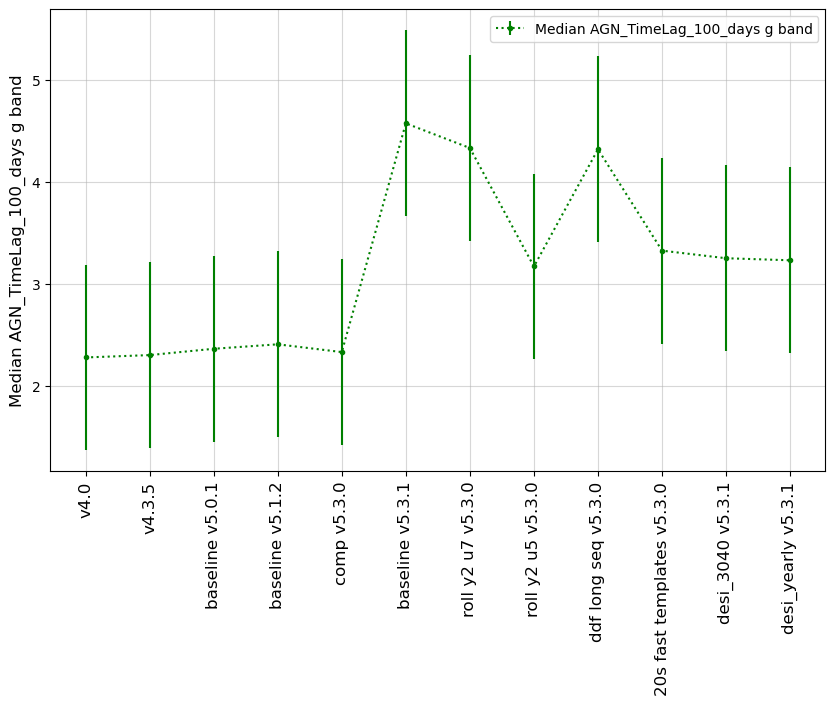

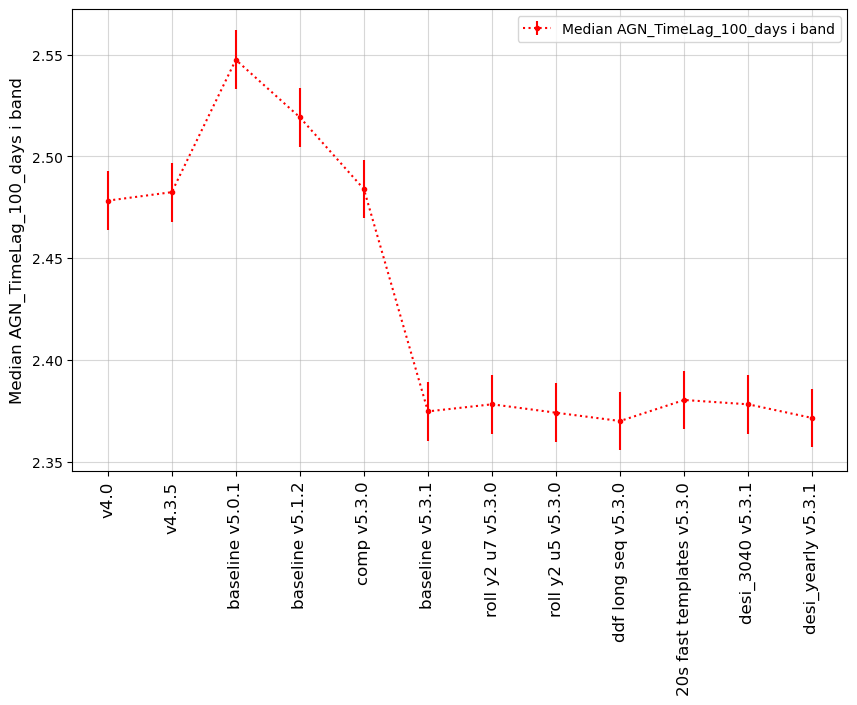

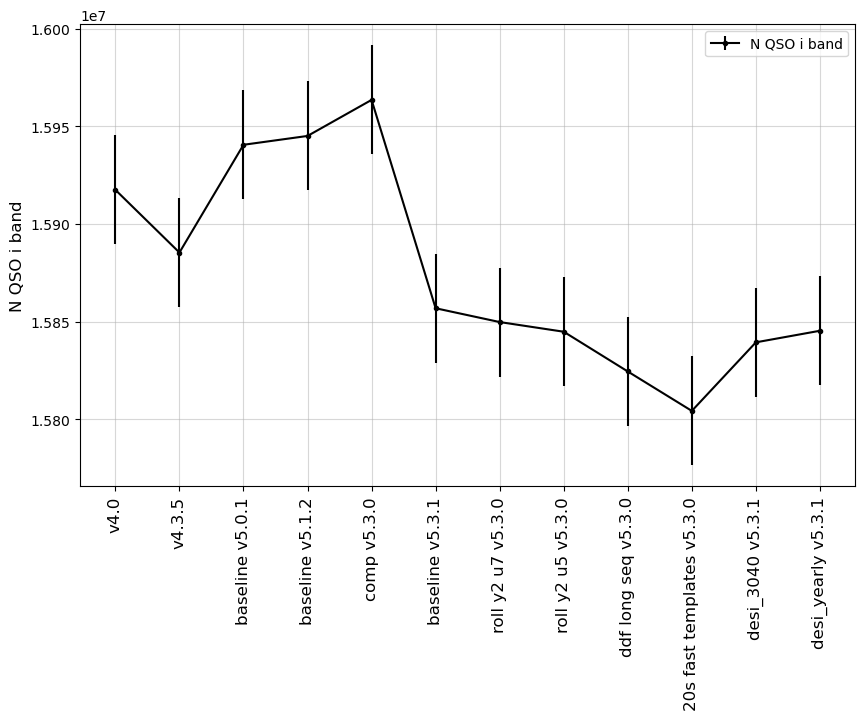

In [82]:
msub = metrics.loc['AGN short']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')
ax.legend(loc=(1.01, 0.3))
              
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=True)

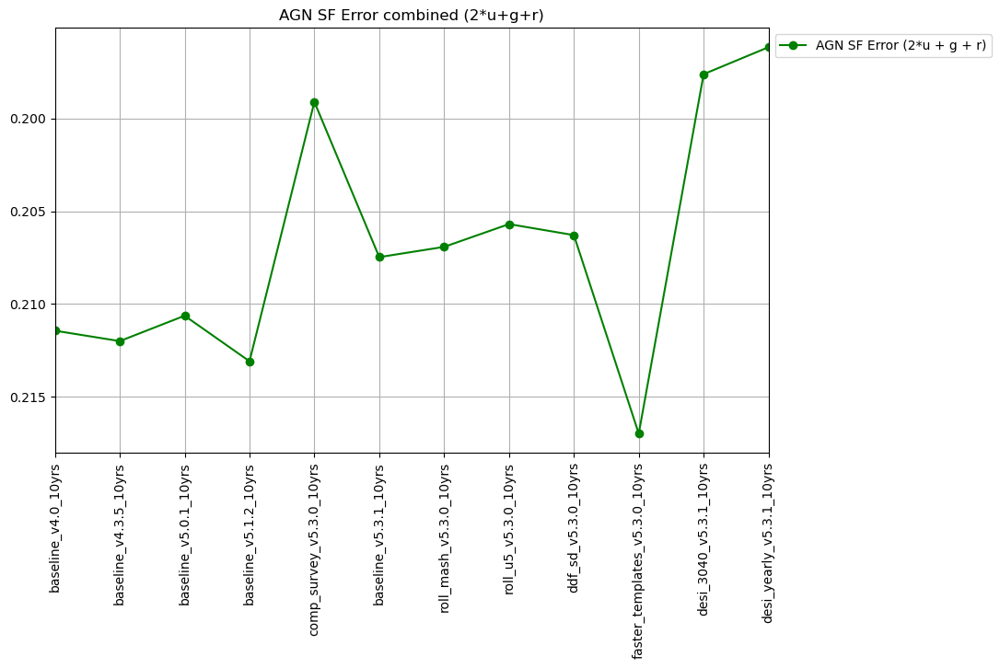

In [83]:
msub  = metrics.loc['AGN SF']
u = msub.iloc[0:1]
g = msub.iloc[1:2]
r = msub.iloc[2:3]
agn_sf = pd.DataFrame(summaries.loc[runs, u['metric']].values * 2 
                      + summaries.loc[runs, g['metric']].values * 1 
                      + summaries.loc[runs, r['metric']].values * 1,
                      columns=['AGN SF Error (2*u + g + r)'], index=runs)

fig, ax = maf.plot_run_metric(agn_sf, shade_fraction=None, linestyles='-',
                            vertical_quantity='value', horizontal_quantity='run')
ylim = ax.set_ylim()
ax.set_ylim(ylim[1], ylim[0])
_ = plt.title("AGN SF Error combined (2*u+g+r)")

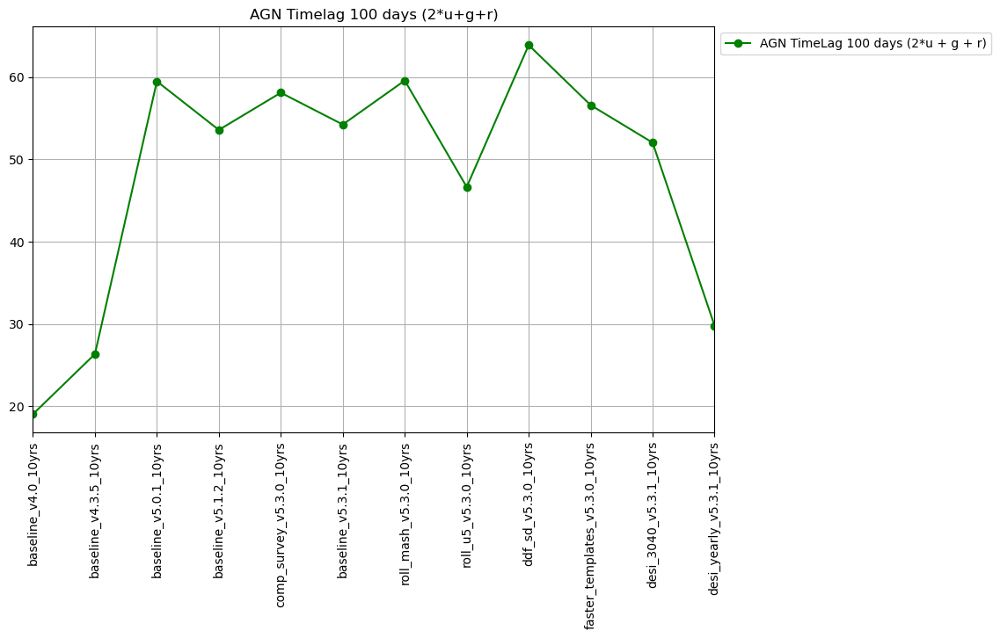

In [84]:
msub  = metrics.loc['AGN timelag']
msub = msub.query('metric.str.contains("100")')
u = msub.iloc[0:1]
g = msub.iloc[1:2]
r = msub.iloc[2:3]
agn_sf = pd.DataFrame(summaries.loc[runs, u['metric']].values * 2 
                      + summaries.loc[runs, g['metric']].values * 1 
                      + summaries.loc[runs, r['metric']].values * 1,
                      columns=['AGN TimeLag 100 days (2*u + g + r)'], index=runs)

fig, ax = maf.plot_run_metric(agn_sf, shade_fraction=None, linestyles='-',
                            vertical_quantity='value', horizontal_quantity='run')
ylim = ax.set_ylim()
_ = plt.title("AGN Timelag 100 days (2*u+g+r)")

### Galaxies
<a id="Galaxies"></a>
Metrics evaluating the total number of galaxies expected in the survey.

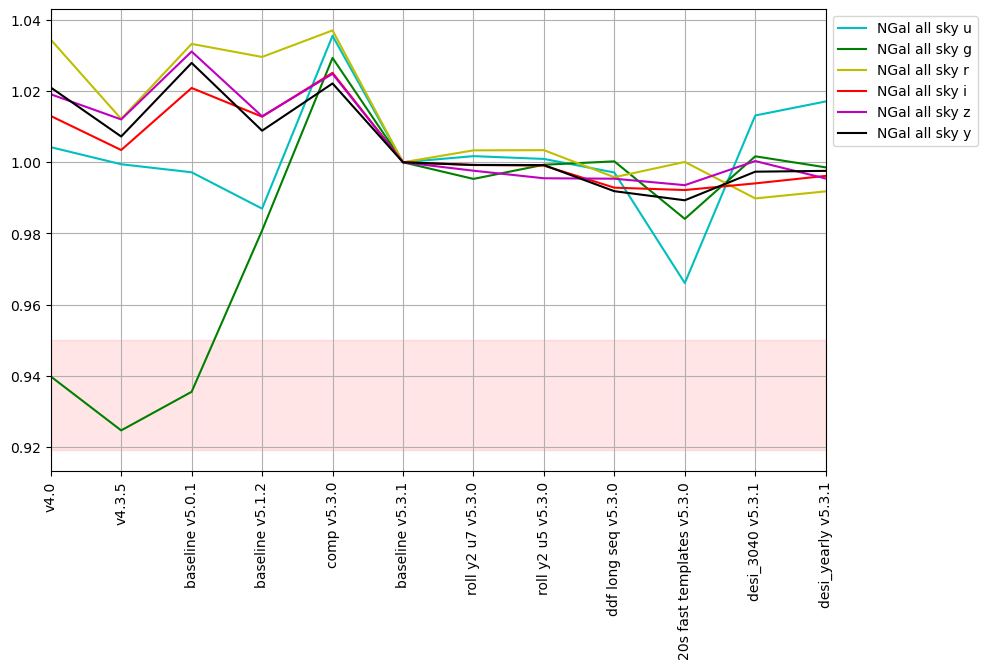

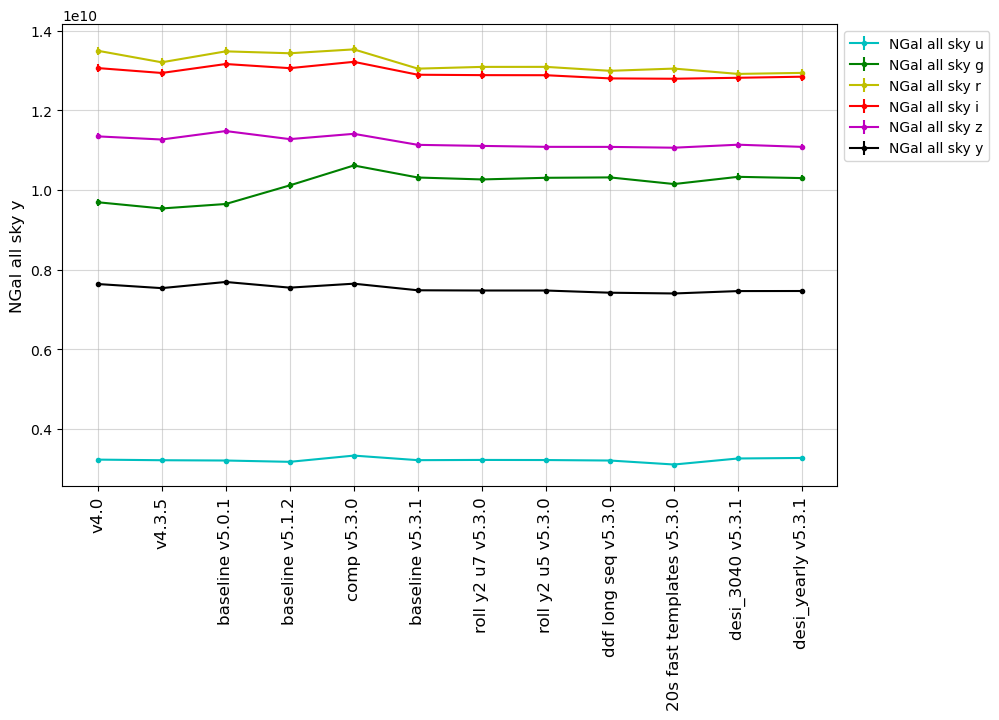

In [85]:
msub = metrics.loc['galaxies']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=False)

### Strong Lensing
<a id="StrongLensing"></a>
Metrics contributed by the Strong Lensing Science Collaboration. 

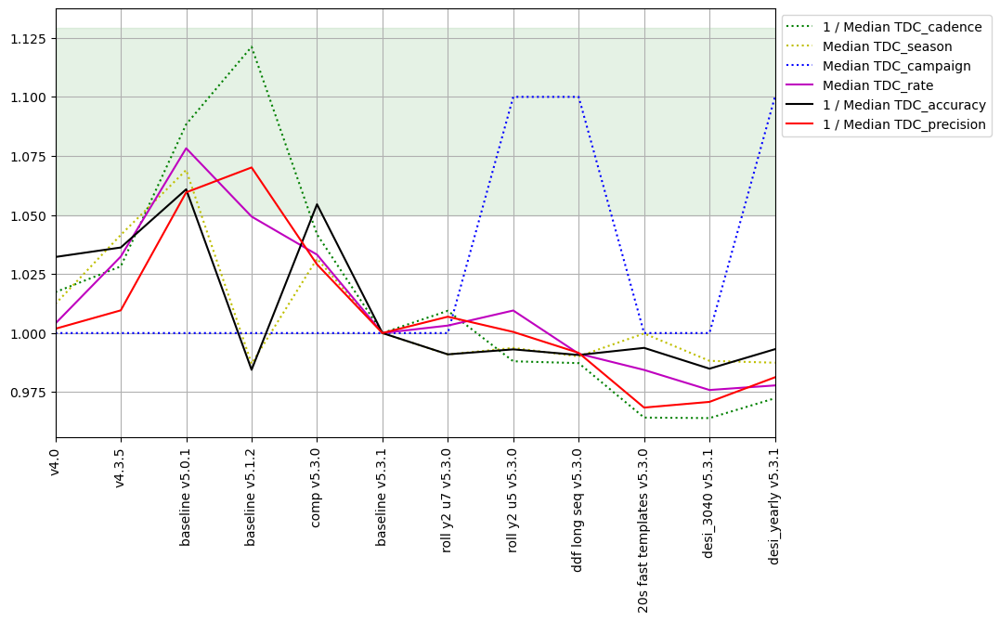

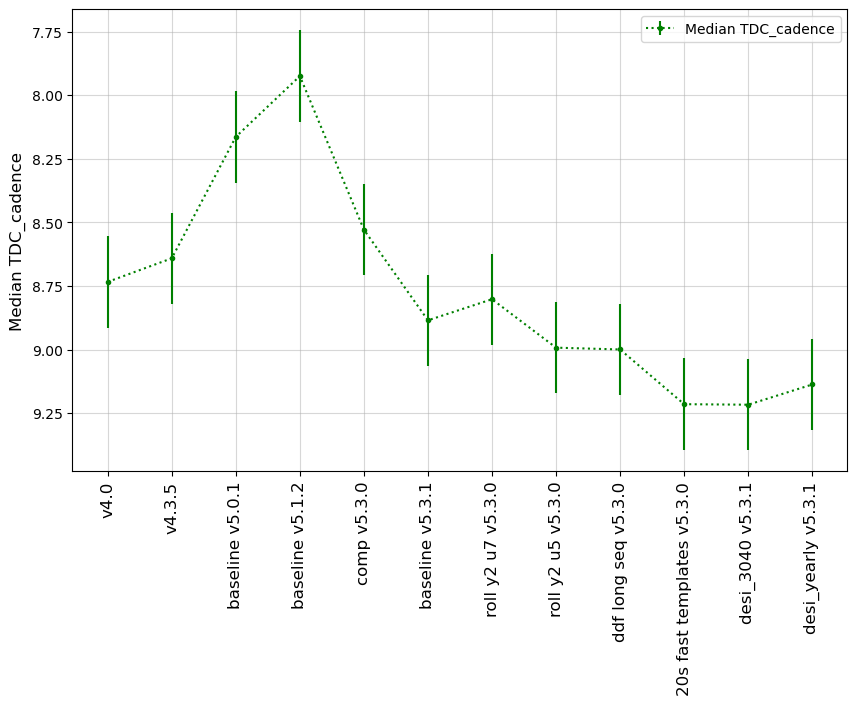

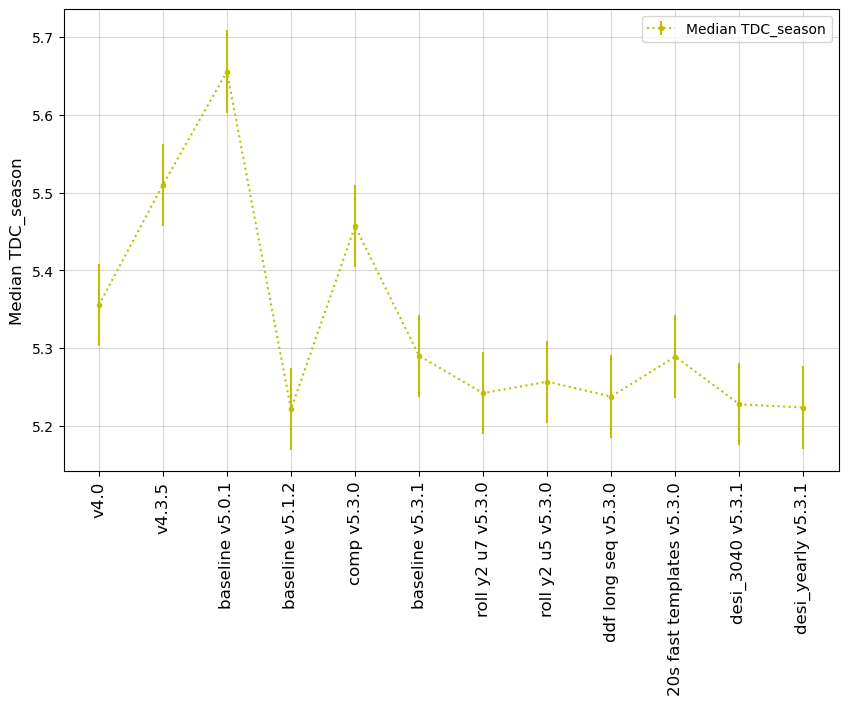

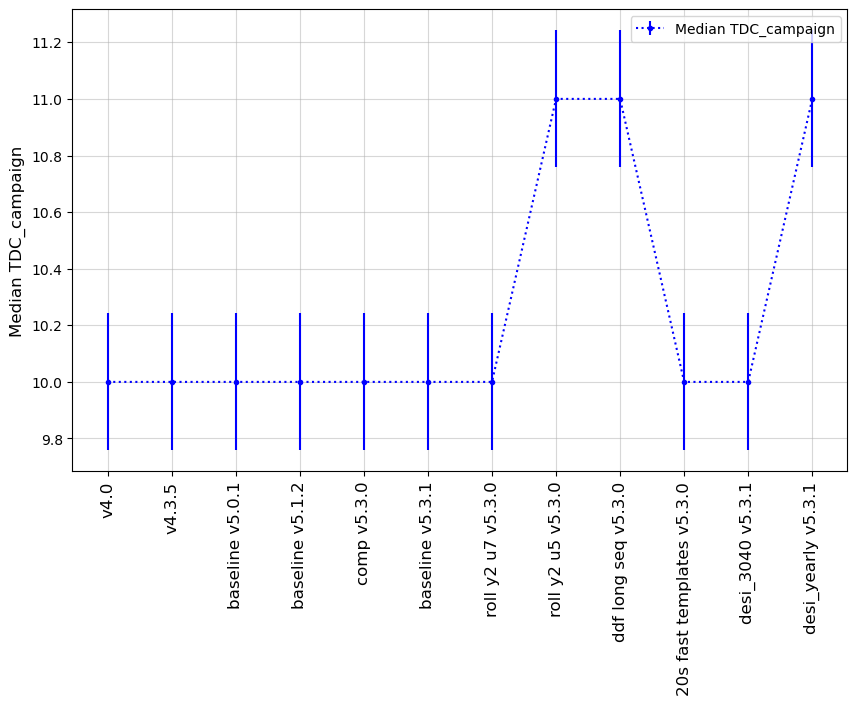

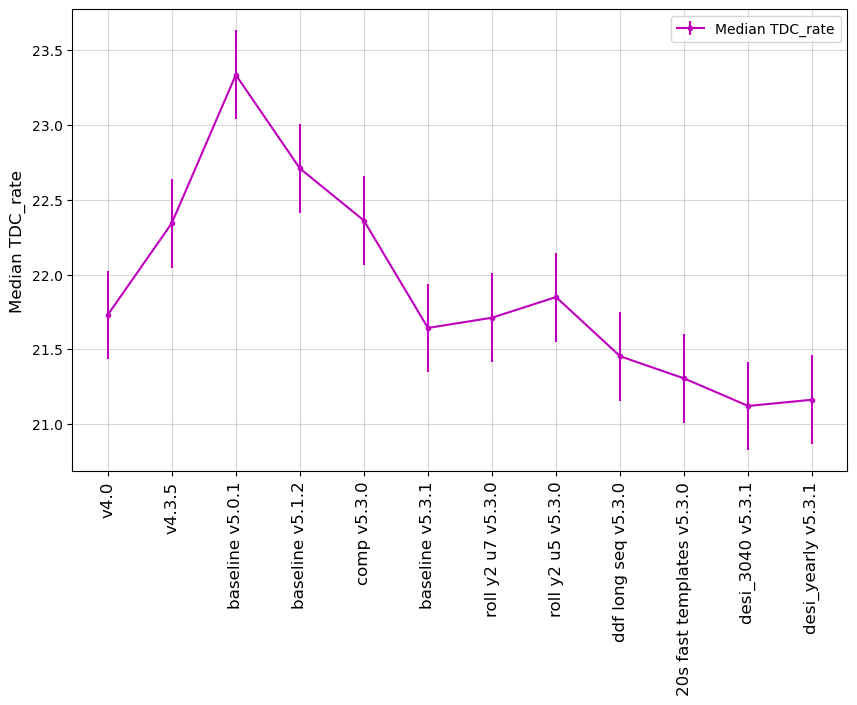

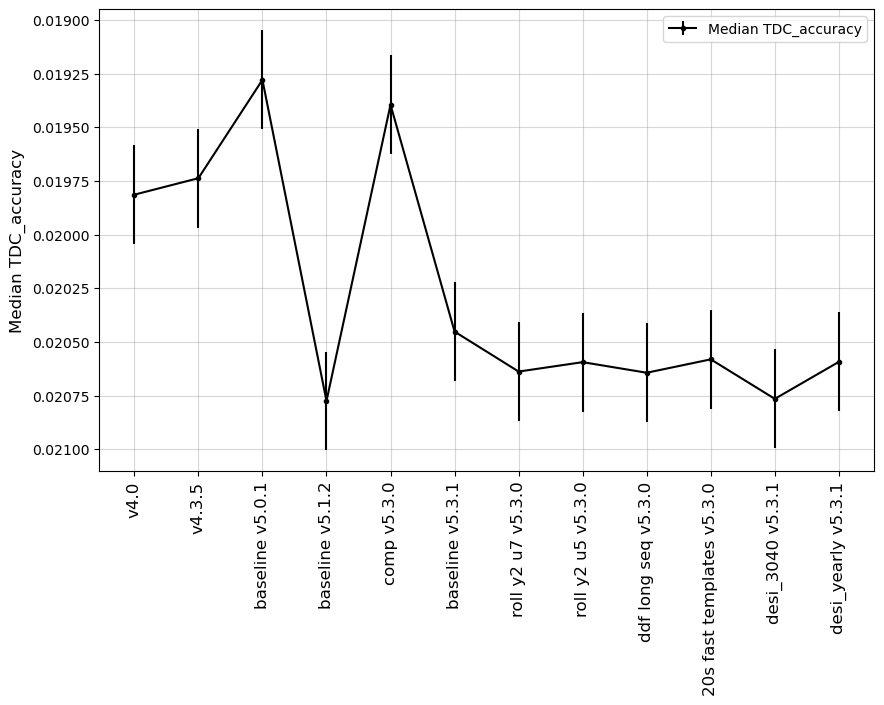

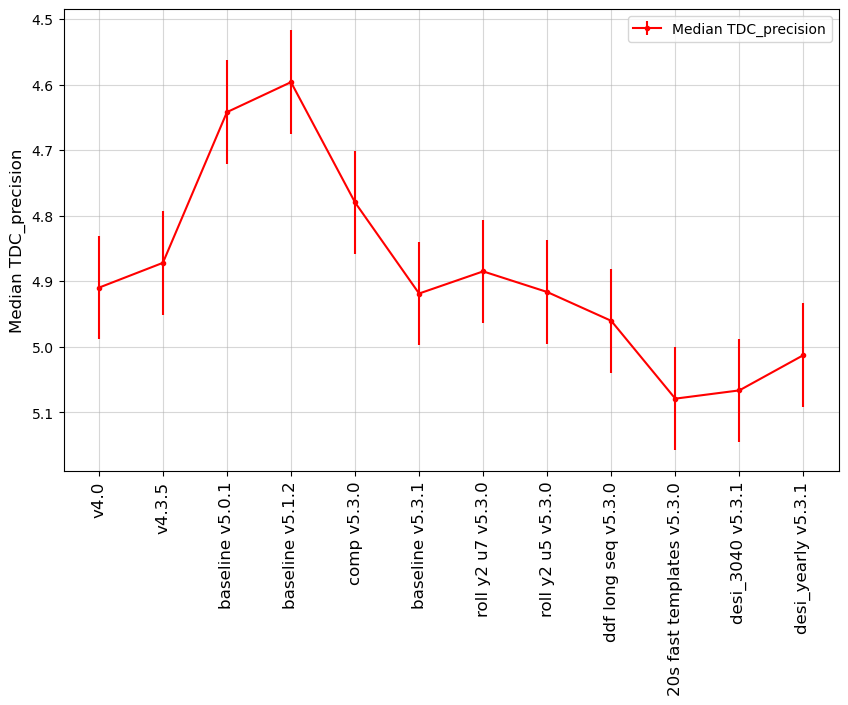

In [86]:
msub = metrics.loc['SL TDC']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=True)

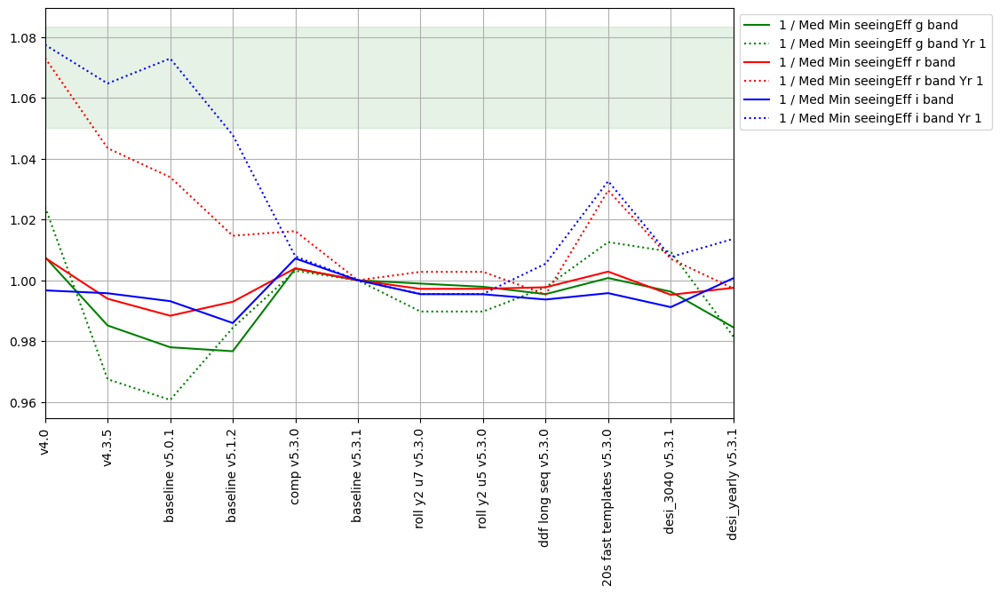

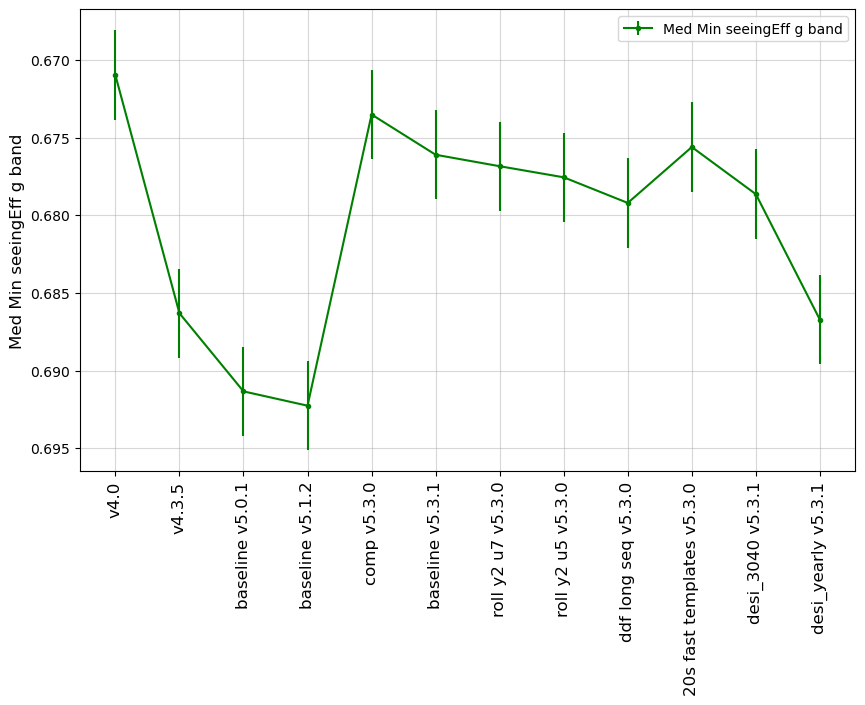

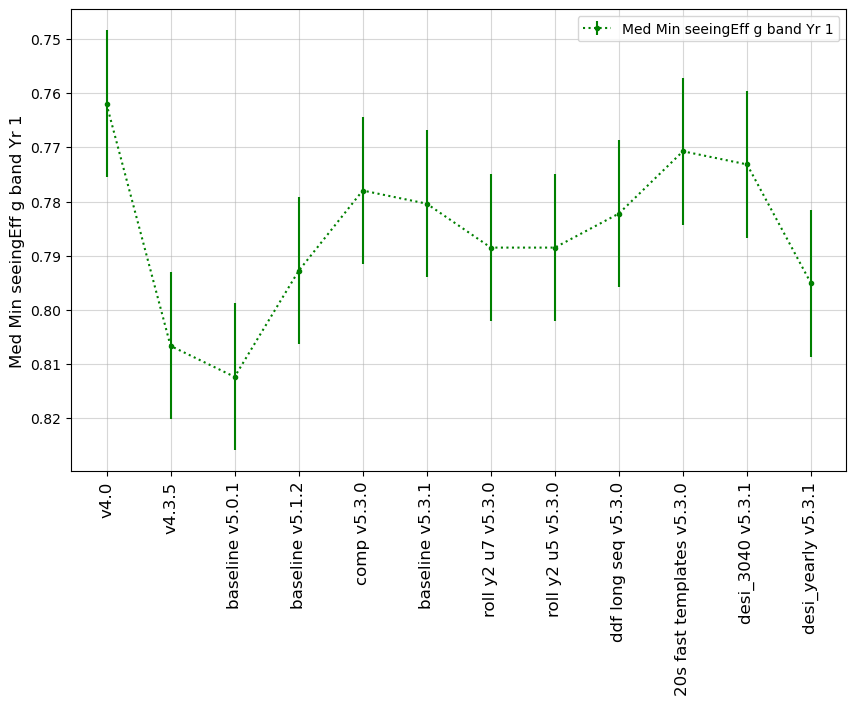

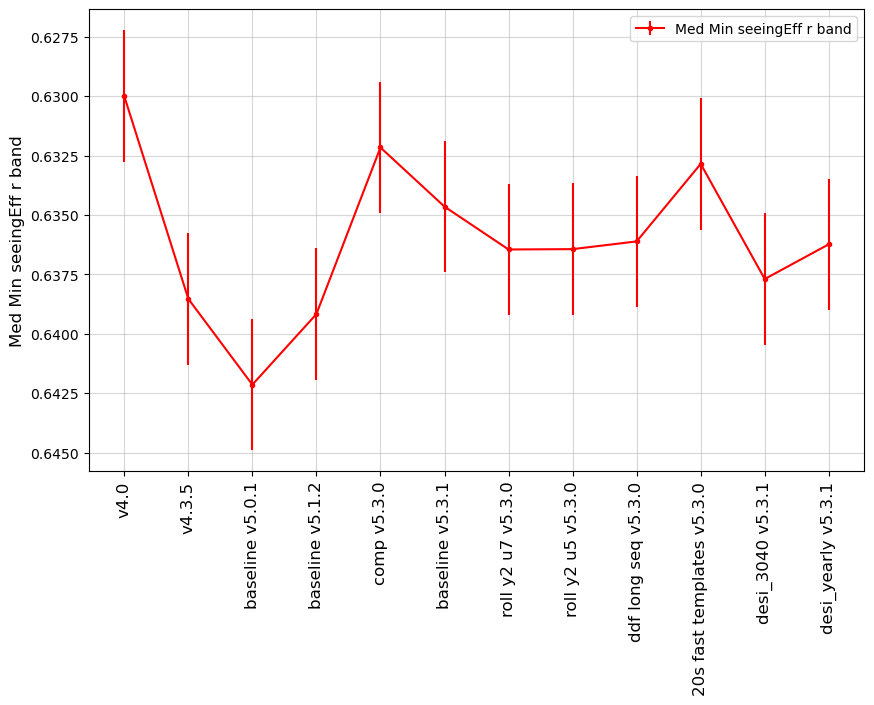

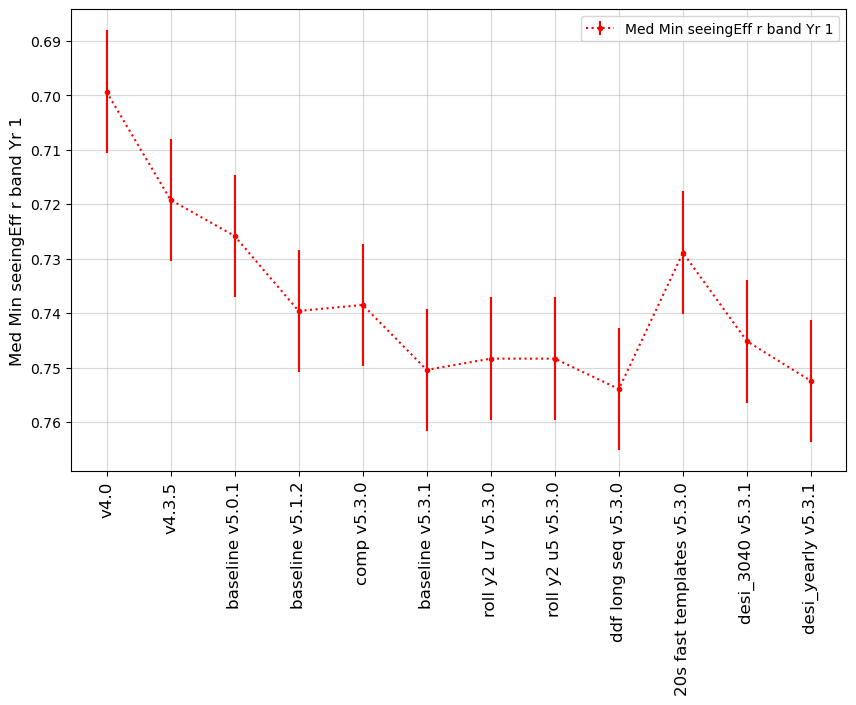

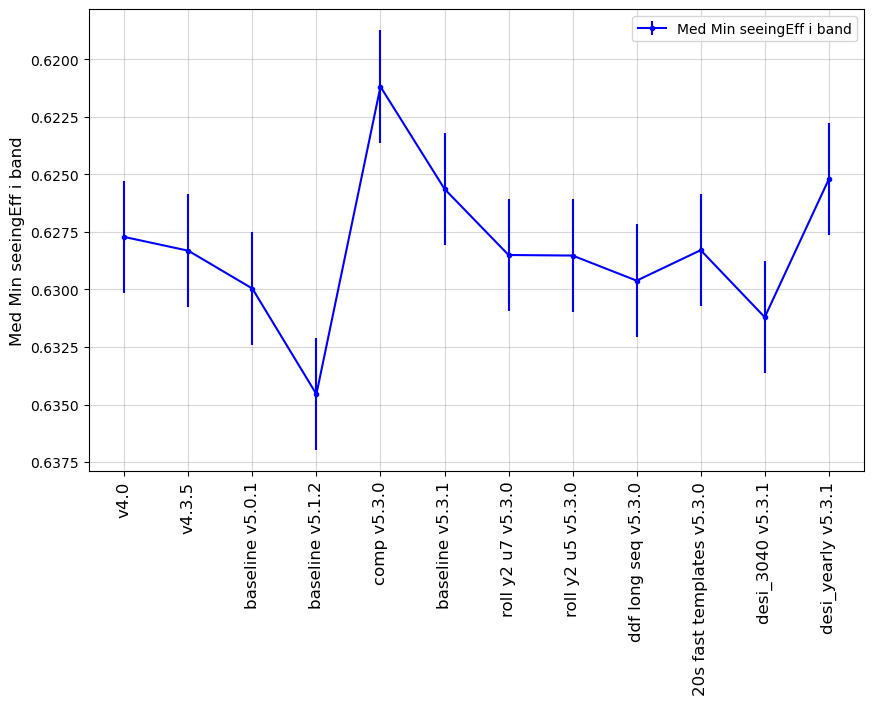

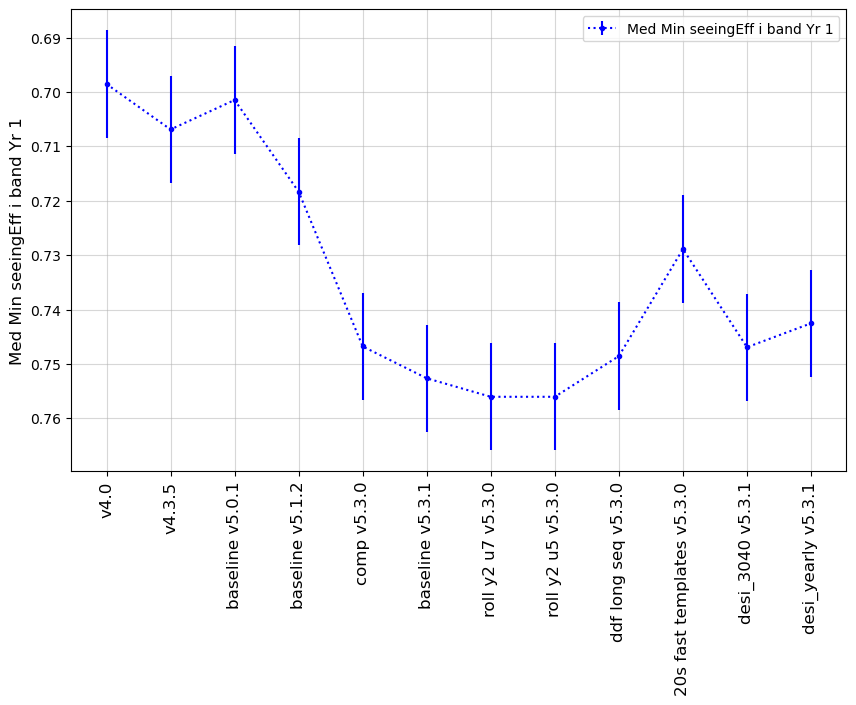

In [87]:
msub = metrics.loc['SL IQ']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline,
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=True)

### Stars
<a id="Stars"></a>
Metrics considering total number of stars available in the survey. 

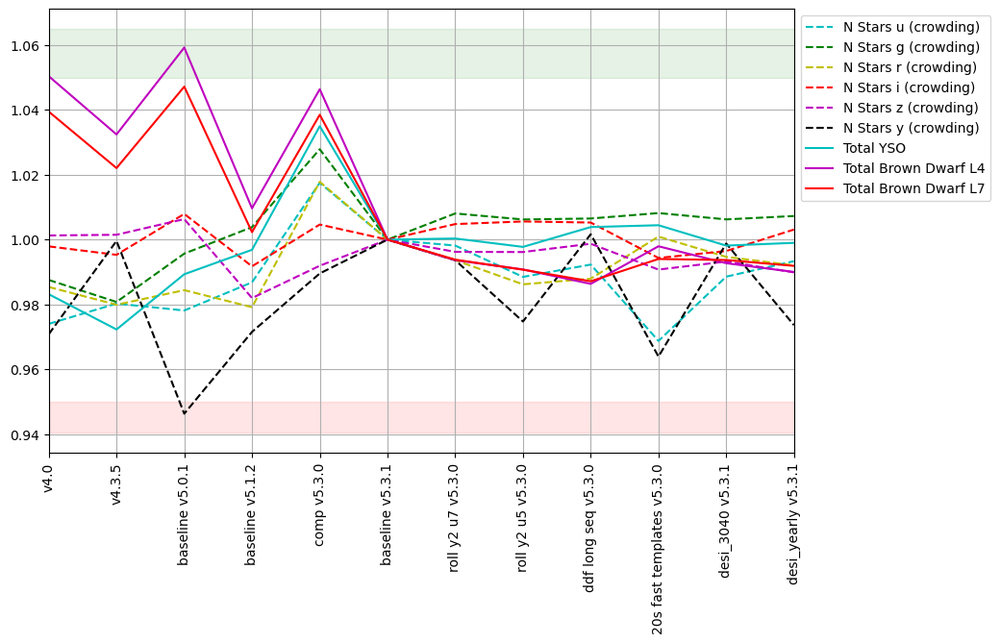

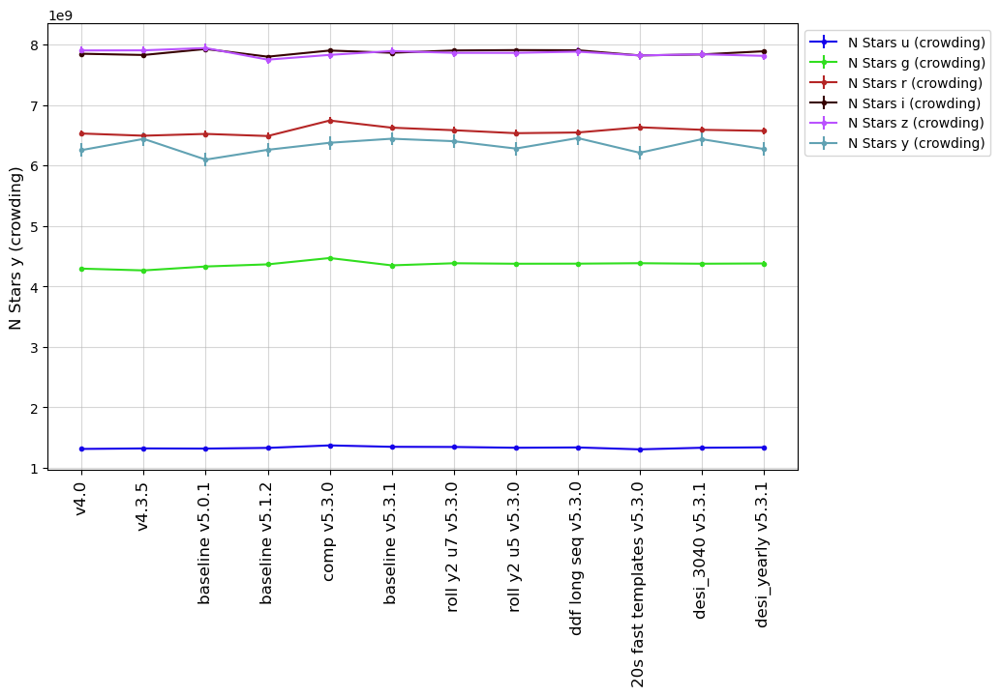

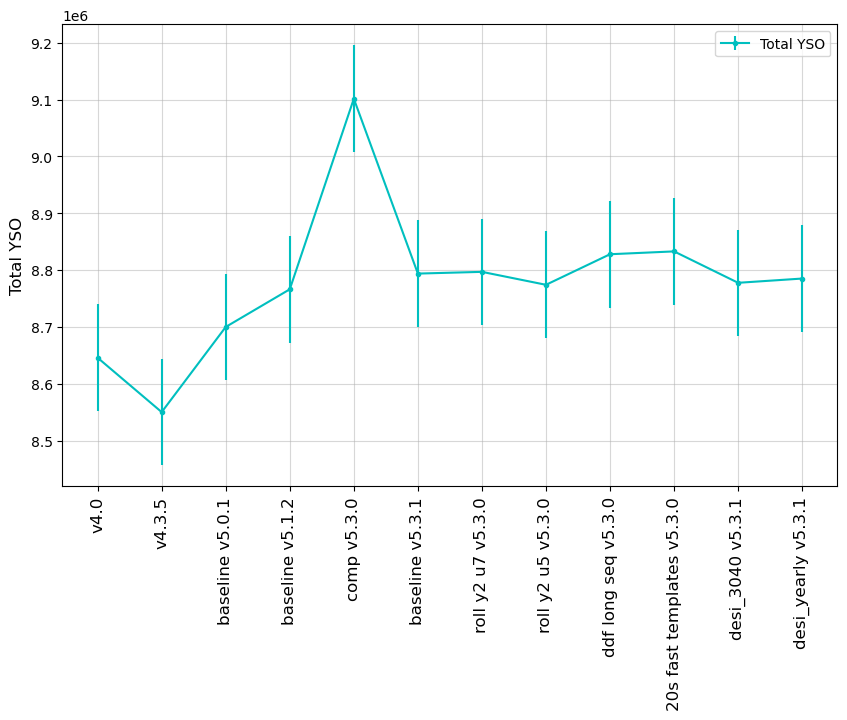

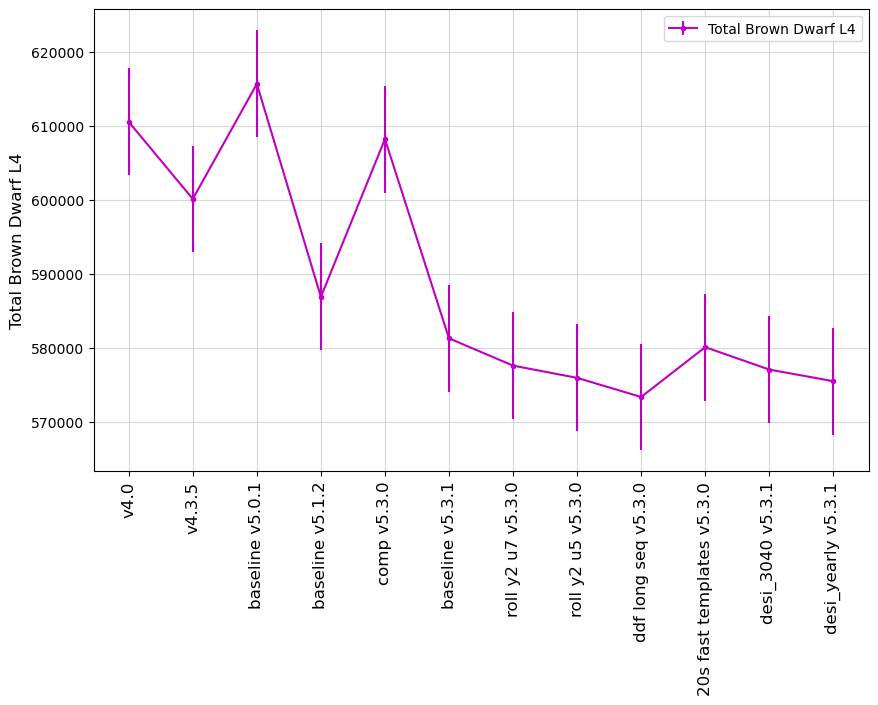

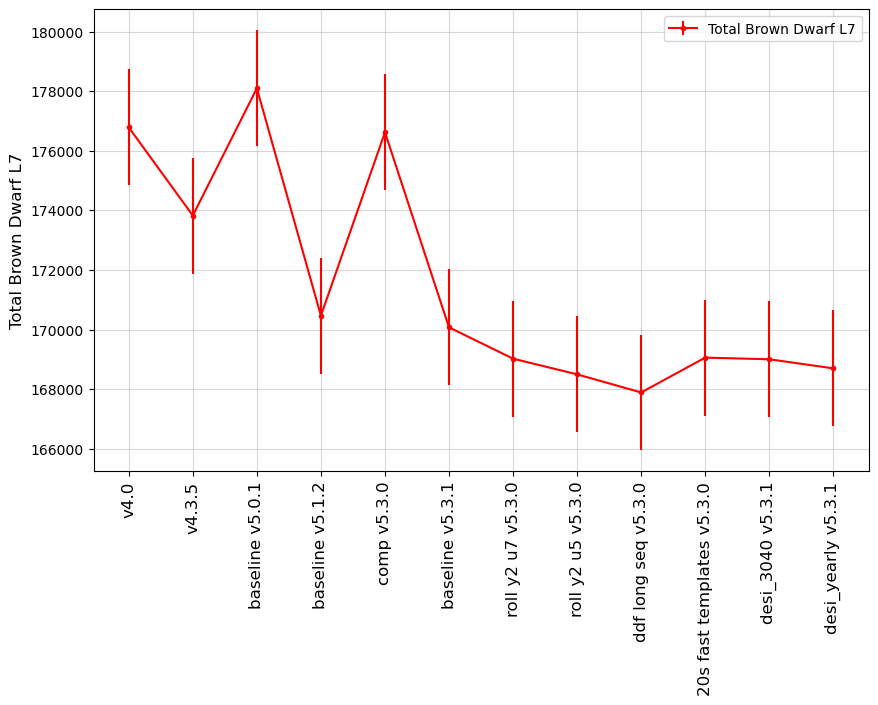

In [88]:
msub = metrics.loc['Stars']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

msub = metrics.loc['Stars'][0:6]
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 cmap=filter_color_map,
                                 metric_subset=msub, sep_plots=False)

msub = metrics.loc['Stars'][6:]
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=True)

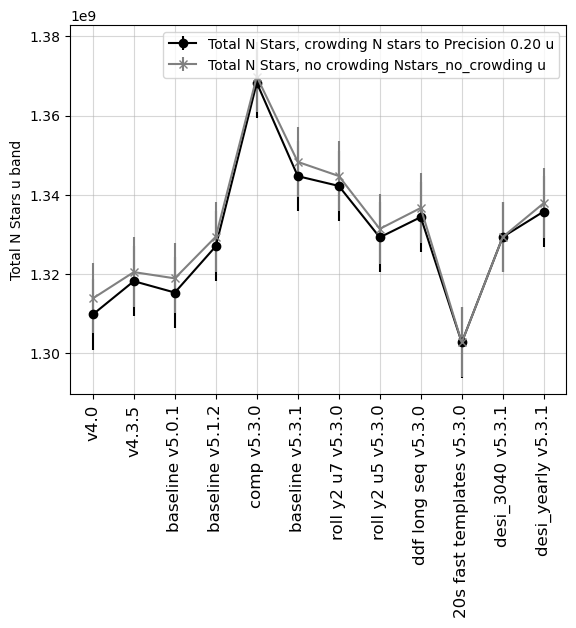

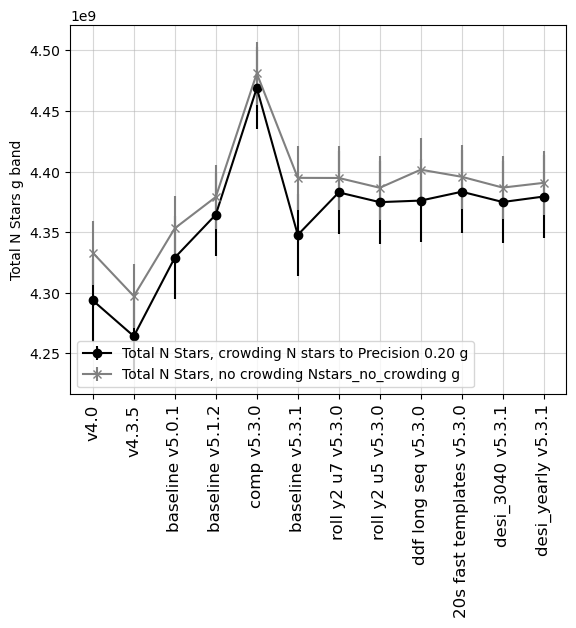

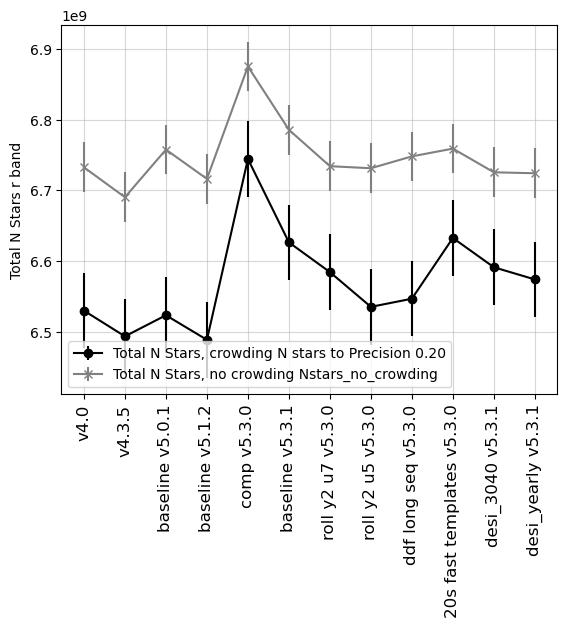

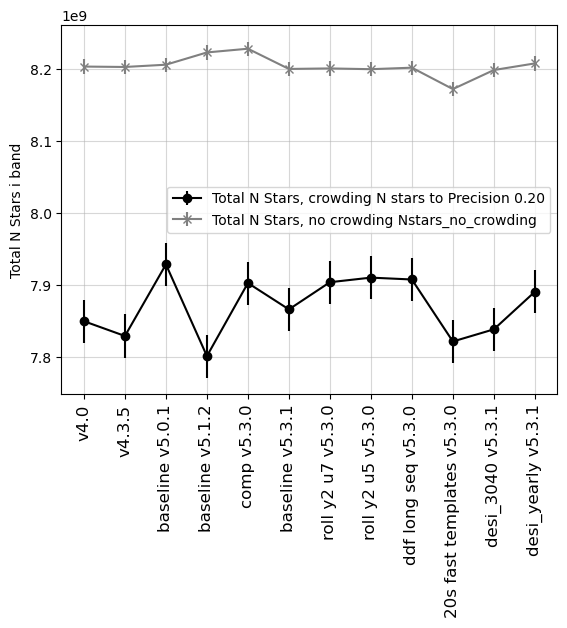

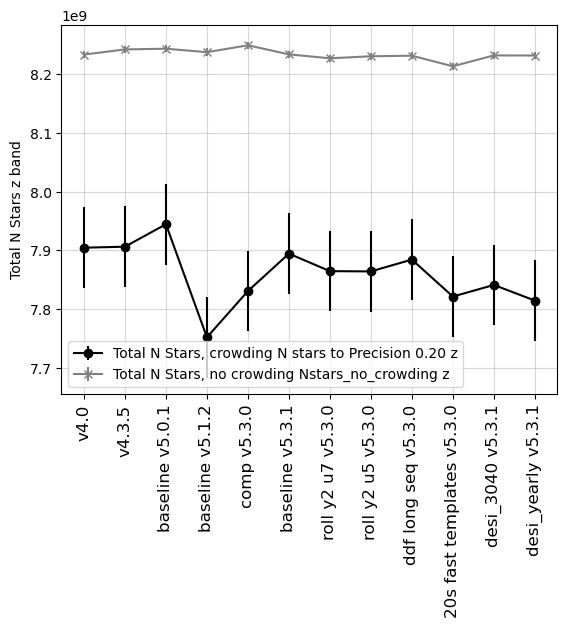

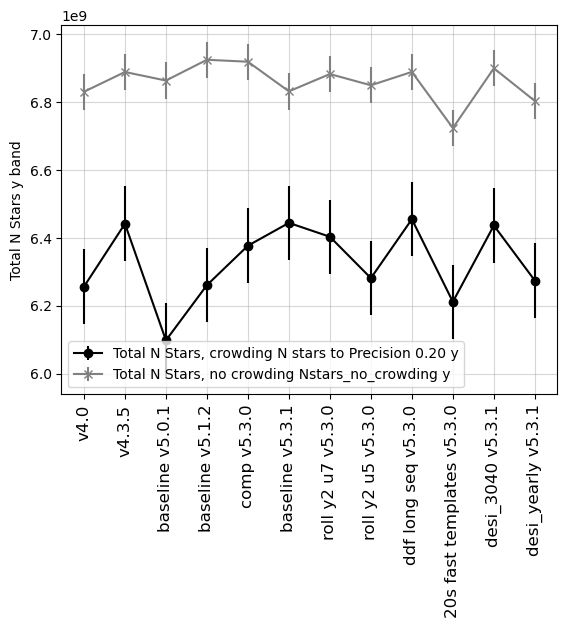

In [92]:
for f in 'ugrizy':
    mm = [m for m in summaries if "Total N Stars" in m and f" {f} " in m]
    fig, ax = plt.subplots()
    for m, marker, color in zip(mm, ['o', 'x'], ['black', 'gray']):
        ax.errorbar(list(rdict.values())[-13:-1], summaries.loc[runs, m], yerr=dev[m], 
                    color=color, marker=marker, linestyle='-', label=m.rstrip(' HealpixSlicer'))
    ax.legend()
    ax.set_ylabel(f"Total N Stars {f} band")
    ax.tick_params(axis='x', labelrotation = 90, labelsize='large')
    ax.grid(True, alpha=0.5)

### Milky Way & Local Volume 
<a id="MWLV"></a>
Metrics for the local volume and milky way. These metrics tend to have a focus on galactic plane coverage, south celestial pole or SMC & LMC coverage. 


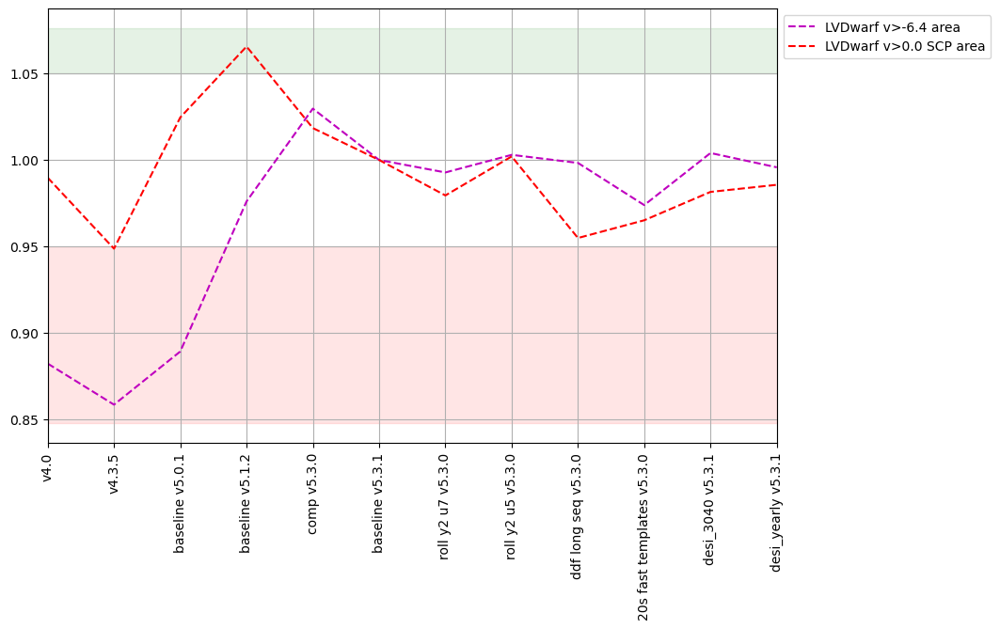

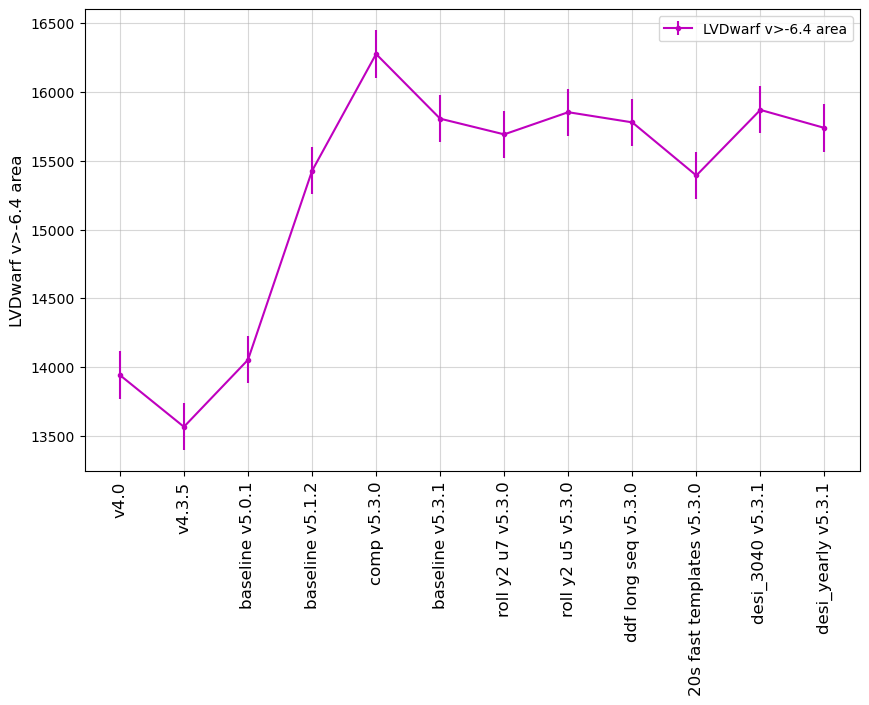

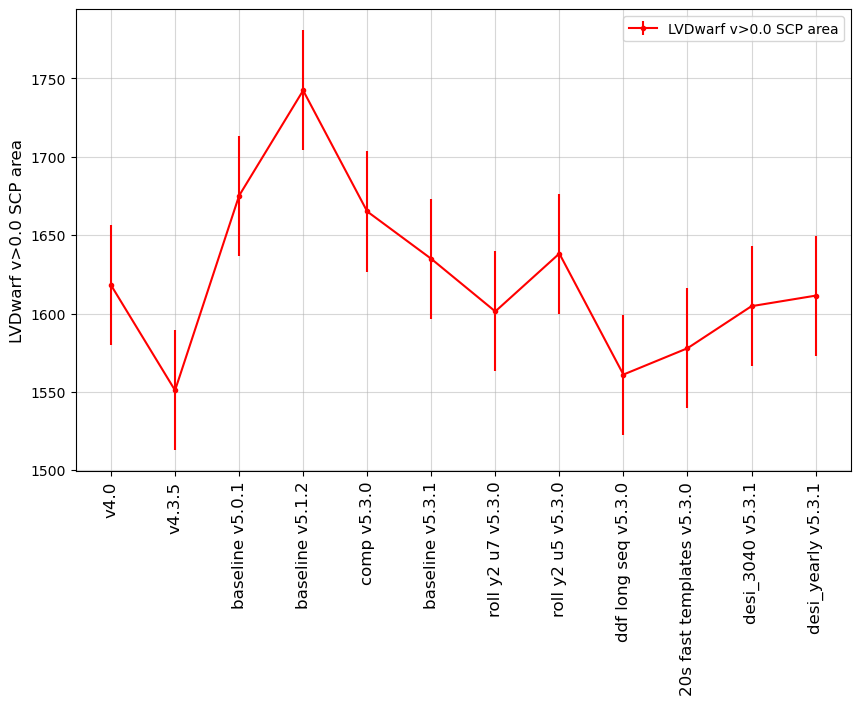

In [90]:
msub = metrics.loc['Local Volume']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=True)

metric,Identity Number of Exposures UniSlicer,Identity Counts_DD:COSMOS UniSlicer,Identity Counts_DD:ECDFS UniSlicer,Identity Counts_DD:EDFS_a UniSlicer,Identity Counts_DD:EDFS_b UniSlicer,Identity Counts_DD:ELAISS1 UniSlicer,Identity Counts_DD:XMM_LSS UniSlicer
run,,,,,,,
baseline_v4.0_10yrs,2038634.0,43594.0,23902.0,12056.0,12020.0,22944.0,23522.0
baseline_v4.3.5_10yrs,2019461.0,45670.0,23710.0,11811.0,11777.0,22721.0,23250.0
baseline_v5.0.1_10yrs,2092088.0,46099.0,23295.0,15398.0,15159.0,21828.0,20808.0
baseline_v5.1.2_10yrs,2052715.0,39390.0,22540.0,15686.0,15595.0,22013.0,17721.0
comp_survey_v5.3.0_10yrs,2031801.0,47739.0,22959.0,15565.0,15471.0,21043.0,19859.0
baseline_v5.3.1_10yrs,1844189.0,47210.0,23196.0,15294.0,15017.0,19582.0,19505.0
roll_mash_v5.3.0_10yrs,1842168.0,47862.0,23207.0,15406.0,15195.0,19525.0,19409.0
roll_u5_v5.3.0_10yrs,1842710.0,47852.0,23191.0,15405.0,15196.0,19625.0,19450.0
ddf_sd_v5.3.0_10yrs,1841451.0,50323.0,25736.0,17057.0,16833.0,21812.0,21492.0


Percent of visits in DDF


run
baseline_v4.0_10yrs              6.77
baseline_v4.3.5_10yrs            6.88
baseline_v5.0.1_10yrs            6.82
baseline_v5.1.2_10yrs            6.48
comp_survey_v5.3.0_10yrs         7.02
baseline_v5.3.1_10yrs            7.58
roll_mash_v5.3.0_10yrs           7.63
roll_u5_v5.3.0_10yrs             7.64
ddf_sd_v5.3.0_10yrs              8.32
faster_templates_v5.3.0_10yrs    7.47
desi_3040_v5.3.1_10yrs           7.63
desi_yearly_v5.3.1_10yrs         7.61
dtype: float64

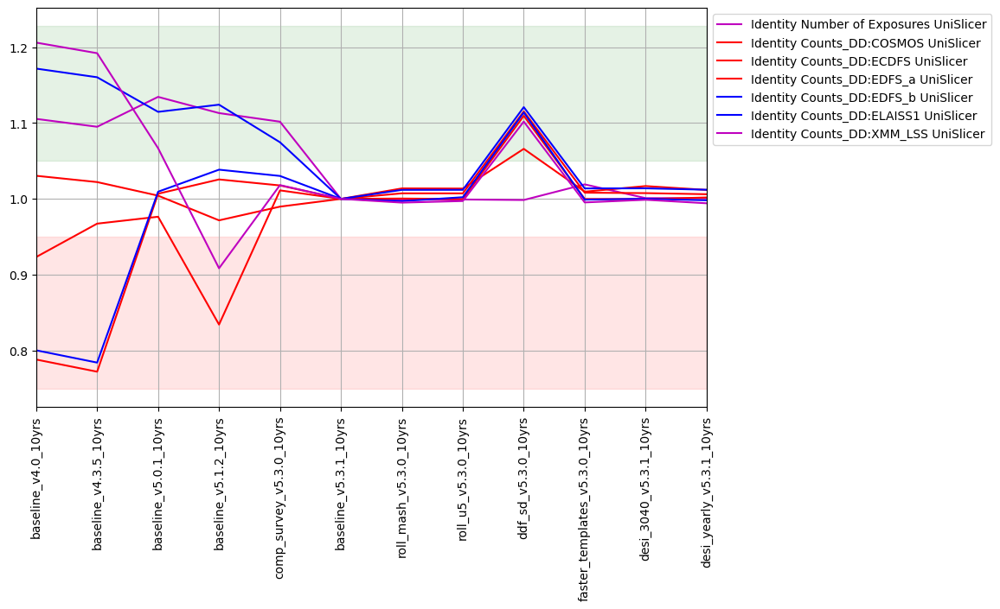

In [91]:
# First let's check the total number of visits in the DDFS, 
# as this has a significant impact on the depths and everything else. 
count_metrics = ['Identity Number of Exposures UniSlicer', 'Identity Counts_DD:COSMOS UniSlicer',
 'Identity Counts_DD:ECDFS UniSlicer',
 #'Identity Counts_DD:EDFS, a UniSlicer',
 #'Identity Counts_DD:EDFS, b UniSlicer',
 'Identity Counts_DD:EDFS_a UniSlicer',
 'Identity Counts_DD:EDFS_b UniSlicer',
 'Identity Counts_DD:ELAISS1 UniSlicer',
 #'Identity Counts_DD:XMM-LSS UniSlicer',
 'Identity Counts_DD:XMM_LSS UniSlicer']

fig, ax = maf.plot_run_metric(summaries.loc[runs, count_metrics],
                             baseline_run=baseline,
                              linestyles='-',
                              markers=[''],
                             horizontal_quantity='run',
                             vertical_quantity='value',
                             shade_fraction=.05)
#ax.set_ylim(0.3, 1.8)

display(summaries.loc[runs, count_metrics])

print("Percent of visits in DDF")
display((100*summaries.loc[runs, count_metrics[1:]].sum(axis=1)/summaries.loc[runs, count_metrics[0]]).round(2))